# Light Curve Parameter Inference Using a Neural Network Approach

# Imports

In [1]:
# general modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.lines as mlines
import os, sys, time, glob
import json
import copy
import scipy
import argparse
import warnings
from tqdm import tqdm

In [2]:
# pytorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset, random_split
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter

In [3]:
# bilby
import bilby
from bilby.core.prior import Uniform, DeltaFunction
from bilby.core.likelihood import GaussianLikelihood

In [4]:
# nflows
from nflows.nn.nets.resnet import ResidualNet
from nflows import transforms, distributions, flows
from nflows.distributions import StandardNormal
from nflows.flows import Flow
from nflows.transforms.autoregressive import MaskedAffineAutoregressiveTransform
from nflows.transforms import CompositeTransform, RandomPermutation
import nflows.utils as torchutils

In [5]:
# extras
from IPython.display import clear_output
from time import time
from time import sleep
import corner
import torchvision
import torchvision.transforms as transforms
from os.path import exists

In [6]:
# importing resnet from ML4GW pe

from resnet import ResNet

In [7]:
# checking gpu status, ensures tensors are stored on the same device

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using {device}")

Using cuda


# Data Specific Parameters and Priors

Light curve generation is done through the nmma package on github: https://github.com/nuclear-multimessenger-astronomy/nmma/tree/main. Light curve data generation can be done either through the command line or through a python script. This notebook uses the Kasen 2017 model to generate 50,000 "fixed" light curves that do not have a time shift, and 50,000 "varied" light curves that have a time shift selected from a uniform prior distribution. Each batch of light curves have 1000 unique combinations of the two inference parameters: the ejecta mass ($M_{ej}$) and the ejecta velocity ($V_{ej}$). 

In [8]:
# json specific parameters, adjust this cell with commands when generating light curves -- MANDATORY

bands = ['ztfg', 'ztfr', 'ztfi']
detection_limit = 22.0
num_repeats = 50
num_channels = 3
num_points = 121
in_features = num_points
data_dir = '/nobackup/users/mmdesai/new_csv/'

In [9]:
# time shift

t_zero = 44242.00021937881
t_min = 44240.00050450478
t_max = 44269.99958898723
days = int(round(t_max - t_min))
time_step = 0.25

In [10]:
# priors

priors = dict()
priors['log10_mej'] = Uniform(-3, -1, name='log10_mej', latex_label='$\log(M_{{ej}})$')
priors['log10_vej'] = Uniform(-1.5, -0.5, name='log10_vej', latex_label='$\log(V_{{ej}})$')
priors['log10_Xlan'] = Uniform(-12, -2, name='log10_Xlan', latex_label='$\log(X_{{lan}})$')
priors['timeshift'] = Uniform(-4, 8, name='timeshift', latex_label='$\Delta\;t$')
priors['distance'] = Uniform(-50, 250, name='luminosity distance', latex_label='$D$')

# Functions

## Dataloading

In [11]:
# function that reads a json file 

def open_json(file_name, dir_path):
    ''' Opens a json file, loads the data as a dictionary, and closes the file 
        file_name = /name of json file.json
        dir_path = directory containing json files 
    '''
    f = open(dir_path + file_name)
    data = json.load(f)
    f.close()
    return data

In [12]:
def get_names(path, label, set, num):
    ''' Gets the file path for the fixed data
        INPUTS:
        path = string, directory to point to
        label = string, label assigned during nmma light curve generation
        set = int, number in directory name
        num = int, number of files to unpack
        RETURNS: 
        list, contains full path file names
    '''
    file_names = [0] * num
    for i in range(0, num):
        one_name = path + '/{}_batch_{}/{}_{}_{}.json'.format(label, set, label, set, i)
        file_names[i] = one_name
    return file_names

def json_to_df(file_names, num_sims, detection_limit=detection_limit, bands=bands):
    ''' Flattens json files into a dataframe
        INPUTS:
        file_names = list, contains full path file names as strings
        num_sims = int, number of files to unpack
        detection_limit = float, photometric detection limit
        bands = list, contains the json photometry keys as strings
        RETURNS:
        pd.DataFrame, contains the photometry data, time, and number of total detections across all bands
    '''
    df_list = [0] * num_sims
    for i in tqdm(range(num_sims)):
        data = json.load(open(file_names[i], "r"))
        df = pd.DataFrame.from_dict(data, orient="columns")
        df_unpacked = pd.DataFrame(columns=bands)
        counter = 0
        for j in range(len(bands)):
            df_unpacked[['t', bands[j], 'x']] = pd.DataFrame(df[bands[j]].tolist(), index= df.index)
            for val in df_unpacked[bands[j]]:
                if val != detection_limit:
                    counter += 1
                else:
                    pass
        df_unpacked['num_detections'] = np.full(len(df_unpacked), counter)
        df_unpacked['sim_id'] = np.full(len(df_unpacked), i)
        df_unpacked = df_unpacked.drop(columns=['x'])
        df_list[i] = df_unpacked
    return df_list

In [13]:
# padding functions

def gen_prepend_filler(data_filler, t_min, t_max, step = 0.25):
    # Fill according to step size, regardless of count
    ar = np.arange(start=t_min, stop=t_max, step=step)
    filler_dict = {'t':ar, 'ztfg':[data_filler]*len(ar), 'ztfr':[data_filler]*len(ar), 'ztfi':[data_filler]*len(ar),
                   'sim_id':[np.nan]*len(ar), 'num_detections':[np.nan]*len(ar)}
    filler_df = pd.DataFrame(filler_dict)
    return filler_df


def gen_append_filler(data_filler, t_min, count, step=0.25):
    # Fill according to min value and specified count
    l = np.arange(start=t_min, stop=t_min+(count*step), step=step)
    filler_dict = {'t':l, 'ztfg':[data_filler]*len(l), 'ztfr':[data_filler]*len(l), 'ztfi':[data_filler]*len(l),
                   'sim_id':[np.nan]*len(l), 'num_detections':[np.nan]*len(l)}
    filler_df = pd.DataFrame(filler_dict)
    return filler_df

def pad_the_data(actual_df, desired_count=num_points, filler_time_step=time_step, filler_data=detection_limit):

    actual_df.iloc[:, actual_df.columns.get_loc('t')] = actual_df.iloc[:, actual_df.columns.get_loc('t')].apply(lambda x: x - t_min) 

    cat_df = actual_df
    cat_count = len(cat_df)
    prepended_count = 0

    if (actual_df['t'].min() >= filler_time_step):
        filler_max_time = actual_df['t'].min() - filler_time_step  # stop one time step before current min
        prepend_filler_df = gen_prepend_filler(filler_data, 0, filler_max_time, filler_time_step)
        prepended_count = len(prepend_filler_df)
        cat_df = pd.concat([prepend_filler_df, actual_df], ignore_index=True)
        cat_count = len(cat_df)

    append_count = desired_count - cat_count

    if append_count > 0: 
        max_t = cat_df['t'].max() 
        steps_per_count = 1/filler_time_step
        filler_min_time = int(max_t*steps_per_count)/steps_per_count + filler_time_step  # start at next time step
        append_filler_df = gen_append_filler(filler_data, filler_min_time, append_count)
        cat_df = pd.concat([cat_df, append_filler_df], ignore_index=True)
        cat_count = len(cat_df)

    assert(len(cat_df) == desired_count)

    return cat_df


In [14]:
# function for recursively padding given a list of dataframes

def pad_all_dfs(df_list):
    
    padded_df_list = []
    for i in tqdm(range(len(df_list))):
        df = df_list[i]
        sim_num = df.iloc[0, df.columns.get_loc('sim_id')]
        det_num = df.iloc[0, df.columns.get_loc('num_detections')]
        df = pad_the_data(df)
        df['sim_id'] = np.full(len(df), sim_num)
        df['num_detections'] = np.full(len(df), det_num)
        padded_df_list.append(df)
    return padded_df_list

In [15]:
def load_in_data(data_dir, name, csv_no, num_points=num_points, num_repeats=num_repeats):
    data_list = []
    for i in range (0, csv_no):
        data_list.append(pd.read_csv(data_dir + '{}_{}.csv'.format(name, i)))
    data_df = pd.concat(data_list)
    num_sims = int(len(data_df)/num_points)
    sim_list = []
    sim_no = 0
    for i in range(0, num_sims):
        for j in range(0, num_points):
            sim_list.append(sim_no)
        sim_no += 1
    data_df['sim_id'] = sim_list
    batch_list = []
    batch_no = 0
    num_batches = int((len(data_df)/num_points)/num_repeats)
    data_df = data_df.iloc[0:(num_batches*num_points*num_repeats), :].copy()
    for i in range(0, num_batches):
        for j in range(0, num_points*num_repeats):
            batch_list.append(batch_no)
        batch_no += 1
    data_df['batch_id'] = batch_list
    return data_df

In [16]:
def match_fix_to_var(data_dir, name1, name2, start, stop, num_points=num_points, num_repeats=num_repeats):
    # initiate list for dataframes
    fixed_list = []
    varied_list = []
    # do all data processing for a given number of dataframes
    for i in range (start, stop):
        # load in the data
        df_var = pd.read_csv(data_dir + '{}_{}.csv'.format(name1, i))
        df_fix = pd.read_csv(data_dir + '{}_{}.csv'.format(name2, i))
        # match the two dataframes to each other based on sim id
        matched = df_var.merge(df_fix, left_on=['sim_id', df_var.groupby('sim_id').cumcount()],
                               right_on=['sim_id', df_fix.groupby('sim_id').cumcount()])
        # grab the fixed and varied portions of the dataframe
        fix_df = matched.iloc[:, 12:]
        var_df = matched.iloc[:, :12]
        # adjust columns and column names
        fix_df.columns = fix_df.columns.str.rstrip('_y')
        var_df.columns = var_df.columns.str.rstrip('_x')
        var_df = var_df.drop(columns=['key_1'])
        # add to list of dataframes
        fixed_list.append(fix_df)
        varied_list.append(var_df)
    # concatenate the list of dataframes together
    fixed_data_df = pd.concat(fixed_list)
    varied_data_df = pd.concat(varied_list)
    # overwrite the simulation id's and add batch id's
    num_sims = int(len(fixed_data_df)/num_points)
    sim_list = []
    sim_no = 0
    for i in range(0, num_sims):
        for j in range(0, num_points):
            sim_list.append(sim_no)
        sim_no += 1
    fixed_data_df['sim_id'] = sim_list
    varied_data_df['sim_id'] = sim_list
    batch_list = []
    batch_no = 0
    num_batches = int((len(fixed_data_df)/num_points)/num_repeats)
    fixed_data_df = fixed_data_df.iloc[0:(num_batches*num_points*num_repeats), :].copy()
    varied_data_df = varied_data_df.iloc[0:(num_batches*num_points*num_repeats), :].copy()
    for i in range(0, num_batches):
        for j in range(0, num_points*num_repeats):
            batch_list.append(batch_no)
        batch_no += 1
    fixed_data_df['batch_id'] = batch_list
    varied_data_df['batch_id'] = batch_list
    
    return fixed_data_df, varied_data_df

In [17]:
def matched(data_dir, name1, name2, start, stop, num_points=num_points, num_repeats=num_repeats):
    # initiate list for dataframes
    matched_list = []
    # do all data processing for a given number of dataframes
    for i in range (start, stop):
        # load in the data
        df_var = pd.read_csv(data_dir + '{}_{}.csv'.format(name1, i))
        df_fix = pd.read_csv(data_dir + '{}_{}.csv'.format(name2, i))
        # match the two dataframes to each other based on sim id
        matched = df_var.merge(df_fix, left_on=['sim_id', df_var.groupby('sim_id').cumcount()],
                               right_on=['sim_id', df_fix.groupby('sim_id').cumcount()])
        matched_list.append(matched)
    matched_df = pd.concat(matched_list)

    return matched_df

In [18]:
def add_batch_sim_nums_all(df, num_points=num_points, num_repeats=num_repeats):
    
    num_batches_split = int((len(df)/num_points)/num_repeats)
    batch_list_split = []
    batch_no = 0
    for i in range(0, num_batches_split):
        for j in range(0, num_repeats*num_points):
            batch_list_split.append(batch_no)
        batch_no += 1
    df['batch_id'] = batch_list_split

    num_sims_split = int(len(df)/num_points)
    sim_list_split = []
    sim_no = 0
    for i in range(0, num_sims_split):
        for j in range(0, num_points):
            sim_list_split.append(sim_no)
        sim_no += 1
    df['sim_id'] = sim_list_split

In [19]:
def get_test_names(path, label, set, num):
    ''' Gets the file path for the fixed data
        INPUTS:
        path = string, directory to point to
        label = string, label assigned during nmma light curve generation
        set = int, number in directory name
        num = int, number of files to unpack
        RETURNS: 
        list, contains full path file names
    '''
    file_names = [0] * num
    for i in range(0, num):
        one_name = path + '/{}{}_{}.json'.format(label, set, i)
        file_names[i] = one_name
    return file_names

In [20]:
# function for loading the data

def repeated_df_to_tensor(df_varied, df_fixed, batches):
    data_shifted_list = []
    data_unshifted_list = []
    param_shifted_list = []
    param_unshifted_list = []
    for idx in tqdm(range(0, batches)):
        data_shifted = torch.tensor(df_varied.loc[df_varied['batch_id'] == idx].iloc[:, 1:4].values.reshape(num_repeats, num_points, num_channels), 
                                    dtype=torch.float32).transpose(1, 2)
        data_unshifted = torch.tensor(df_fixed.loc[df_fixed['batch_id'] == idx].iloc[:, 1:4].values.reshape(num_repeats, num_points, num_channels), 
                                    dtype=torch.float32).transpose(1, 2)
        param_shifted = torch.tensor(df_varied.loc[df_varied['batch_id'] == idx].iloc[::num_points, 6:11].values, 
                                    dtype=torch.float32).unsqueeze(2).transpose(1,2)
        param_unshifted = torch.tensor(df_fixed.loc[df_fixed['batch_id'] == idx].iloc[::num_points, 5:10].values, 
                                    dtype=torch.float32).unsqueeze(2).transpose(1,2)
        data_shifted_list.append(data_shifted)
        data_unshifted_list.append(data_unshifted)
        param_shifted_list.append(param_shifted)
        param_unshifted_list.append(param_unshifted)

    return data_shifted_list, data_unshifted_list, param_shifted_list, param_unshifted_list

In [21]:
class Paper_data(Dataset):
    def __init__(self, data_shifted_paper, data_unshifted_paper,
                 param_shifted_paper, param_unshifted_paper,
                 num_batches_paper_sample):
        super().__init__()
        self.data_shifted_paper = data_shifted_paper
        self.data_unshifted_paper = data_unshifted_paper
        self.param_shifted_paper = param_shifted_paper
        self.param_unshifted_paper = param_unshifted_paper
        self.num_batches_paper_sample = num_batches_paper_sample

    def __len__(self):
        return self.num_batches_paper_sample

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
            
        # gr_color = self.data_shifted_paper[idx][:, 0, :] - self.data_shifted_paper[idx][:, 1, :]
        # gi_color = self.data_shifted_paper[idx][:, 0, :] - self.data_shifted_paper[idx][:, 2, :]
        # ri_color = self.data_shifted_paper[idx][:, 1, :] - self.data_shifted_paper[idx][:, 2, :]
        # color_shifted_paper = torch.stack((gr_color, gi_color, ri_color), dim = 1)
        # gr_color_fix = self.data_unshifted_paper[idx][:, 0, :] - self.data_unshifted_paper[idx][:, 1, :]
        # gi_color_fix = self.data_unshifted_paper[idx][:, 0, :] - self.data_unshifted_paper[idx][:, 2, :]
        # ri_color_fix = self.data_unshifted_paper[idx][:, 1, :] - self.data_unshifted_paper[idx][:, 2, :]
        # color_unshifted_paper = torch.stack((gr_color_fix, gi_color_fix, ri_color_fix), dim = 1)
        
        return (
            self.param_shifted_paper[idx].to(device),
            self.param_unshifted_paper[idx].to(device),
            self.data_shifted_paper[idx].to(device),
            self.data_unshifted_paper[idx].to(device)
            # color_shifted_paper,
            # color_unshifted_paper
        )

## Loss

In [22]:
# functions for similarity loss

class VICRegLoss(nn.Module):
    def forward(self, x, y, wt_repr=1.0, wt_cov=1.0, wt_std=1.0):
        repr_loss = F.mse_loss(x, y)
        x = x - x.mean(dim=0)
        y = y - y.mean(dim=0)
        N = x.size(0)
        D = x.size(-1)
        std_x = torch.sqrt(x.var(dim=0) + 0.0001)
        std_y = torch.sqrt(y.var(dim=0) + 0.0001)
        std_loss = torch.mean(F.relu(1 - std_x)) / 2 + torch.mean(F.relu(1 - std_y)) / 2
        x = (x-x.mean(dim=0))/std_x
        y = (y-y.mean(dim=0))/std_y
        # transpose dims 1 and 2; keep batch dim i.e. 0, unchanged
        x = x.unsqueeze(1)
        y = y.unsqueeze(1)
        cov_x = (x.transpose(1, 2) @ x) / (N - 1)
        cov_y = (y.transpose(1, 2) @ y) / (N - 1)
        cov_loss = self.off_diagonal(cov_x).pow_(2).sum().div(D)
        cov_loss += self.off_diagonal(cov_y).pow_(2).sum().div(D)
        # above is when you have an extra channel dim, below is for 2-dim
        # cov_x = (x.transpose(0, 1) @ x) / (N - 1)
        # cov_y = (y.transpose(0, 1) @ y) / (N - 1)
        # cov_loss = self.sum_below_diagonal(cov_x).div(D)
        # cov_loss += self.sum_below_diagonal(cov_y).div(D)
        # cov_x = (x.transpose(0, 1) @ x) / (N - 1)
        # cov_y = (y.transpose(0, 1) @ y) / (N - 1)
        # cov_loss = self.off_diagonal(cov_x).pow_(2).sum().div(D)
        # cov_loss += self.off_diagonal(cov_y).pow_(2).sum().div(D)
        
        s = wt_repr*repr_loss + wt_cov*cov_loss + wt_std*std_loss
        return s, repr_loss, cov_loss, std_loss

    def off_diagonal(self,cov):
        num_batch, n, m = cov.shape
        assert n == m
        # All off diagonal elements from complete batch flattened
        # import pdb; pdb.set_trace()
        return cov.flatten(start_dim=1)[...,:-1].view(num_batch, n - 1, n + 1)[...,1:].flatten()

    # def sum_below_diagonal(self, x):
    #     n, m = x.shape
    #     assert n == m
    #     import pdb; pdb.set_trace()
    #     return x.tril().flatten().pow_(2).sum() - x.diagonal().pow_(2).sum()

    # def off_diagonal(self, x):
    #     n, m = x.shape
    #     assert n == m
    #     return x.flatten()[...,:-1][...,1:]


In [23]:
# define the loss
vicreg_loss = VICRegLoss()

## Similarity Embedding

In [24]:
# define the neural network

class ConvResidualBlock(nn.Module):
    def __init__(self, channels, kernel_size, activation=F.relu, dropout_probability=0.1, use_batch_norm=True, zero_initialization=True):
        super().__init__()
        self.activation = activation
        self.use_batch_norm = use_batch_norm
        if use_batch_norm:
            self.batch_norm_layers = nn.ModuleList([nn.BatchNorm1d(channels, eps=1e-3) for _ in range(2)])
        self.conv_layers = nn.ModuleList([nn.Conv1d(channels, channels, kernel_size=kernel_size, padding='same') for _ in range(2)])
        self.dropout = nn.Dropout(p=dropout_probability)
        if zero_initialization:
            nn.init.uniform_(self.conv_layers[-1].weight, -1e-3, 1e-3)
            nn.init.uniform_(self.conv_layers[-1].bias, -1e-3, 1e-3)

    def forward(self, inputs):
        temps = inputs
        if self.use_batch_norm:
            temps = self.batch_norm_layers[0](temps)
        temps = self.activation(temps)
        temps = self.conv_layers[0](temps)
        if self.use_batch_norm:
            temps = self.batch_norm_layers[1](temps)
        temps = self.activation(temps)
        temps = self.dropout(temps)
        temps = self.conv_layers[1](temps)
        return inputs + temps


In [25]:
class ConvResidualNet(nn.Module):
    def __init__(self, in_channels, out_channels, hidden_channels, num_blocks, kernel_size, activation=F.relu, dropout_probability=0.1, use_batch_norm=True):
        super().__init__()
        self.hidden_channels = hidden_channels
        self.initial_layer = nn.Conv1d(in_channels=in_channels, out_channels=hidden_channels, kernel_size=kernel_size, padding='same')
        self.blocks = nn.ModuleList([ConvResidualBlock(channels=hidden_channels, activation=activation, dropout_probability=dropout_probability, use_batch_norm=use_batch_norm, kernel_size=kernel_size) for _ in range(num_blocks)])
        self.final_layer = nn.Conv1d(hidden_channels, out_channels, kernel_size=kernel_size, padding='same')

    def forward(self, inputs):
        temps = self.initial_layer(inputs)
        for block in self.blocks:
            temps = block(temps)
        outputs = self.final_layer(temps)
        return outputs


In [26]:
class SimilarityEmbedding(nn.Module):
    """Simple Dense embedding"""
    def __init__(self, num_dim=3, num_hidden_layers_f=1, num_hidden_layers_h=1, num_blocks=4, kernel_size=5, num_dim_final=10, activation=torch.tanh):
        super(SimilarityEmbedding, self).__init__()
        self.layer_norm = nn.LayerNorm([num_channels, num_points])
        self.num_hidden_layers_f = num_hidden_layers_f
        self.num_hidden_layers_h = num_hidden_layers_h
        self.layers_f = ResNet(num_ifos=[3,None], layers=[2,2], kernel_size=kernel_size, context_dim=100)
        self.contraction_layer = nn.Linear(in_features=100, out_features=num_dim)
        # self.layers_f = ConvResidualNet(in_channels=num_channels, out_channels=1, hidden_channels=20, num_blocks=num_blocks, kernel_size=kernel_size)
        # self.contraction_layer = nn.Linear(in_features=in_features, out_features=num_dim)
        self.expander_layer = nn.Linear(num_dim, 20)
        self.layers_h = nn.ModuleList([nn.Linear(20, 20) for _ in range(num_hidden_layers_h)])
        self.final_layer = nn.Linear(20, num_dim_final)
        self.activation = activation
        
    def forward(self, x):
        x = self.layers_f(x)
        x = self.contraction_layer(x)
        representation = torch.clone(x)
        x = self.activation(self.expander_layer(x))
        for layer in self.layers_h:
            x = layer(x)
            x = self.activation(x)
        x = self.final_layer(x)
        return x, representation

## Training

In [27]:
# function to train neural network for one epoch

def train_one_epoch_se(epoch_index, tb_writer, data_loader, **vicreg_kwargs):
    running_sim_loss = 0.
    last_sim_loss = 0.

    for idx, val in enumerate(data_loader, 1):
        augmented_shift, unshifted_shift, augmented_data, unshifted_data = val      
        augmented_shift = augmented_shift.reshape((-1,)+augmented_shift.shape[2:])
        unshifted_shift = unshifted_shift.reshape((-1,)+unshifted_shift.shape[2:])
        augmented_data = augmented_data.reshape((-1,)+augmented_data.shape[2:])   
        unshifted_data = unshifted_data.reshape((-1,)+unshifted_data.shape[2:])

        embedded_values_aug, _ = similarity_embedding(augmented_data)
        embedded_values_orig, _ = similarity_embedding(unshifted_data)
        similar_embedding_loss, _repr, _cov, _std = vicreg_loss(
            embedded_values_aug,
            embedded_values_orig,
            **vicreg_kwargs
        )
        optimizer.zero_grad()
        similar_embedding_loss.backward()
        optimizer.step()

        # Gather data and report
        running_sim_loss += similar_embedding_loss.item()
        n = 10
        if idx % n == 0:
            last_sim_loss = running_sim_loss / n
            print(' Avg. train loss/batch after {} batches = {:.4f}'.format(idx, last_sim_loss))
            print(f'Last {_repr.item():.2f}; {_cov.item():.2f}; {_std.item():.2f}')
            tb_x = epoch_index * len(data_loader) + idx
            tb_writer.add_scalar('SimLoss/train', last_sim_loss, tb_x)
            running_sim_loss = 0.

    return last_sim_loss

In [28]:
# function to get loss for validation set for one epoch of training

def val_one_epoch_se(epoch_index, tb_writer, data_loader, **vicreg_kwargs):
    running_sim_loss = 0.
    last_sim_loss = 0.

    for idx, val in enumerate(data_loader, 1):
        augmented_shift, unshifted_shift, augmented_data, unshifted_data = val
        augmented_shift = augmented_shift.reshape((-1,)+augmented_shift.shape[2:])
        unshifted_shift = unshifted_shift.reshape((-1,)+unshifted_shift.shape[2:])
        augmented_data = augmented_data.reshape((-1,)+augmented_data.shape[2:])
        unshifted_data = unshifted_data.reshape((-1,)+unshifted_data.shape[2:])

        embedded_values_aug, unshifted_shift = similarity_embedding(augmented_data)
        embedded_values_orig, unshifted_shift = similarity_embedding(unshifted_data)
        similar_embedding_loss, _repr, _cov, _std = vicreg_loss(
            embedded_values_aug,
            embedded_values_orig,
            **vicreg_kwargs
        )

        running_sim_loss += similar_embedding_loss.item()
        n = 1
        if idx % n == 0:
            last_sim_loss = running_sim_loss / n
            tb_x = epoch_index * len(data_loader) + idx + 1
            tb_writer.add_scalar('SimLoss/val', last_sim_loss, tb_x)
            #print(f'Last {_repr.item():.2f}; {_cov.item():.2f}; {_std.item():.2f}')
            tb_writer.flush()
            running_sim_loss = 0.
    tb_writer.flush()

    return last_sim_loss


# Data Processing

### Varied Data

In [31]:
varied_simembed_dict = {}

In [32]:
# get the varied data

sim_path = '/nobackup/users/mmdesai/lcdata'
num_sims = 25000

simembed_num_lc_list = [24750, 25000, 25000, 23550, 25000, 19450, 23950, 22650, 25000, 25000,
                        23600, 21200, 25000, 21600, 25000, 25000, 25000, 25000, 25000, 25000]

for i in range (0, 20):
    # get the names of each file
    file_names = get_names(sim_path, 'varied', i, simembed_num_lc_list[i])
    # open the files as dataframes
    varied_simembed_dict['varied_simembed_data_{}'.format(i)] = json_to_df(file_names, simembed_num_lc_list[i])
    # pad the data
    varied_simembed_dict['varied_simembed_data_{}'.format(i)] = pad_all_dfs(varied_simembed_dict['varied_simembed_data_{}'.format(i)])

 85%|████████▍ | 16529/19450 [02:25<00:22, 129.63it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

100%|██████████| 25000/25000 [01:29<00:00, 279.75it/s]


In [33]:
varied_simembed_dict['varied_simembed_data_0'][-1]

,t,ztfg,ztfr,ztfi,sim_id,num_detections
0,0.00,22.0,22.0,22.0,24749,10
1,0.25,22.0,22.0,22.0,24749,10
2,0.50,22.0,22.0,22.0,24749,10
3,0.75,22.0,22.0,22.0,24749,10
4,1.00,22.0,22.0,22.0,24749,10
...,...,...,...,...,...,...
116,29.00,22.0,22.0,22.0,24749,10
117,29.25,22.0,22.0,22.0,24749,10
118,29.50,22.0,22.0,22.0,24749,10
119,29.75,22.0,22.0,22.0,24749,10


In [34]:
len(varied_simembed_dict)

20

Text(0, 0.5, 'Magnitude')

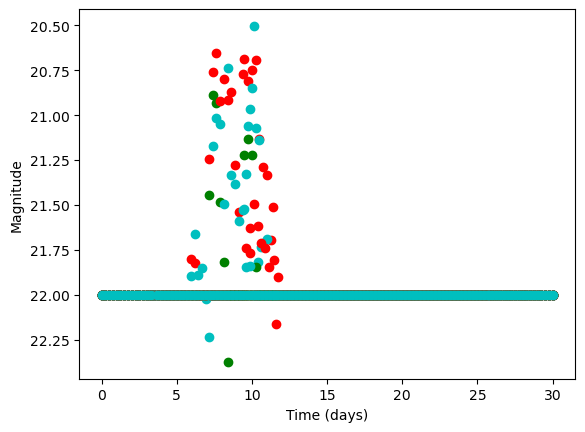

In [36]:
# plot a small sample of the varied light curves

for i in range(0, 300, 50):
    plt.scatter(varied_simembed_dict['varied_simembed_data_0'][i]['t'], varied_simembed_dict['varied_simembed_data_0'][i]['ztfg'], color = 'g')
    plt.scatter(varied_simembed_dict['varied_simembed_data_0'][i]['t'], varied_simembed_dict['varied_simembed_data_0'][i]['ztfr'], color = 'r')
    plt.scatter(varied_simembed_dict['varied_simembed_data_0'][i]['t'], varied_simembed_dict['varied_simembed_data_0'][i]['ztfi'], color = 'c')
plt.gca().invert_yaxis()
plt.xlabel('Time (days)')
plt.ylabel('Magnitude')

In [37]:
# injection files for the additional data

inj_path_simembed = '/nobackup/users/mmdesai/inj_fullprior'
varied_injections = {}

for i in range(0, 20):
    varied_inj_df = pd.DataFrame()
    varied_params = open_json('/injection_simembed_varied_{}.json'.format(i), inj_path_simembed)
    varied_inj_df['mej'] = varied_params['injections']['content']['log10_mej']
    varied_inj_df['vej'] = varied_params['injections']['content']['log10_vej']
    varied_inj_df['xlan'] = varied_params['injections']['content']['log10_Xlan']
    varied_inj_df['shift'] = varied_params['injections']['content']['timeshift']
    varied_inj_df['distance'] = varied_params['injections']['content']['luminosity_distance']
    varied_inj_df['sim_id'] = varied_params['injections']['content']['simulation_id']
    varied_injections['varied_inj_df{}'.format(i)] = varied_inj_df

In [38]:
varied_injections['varied_inj_df0']

,mej,vej,xlan,shift,distance,sim_id
0,-2.556765,-0.603688,-2.984952,5.123278,66.582487,0
1,-2.556765,-0.603688,-2.984952,2.496842,136.664947,1
2,-2.556765,-0.603688,-2.984952,-0.092864,141.408320,2
3,-2.556765,-0.603688,-2.984952,-1.531375,139.793697,3
4,-2.556765,-0.603688,-2.984952,-0.213907,144.683506,4
...,...,...,...,...,...,...
24995,-2.226290,-1.094200,-7.913337,1.881598,133.821538,24995
24996,-2.226290,-1.094200,-7.913337,5.177153,120.736746,24996
24997,-2.226290,-1.094200,-7.913337,-1.143582,121.681723,24997
24998,-2.226290,-1.094200,-7.913337,0.580363,104.530221,24998


In [39]:
# concatenate dataframe lists

all_varied_data_list = [0] * 20

for i in range(0, 20):
    all_varied_data_list[i] = pd.concat(varied_simembed_dict['varied_simembed_data_{}'.format(i)])

In [40]:
# merge with injection parameters

all_varied_datawparams_list = [0] * 20

for i in range(0, 20):
    all_varied_datawparams_list[i] = all_varied_data_list[i].merge(varied_injections['varied_inj_df{}'.format(i)], on = 'sim_id')
    # save as csv file
    all_varied_datawparams_list[i].to_csv('/nobackup/users/mmdesai/fullprior_csv/varied_{}.csv'.format(i), index = False)

In [42]:
all_varied_datawparams_list[0]

,t,ztfg,ztfr,ztfi,sim_id,num_detections,mej,vej,xlan,shift,distance
0,0.00,22.0,22.0,22.0,0,6,-2.556765,-0.603688,-2.984952,5.123278,66.582487
1,0.25,22.0,22.0,22.0,0,6,-2.556765,-0.603688,-2.984952,5.123278,66.582487
2,0.50,22.0,22.0,22.0,0,6,-2.556765,-0.603688,-2.984952,5.123278,66.582487
3,0.75,22.0,22.0,22.0,0,6,-2.556765,-0.603688,-2.984952,5.123278,66.582487
4,1.00,22.0,22.0,22.0,0,6,-2.556765,-0.603688,-2.984952,5.123278,66.582487
...,...,...,...,...,...,...,...,...,...,...,...
2994745,29.00,22.0,22.0,22.0,24749,10,-2.401373,-1.184094,-6.469500,4.055428,110.209154
2994746,29.25,22.0,22.0,22.0,24749,10,-2.401373,-1.184094,-6.469500,4.055428,110.209154
2994747,29.50,22.0,22.0,22.0,24749,10,-2.401373,-1.184094,-6.469500,4.055428,110.209154
2994748,29.75,22.0,22.0,22.0,24749,10,-2.401373,-1.184094,-6.469500,4.055428,110.209154


### Fixed Data

In [29]:
fixed_simembed_dict = {}

In [30]:
# get the fixed data

sim_path = '/nobackup/users/mmdesai/lcdata'
num_sims = 25000

simembed_num_lc_list = [num_sims] * 20

for i in range(0, 20):
    # get the names of each file
    file_names = get_names(sim_path, 'fixed', i, simembed_num_lc_list[i])
    # open the files as dataframes
    fixed_simembed_dict['fixed_simembed_data_{}'.format(i)] = json_to_df(file_names, simembed_num_lc_list[i])
    # pad the data
    fixed_simembed_dict['fixed_simembed_data_{}'.format(i)] = pad_all_dfs(fixed_simembed_dict['fixed_simembed_data_{}'.format(i)])

100%|██████████| 25000/25000 [01:30<00:00, 276.21it/s]


In [31]:
fixed_simembed_dict['fixed_simembed_data_0'][-1]

,t,ztfg,ztfr,ztfi,sim_id,num_detections
0,0.00,22.0,22.0,22.0,24999,65
1,0.25,22.0,22.0,22.0,24999,65
2,0.50,22.0,22.0,22.0,24999,65
3,0.75,22.0,22.0,22.0,24999,65
4,1.00,22.0,22.0,22.0,24999,65
...,...,...,...,...,...,...
116,29.00,22.0,22.0,22.0,24999,65
117,29.25,22.0,22.0,22.0,24999,65
118,29.50,22.0,22.0,22.0,24999,65
119,29.75,22.0,22.0,22.0,24999,65


In [32]:
len(fixed_simembed_dict)

20

Text(0, 0.5, 'Magnitude')

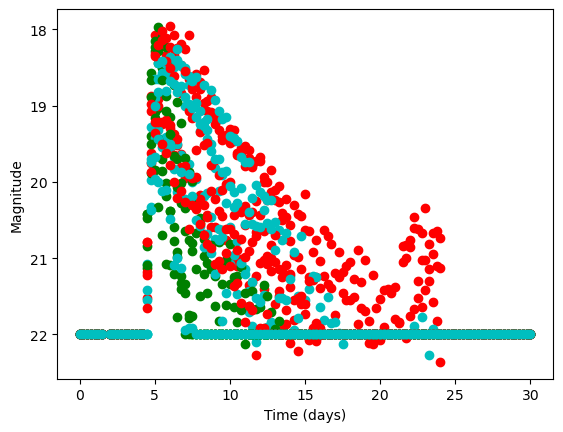

In [20]:
for i in range(0, 300, 50):
    plt.scatter(fixed_simembed_dict['fixed_simembed_data_20'][i]['t'], fixed_simembed_dict['fixed_simembed_data_20'][i]['ztfg'], color = 'g')
    plt.scatter(fixed_simembed_dict['fixed_simembed_data_20'][i]['t'], fixed_simembed_dict['fixed_simembed_data_20'][i]['ztfr'], color = 'r')
    plt.scatter(fixed_simembed_dict['fixed_simembed_data_20'][i]['t'], fixed_simembed_dict['fixed_simembed_data_20'][i]['ztfi'], color = 'c')
plt.gca().invert_yaxis()
plt.xlabel('Time (days)')
plt.ylabel('Magnitude')

In [33]:
# injection files

inj_path_simembed = '/nobackup/users/mmdesai/inj_fullprior'
fixed_injections = {}

for i in range(0, 20):
    fixed_inj_df = pd.DataFrame()
    fixed_params = open_json('/injection_simembed_fixed_{}.json'.format(i), inj_path_simembed)
    fixed_inj_df['mej'] = fixed_params['injections']['content']['log10_mej']
    fixed_inj_df['vej'] = fixed_params['injections']['content']['log10_vej']
    fixed_inj_df['xlan'] = fixed_params['injections']['content']['log10_Xlan']
    fixed_inj_df['shift'] = fixed_params['injections']['content']['timeshift']
    fixed_inj_df['distance'] = fixed_params['injections']['content']['luminosity_distance']
    fixed_inj_df['sim_id'] = fixed_params['injections']['content']['simulation_id']
    fixed_injections['fixed_inj_df{}'.format(i)] = fixed_inj_df

In [34]:
fixed_injections['fixed_inj_df0']

,mej,vej,xlan,shift,distance,sim_id
0,-2.556765,-0.603688,-2.984952,0.0,50.0,0
1,-2.556765,-0.603688,-2.984952,0.0,50.0,1
2,-2.556765,-0.603688,-2.984952,0.0,50.0,2
3,-2.556765,-0.603688,-2.984952,0.0,50.0,3
4,-2.556765,-0.603688,-2.984952,0.0,50.0,4
...,...,...,...,...,...,...
24995,-2.226290,-1.094200,-7.913337,0.0,50.0,24995
24996,-2.226290,-1.094200,-7.913337,0.0,50.0,24996
24997,-2.226290,-1.094200,-7.913337,0.0,50.0,24997
24998,-2.226290,-1.094200,-7.913337,0.0,50.0,24998


In [35]:
len(fixed_simembed_dict)

20

In [ ]:
# concatenate dataframe lists

all_fixed_data_list = [0] * 20

for i in range(0, 20):
    all_fixed_data_list[i] = pd.concat(fixed_simembed_dict['fixed_simembed_data_{}'.format(i)])

In [ ]:
all_fixed_data_list[0]

In [ ]:
# merge with injection parameters

all_fixed_datawparams_list = [0] * 20

for i in range(0, 20):
    all_fixed_datawparams_list[i] = all_fixed_data_list[i].merge(fixed_injections['fixed_inj_df{}'.format(i)], on = 'sim_id')
    # save as csv file
    all_fixed_datawparams_list[i].to_csv('/nobackup/users/mmdesai/fullprior_csv/fixed_{}.csv'.format(i), index = False)

In [ ]:
all_fixed_datawparams_list[0]

# Load in Data

In [97]:
data_dir = '/nobackup/users/mmdesai/new_csv/'

In [98]:
matched_df = matched(data_dir, 'varied', 'fixed', 0, 30) 

In [99]:
matched_df

,t_x,key_1,ztfg_x,ztfr_x,ztfi_x,sim_id,num_detections_x,mej_x,vej_x,xlan_x,...,t_y,ztfg_y,ztfr_y,ztfi_y,num_detections_y,mej_y,vej_y,xlan_y,shift_y,distance_y
0,0.00,0,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,0.00,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0
1,0.25,1,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,0.25,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0
2,0.50,2,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,0.50,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0
3,0.75,3,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,0.75,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0
4,1.00,4,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,1.00,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3024995,29.00,116,22.0,22.0,22.0,24999,40,-2.278680,-1.190365,-7.016438,...,29.00,22.0,22.0,22.0,60,-2.278680,-1.190365,-7.016438,0.0,50.0
3024996,29.25,117,22.0,22.0,22.0,24999,40,-2.278680,-1.190365,-7.016438,...,29.25,22.0,22.0,22.0,60,-2.278680,-1.190365,-7.016438,0.0,50.0
3024997,29.50,118,22.0,22.0,22.0,24999,40,-2.278680,-1.190365,-7.016438,...,29.50,22.0,22.0,22.0,60,-2.278680,-1.190365,-7.016438,0.0,50.0
3024998,29.75,119,22.0,22.0,22.0,24999,40,-2.278680,-1.190365,-7.016438,...,29.75,22.0,22.0,22.0,60,-2.278680,-1.190365,-7.016438,0.0,50.0


In [100]:
add_batch_sim_nums_all(matched_df)
matched_df

,t_x,key_1,ztfg_x,ztfr_x,ztfi_x,sim_id,num_detections_x,mej_x,vej_x,xlan_x,...,ztfg_y,ztfr_y,ztfi_y,num_detections_y,mej_y,vej_y,xlan_y,shift_y,distance_y,batch_id
0,0.00,0,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0
1,0.25,1,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0
2,0.50,2,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0
3,0.75,3,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0
4,1.00,4,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3024995,29.00,116,22.0,22.0,22.0,698299,40,-2.278680,-1.190365,-7.016438,...,22.0,22.0,22.0,60,-2.278680,-1.190365,-7.016438,0.0,50.0,13965
3024996,29.25,117,22.0,22.0,22.0,698299,40,-2.278680,-1.190365,-7.016438,...,22.0,22.0,22.0,60,-2.278680,-1.190365,-7.016438,0.0,50.0,13965
3024997,29.50,118,22.0,22.0,22.0,698299,40,-2.278680,-1.190365,-7.016438,...,22.0,22.0,22.0,60,-2.278680,-1.190365,-7.016438,0.0,50.0,13965
3024998,29.75,119,22.0,22.0,22.0,698299,40,-2.278680,-1.190365,-7.016438,...,22.0,22.0,22.0,60,-2.278680,-1.190365,-7.016438,0.0,50.0,13965


In [101]:
true_list = []
for i in range(int(len(matched_df)/121/50)):
    batch_df = matched_df.loc[matched_df['batch_id'] == i]
    if batch_df['num_detections_x'].min() >= 8:
        true_list.append(batch_df)
    else:
        pass

In [102]:
len(true_list)

6476

In [103]:
detected_df = pd.concat(true_list)
detected_df

,t_x,key_1,ztfg_x,ztfr_x,ztfi_x,sim_id,num_detections_x,mej_x,vej_x,xlan_x,...,ztfg_y,ztfr_y,ztfi_y,num_detections_y,mej_y,vej_y,xlan_y,shift_y,distance_y,batch_id
0,0.00,0,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0
1,0.25,1,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0
2,0.50,2,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0
3,0.75,3,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0
4,1.00,4,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,...,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3006845,29.00,116,22.0,22.0,22.0,698149,61,-1.507662,-1.047413,-5.893438,...,22.0,22.0,22.0,166,-1.507662,-1.047413,-5.893438,0.0,50.0,13962
3006846,29.25,117,22.0,22.0,22.0,698149,61,-1.507662,-1.047413,-5.893438,...,22.0,22.0,22.0,166,-1.507662,-1.047413,-5.893438,0.0,50.0,13962
3006847,29.50,118,22.0,22.0,22.0,698149,61,-1.507662,-1.047413,-5.893438,...,22.0,22.0,22.0,166,-1.507662,-1.047413,-5.893438,0.0,50.0,13962
3006848,29.75,119,22.0,22.0,22.0,698149,61,-1.507662,-1.047413,-5.893438,...,22.0,22.0,22.0,166,-1.507662,-1.047413,-5.893438,0.0,50.0,13962


In [104]:
# varied

var_df = detected_df.iloc[:, :12]
var_df.columns = var_df.columns.str.rstrip('_x')
var_df = var_df.drop(columns=['key_1'])
add_batch_sim_nums_all(var_df)
var_df

,t,ztfg,ztfr,ztfi,sim_id,num_detections,mej,vej,xlan,shift,distance,batch_id
0,0.00,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,2.275894,55.782702,0
1,0.25,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,2.275894,55.782702,0
2,0.50,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,2.275894,55.782702,0
3,0.75,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,2.275894,55.782702,0
4,1.00,22.0,22.0,22.0,0,112,-1.861772,-1.033364,-7.974005,2.275894,55.782702,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3006845,29.00,22.0,22.0,22.0,323799,61,-1.507662,-1.047413,-5.893438,4.105607,164.675232,6475
3006846,29.25,22.0,22.0,22.0,323799,61,-1.507662,-1.047413,-5.893438,4.105607,164.675232,6475
3006847,29.50,22.0,22.0,22.0,323799,61,-1.507662,-1.047413,-5.893438,4.105607,164.675232,6475
3006848,29.75,22.0,22.0,22.0,323799,61,-1.507662,-1.047413,-5.893438,4.105607,164.675232,6475


In [105]:
# fixed
fix_df = detected_df.iloc[:, 12:]
fix_df.columns = fix_df.columns.str.rstrip('_y')
add_batch_sim_nums_all(fix_df)
fix_df

,t,ztfg,ztfr,ztfi,num_detections,mej,vej,xlan,shift,distance,batch_id,sim_id
0,0.00,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0,0
1,0.25,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0,0
2,0.50,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0,0
3,0.75,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0,0
4,1.00,22.0,22.0,22.0,122,-1.861772,-1.033364,-7.974005,0.0,50.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3006845,29.00,22.0,22.0,22.0,166,-1.507662,-1.047413,-5.893438,0.0,50.0,6475,323799
3006846,29.25,22.0,22.0,22.0,166,-1.507662,-1.047413,-5.893438,0.0,50.0,6475,323799
3006847,29.50,22.0,22.0,22.0,166,-1.507662,-1.047413,-5.893438,0.0,50.0,6475,323799
3006848,29.75,22.0,22.0,22.0,166,-1.507662,-1.047413,-5.893438,0.0,50.0,6475,323799


In [109]:
var_df['xlan'].min()

-8.999988068718405

(array([3932137., 3896563., 3886641., 3905517., 3916528., 3931169.,
        3928265., 3943874., 3927418., 3911688.]),
 array([ 50.00123571,  65.00109679,  80.00095786,  95.00081893,
        110.00068   , 125.00054107, 140.00040214, 155.00026321,
        170.00012428, 184.99998535, 199.99984642]),
 <BarContainer object of 10 artists>)

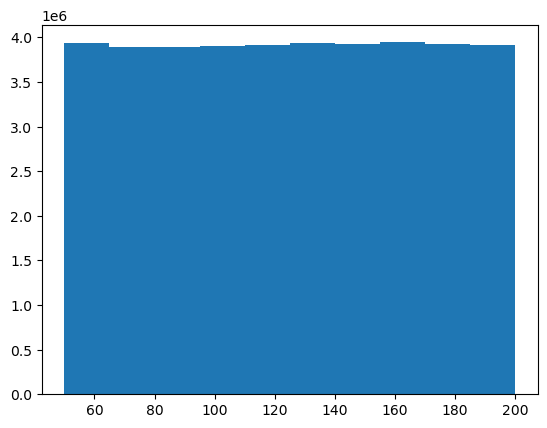

In [29]:
plt.hist(var_df['distance'])

(array([3911688., 3924998., 3914229., 3950408., 3883979., 3890392.,
        3937461., 3961056., 3908421., 3897168.]),
 array([-1.99996052, -1.19996664, -0.39997277,  0.40002111,  1.20001498,
         2.00000886,  2.80000273,  3.59999661,  4.39999048,  5.19998436,
         5.99997823]),
 <BarContainer object of 10 artists>)

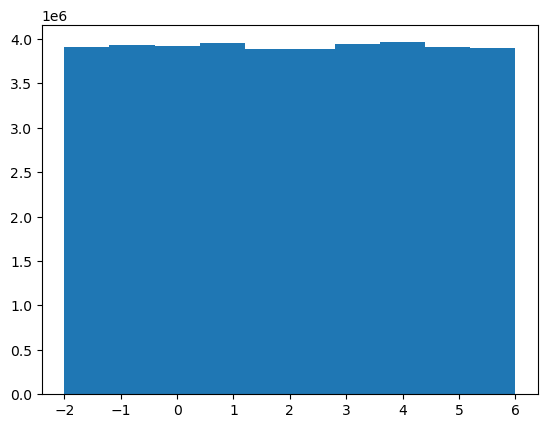

In [32]:
plt.hist(var_df['shift'])

(array([3920400., 3811500., 4071650., 4089800., 3853850., 3757050.,
        3859900., 3878050., 3841750., 4095850.]),
 array([-8.99998807, -8.60006567, -8.20014327, -7.80022087, -7.40029848,
        -7.00037608, -6.60045368, -6.20053128, -5.80060888, -5.40068649,
        -5.00076409]),
 <BarContainer object of 10 artists>)

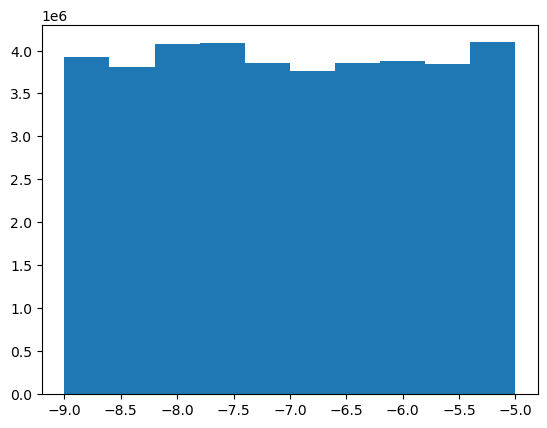

In [33]:
plt.hist(var_df['xlan'])

(array([ 417450., 2940300., 4525400., 4114000., 4434650., 4585900.,
        4604050., 4489100., 4513300., 4555650.]),
 array([-2.03192107, -1.97873514, -1.92554921, -1.87236328, -1.81917735,
        -1.76599142, -1.71280549, -1.65961956, -1.60643363, -1.5532477 ,
        -1.50006177]),
 <BarContainer object of 10 artists>)

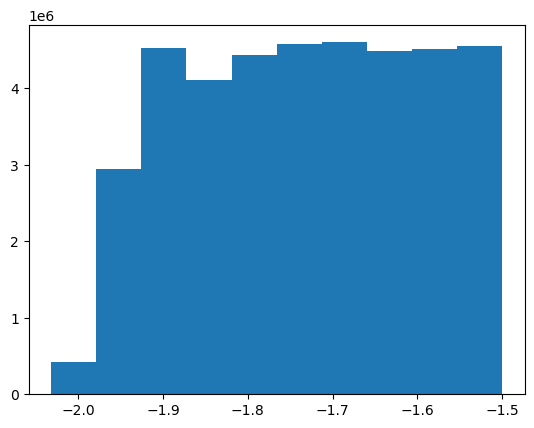

In [34]:
plt.hist(var_df['mej'])

(array([3859900., 3654200., 3757050., 3442450., 3690500., 4331800.,
        4083750., 4156350., 4198700., 4005100.]),
 array([-1.27994411, -1.25495003, -1.22995594, -1.20496185, -1.17996776,
        -1.15497367, -1.12997958, -1.10498549, -1.0799914 , -1.05499731,
        -1.03000322]),
 <BarContainer object of 10 artists>)

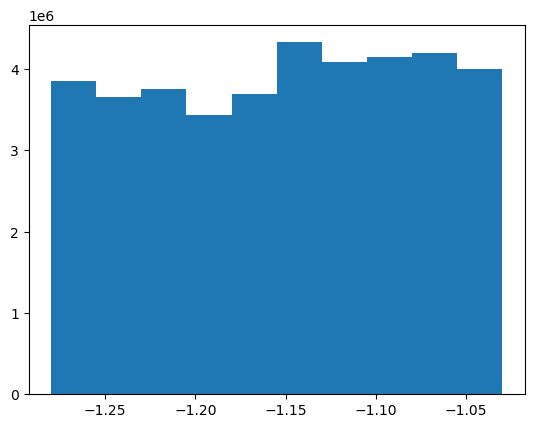

In [35]:
plt.hist(var_df['vej'])

(array([       0.,        0.,        0.,        0.,        0., 39179800.,
               0.,        0.,        0.,        0.]),
 array([49.5, 49.6, 49.7, 49.8, 49.9, 50. , 50.1, 50.2, 50.3, 50.4, 50.5]),
 <BarContainer object of 10 artists>)

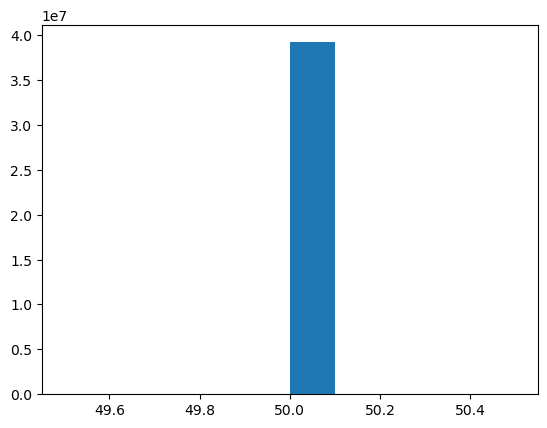

In [30]:
plt.hist(fix_df['distance'])

# Prepping for Embedding

In [28]:
# # moving the data to tensors on gpu

# num_batches_paper_sample = len(var_df['batch_id'].unique())
# data_shifted_paper, data_unshifted_paper, param_shifted_paper, param_unshifted_paper = repeated_df_to_tensor(
#     var_df, fix_df, num_batches_paper_sample)

100%|██████████| 6476/6476 [16:09<00:00,  6.68it/s]


In [29]:
# torch.save(data_shifted_paper, '/nobackup/users/mmdesai/detect8_tensors/data_shifted_paper.pt')
# torch.save(data_unshifted_paper, '/nobackup/users/mmdesai/detect8_tensors/data_unshifted_paper.pt')
# torch.save(param_shifted_paper, '/nobackup/users/mmdesai/detect8_tensors/param_shifted_paper.pt')
# torch.save(param_unshifted_paper, '/nobackup/users/mmdesai/detect8_tensors/param_unshifted_paper.pt')

In [ ]:
# torch.save(data_shifted_paper, '/nobackup/users/mmdesai/evenmore_tensors/data_shifted_paper.pt')
# torch.save(data_unshifted_paper, '/nobackup/users/mmdesai/evenmore_tensors/data_unshifted_paper.pt')
# torch.save(param_shifted_paper, '/nobackup/users/mmdesai/evenmore_tensors/param_shifted_paper.pt')
# torch.save(param_unshifted_paper, '/nobackup/users/mmdesai/evenmore_tensors/param_unshifted_paper.pt')

In [19]:
# data_shifted_paper = torch.load('/nobackup/users/mmdesai/allvaried_tensors/data_shifted_paper.pt')
# data_unshifted_paper = torch.load('/nobackup/users/mmdesai/allvaried_tensors/data_unshifted_paper.pt')
# param_shifted_paper = torch.load('/nobackup/users/mmdesai/allvaried_tensors/param_shifted_paper.pt')
# param_unshifted_paper = torch.load('/nobackup/users/mmdesai/allvaried_tensors/param_unshifted_paper.pt')

In [17]:
# data_shifted_paper = torch.load('/nobackup/users/mmdesai/evenmore_tensors/data_shifted_paper.pt')
# data_unshifted_paper = torch.load('/nobackup/users/mmdesai/evenmore_tensors/data_unshifted_paper.pt')
# param_shifted_paper = torch.load('/nobackup/users/mmdesai/evenmore_tensors/param_shifted_paper.pt')
# param_unshifted_paper = torch.load('/nobackup/users/mmdesai/evenmore_tensors/param_unshifted_paper.pt')

In [30]:
data_shifted_paper = torch.load('/nobackup/users/mmdesai/detect8_tensors/data_shifted_paper.pt')
data_unshifted_paper = torch.load('/nobackup/users/mmdesai/detect8_tensors/data_unshifted_paper.pt')
param_shifted_paper = torch.load('/nobackup/users/mmdesai/detect8_tensors/param_shifted_paper.pt')
param_unshifted_paper = torch.load('/nobackup/users/mmdesai/detect8_tensors/param_unshifted_paper.pt')

In [31]:
data_shifted_paper[0].shape

torch.Size([50, 3, 121])

In [32]:
param_shifted_paper[0].shape

torch.Size([50, 1, 5])

In [33]:
param_shifted_paper[0][0]

tensor([[-1.8618, -1.0334, -7.9740,  2.2759, 55.7827]])

In [34]:
param_unshifted_paper[0][0]

tensor([[-1.8618, -1.0334, -7.9740,  0.0000, 50.0000]])

In [35]:
num_batches_paper_sample = len(data_shifted_paper)
print(num_batches_paper_sample)

6476


# Similarity Embedding Dataset

In [36]:
# define the dataset

dataset_paper = Paper_data(data_shifted_paper, data_unshifted_paper, param_shifted_paper, param_unshifted_paper, num_batches_paper_sample)

# check the dataset shape
_, t, d, _ = dataset_paper[4]
_.shape, t.shape, d.shape

(torch.Size([50, 3, 121]), torch.Size([50, 1, 5]), torch.Size([50, 3, 121]))

In [37]:
# split dataset into training, testing, and validation

num_batches_paper_sample = len(data_shifted_paper)

train_set_size_paper = int(0.8 * num_batches_paper_sample)    
val_set_size_paper = int(0.1 * num_batches_paper_sample)     
test_set_size_paper = num_batches_paper_sample - train_set_size_paper - val_set_size_paper

train_data_paper, val_data_paper, test_data_paper = torch.utils.data.random_split(
    dataset_paper, [train_set_size_paper, val_set_size_paper, test_set_size_paper])

In [38]:
# load and shuffle the data

train_data_loader_paper = DataLoader(train_data_paper, batch_size=25, shuffle=True)
val_data_loader_paper = DataLoader(val_data_paper, batch_size=25, shuffle=True)
test_data_loader_paper = DataLoader(test_data_paper, batch_size=1, shuffle=False)

# check lengths
len(train_data_loader_paper), len(test_data_loader_paper), len(val_data_loader_paper)

(208, 649, 26)

In [39]:
# check first instance of data

for var_inj, fix_inj, var_data, fix_data in train_data_loader_paper:
    break
var_inj.shape, var_data.shape, fix_inj.shape, fix_data.shape

(torch.Size([25, 50, 1, 5]),
 torch.Size([25, 50, 3, 121]),
 torch.Size([25, 50, 1, 5]),
 torch.Size([25, 50, 3, 121]))

In [40]:
var_inj = var_inj.reshape((-1,)+var_inj.shape[2:])
fix_inj = fix_inj.reshape((-1,)+fix_inj.shape[2:])
var_data = var_data.reshape((-1,)+var_data.shape[2:])
fix_data = fix_data.reshape((-1,)+fix_data.shape[2:])
var_inj.shape, var_data.shape,

(torch.Size([1250, 1, 5]), torch.Size([1250, 3, 121]))

In [41]:
for var_inj, fix_inj, var_data, fix_data in test_data_loader_paper:
    var_inj = var_inj.squeeze(0)
    var_data = var_data.squeeze(0)
    fix_inj = fix_inj.squeeze(0)
    fix_data = fix_data.squeeze(0)
    break
var_inj.shape, var_data.shape, fix_inj.shape, fix_data.shape

(torch.Size([50, 1, 5]),
 torch.Size([50, 3, 121]),
 torch.Size([50, 1, 5]),
 torch.Size([50, 3, 121]))

In [42]:
# # plot the bilby inference of a test light curve example

# result = bilby.result.read_in_result(filename='/nobackup/users/mmdesai/test7_0_result.json')
# result.injection_parameters = dict(log10_mej=-1.33, log10_vej=-1.113)
# result.plot_corner(outdir = 'nobackup/users/mmdesai/',  truth = result.injection_parameters)

# Data Visualization

In [280]:

fixed_colors = ['seagreen', 'crimson', 'blue']
varied_colors = ['mediumaquamarine', 'salmon', 'skyblue']
label_list = ['g band', 'r band', 'i band']

def varied_fixed_plot(varied_df, fixed_df, sim_id, xlim_min=None, xlim_max=None, title = False, bands=bands):
    varied_data = varied_df.loc[varied_df['sim_id'] == sim_id]
    fixed_data = fixed_df.loc[fixed_df['sim_id'] == sim_id]
    if 'mej' in varied_data.columns:
        mej = varied_data.iloc[0, varied_data.columns.get_loc('mej')]
    if 'vej' in varied_data.columns:
        vej = varied_data.iloc[0, varied_data.columns.get_loc('vej')]
    if 'xlan' in varied_data.columns:
        xlan = varied_data.iloc[0, varied_data.columns.get_loc('xlan')]
    fig, axs = plt.subplots(3, sharex=True, sharey=True, figsize=(7,7))
    for i in range(len(bands)):
        axs[i].scatter(fixed_data['t'], fixed_data[bands[i]], label = 'fixed, ' + label_list[i] , color = fixed_colors[i], s = 10)
        axs[i].scatter(varied_data['t'], varied_data[bands[i]], label = 'shifted, ' + label_list[i], color = varied_colors[i], s = 10)
        plt.gca().invert_yaxis()
        axs[i].legend()
        if (xlim_min != None) & (xlim_max != None):
            plt.xlim(xlim_min, xlim_max)
    fig.supxlabel('Time (Days)')
    fig.supylabel('Magnitude')
    if title == True:
        if ('vej' in varied_data.columns) and ('mej' in varied_data.columns):
            fig.suptitle('Light Curve for $\log_{{10}}(M_{{ej}})$: {:.2f}, $\log_{{10}}(V_{{ej}})$: {:.2f}, \n$\log_{{10}}(X_{{lan}})$: {:.2f}'.format(mej, vej, xlan), 
                         fontsize = 15)
    else:
        pass
    if 'shift' in varied_data.columns:
        shift = varied_data.iloc[0, varied_data.columns.get_loc('shift')]
    if 'distance' in varied_data.columns:
        distance = varied_data.iloc[0, varied_data.columns.get_loc('distance')]
    print(shift, distance)
    plt.show()

5.648534383305186 86.32892653589754


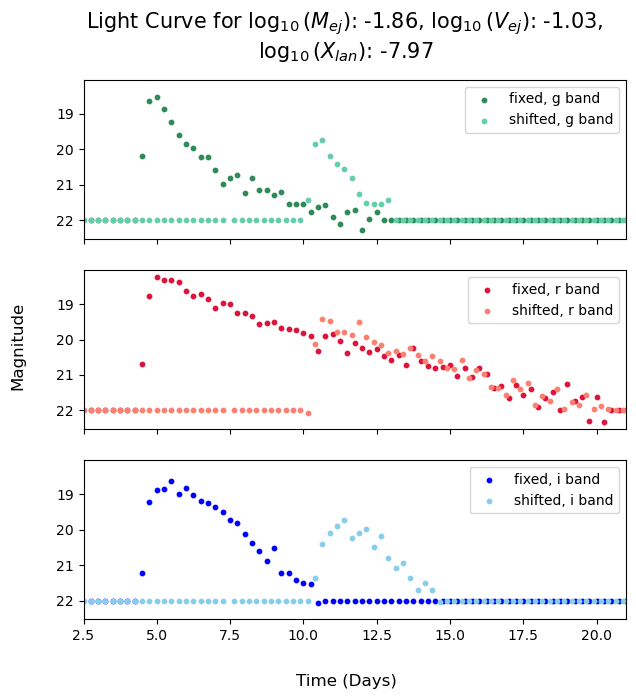

In [125]:
varied_fixed_plot(var_df, fix_df, 2, 2.5, 21, title = True)

In [165]:
# custom color list
ztf_bands = ['g', 'r', 'i']
base_colors = ['mediumseagreen', 'indianred', 'plum', 'm', 'b', 'y', 'k']

# plotting functions

def plot_light_curve(data_df, sim_id, bands, title = None, color = base_colors):
    ''' Plots a light curve in the specified bands. 
        data_df = dataframe containing the time and magnitude data for all bands
        sim_num = integer that refers to the file/simulation you want to plot 
        title(Opt) = string containing plot title
        bands(Fixed) = uses default bands, takes a list of photometric band labels
        colors(Fixed) = uses default colors, takes a list of custom colors if desired 
    '''
    onefile_data = data_df.loc[data_df['sim_id'] == sim_id]
    for i in range(len(bands)):
        plt.scatter(onefile_data['t'], onefile_data.iloc[:, i+1], label = bands[i], color = base_colors[i])
        plt.gca().invert_yaxis()
        plt.xlabel('Time')
        plt.ylabel('Magnitude')
        plt.legend()

    if title:
        plt.title(title)

    plt.show()

In [166]:
def subplotting_lightcurve(data_df, sim_id, bands):
    onefile_data = data_df.loc[data_df['sim_id'] == sim_id]
    if 'mej' in onefile_data.columns:
        mej = onefile_data.iloc[0, onefile_data.columns.get_loc('mej')]
    if 'vej' in onefile_data.columns:
        vej = onefile_data.iloc[0, onefile_data.columns.get_loc('vej')]
    fig, axs = plt.subplots(3, sharex=True, sharey=True, figsize=(8,7))
    for i in range(len(bands)):
        axs[i].scatter(onefile_data['t'], onefile_data.iloc[:, i+1], label = bands[i], color = base_colors[i], s = 10)
        plt.gca().invert_yaxis()
        axs[i].set_ylim([22.5, 16])
        axs[i].legend()
    fig.supxlabel('Time')
    fig.supylabel('Magnitude')
    if ('vej' in onefile_data.columns) and ('mej' in onefile_data.columns):
        if 'shift' in onefile_data.columns:
            shift = onefile_data.iloc[0, onefile_data.columns.get_loc('shift')]
            if shift == 0:
                curve = 'Fixed'
            else:
                curve = 'Varied'
        fig.suptitle('{} Light Curve for $M_{{ej}}$: {:.4f} and $V_{{ej}}$: {:.4f}'.format(curve, mej, vej), fontsize = 20)
    plt.show()
    
def plot_param(df, color):
    ''''''
    sim_id = pd.unique(df['sim_id'])
    for i in range(len(sim_id)):
        onefile_data = df.loc[df['sim_id'] == sim_id[i]]
        plt.scatter(onefile_data.iloc[:, 0], onefile_data.iloc[:, 3], alpha = 0.25, color = color)
    plt.gca().invert_yaxis()
    plt.xlabel('Time')
    plt.ylabel('Magnitude')

def plot_param_all(df_list, color, labels):
    ''''''
    for j in range(len(df_list)):
        sim_id = pd.unique(df_list[j]['sim_id'])
        for i in range(0, len(sim_id), 50):
            onefile_data = df_list[j].loc[df_list[j]['sim_id'] == sim_id[i]]
            plt.scatter(onefile_data.iloc[:, 0], onefile_data.iloc[:, 3], alpha = 0.1, color = color[j])
    # custom_lines = [Line2D([0], [0], color=color[0], lw=4),
    #                 Line2D([0], [0], color=color[1], lw=4),
    #                 Line2D([0], [0], color=color[2], lw=4),
    #                 Line2D([0], [0], color=color[3], lw=4)]
    # plt.legend(custom_lines, labels)
    plt.gca().invert_yaxis()
    plt.xlabel('Time')
    plt.ylabel('Magnitude')


In [167]:
varied_df['g_r'] = varied_df['ztfg'] - varied_df['ztfr']
varied_df['g_i'] = varied_df['ztfg'] - varied_df['ztfi']
varied_df['r_i'] = varied_df['ztfr'] - varied_df['ztfi']
varied_df

NameError: name 'varied_df' is not defined

In [168]:
fixed_df['g_r'] = fixed_df['ztfg'] - fixed_df['ztfr']
fixed_df['g_i'] = fixed_df['ztfg'] - fixed_df['ztfi']
fixed_df['r_i'] = fixed_df['ztfr'] - fixed_df['ztfi']
fixed_df

NameError: name 'fixed_df' is not defined

In [40]:
colors = ['g_r', 'g_i', 'r_i']
plotcolors = ['mediumseagreen', 'indianred', 'plum']

def plot_param(df, colors=colors, plotcolors=plotcolors, xlim_min=None, xlim_max=None):
    ''''''
    batch_id = pd.unique(df['batch_id'])
    fig, axs = plt.subplots(3, sharex=True, sharey=True, figsize=(7,7))
    for i in range(len(batch_id)):
        onebatch_data = df.loc[df['batch_id'] == batch_id[i]]
        sim_id = pd.unique(onebatch_data['sim_id'])
        onefile_data = onebatch_data.loc[onebatch_data['sim_id'] == sim_id[0]]
        for j in range(len(colors)):
            axs[j].scatter(onefile_data['t'], onefile_data[colors[j]], color = plotcolors[j],  alpha = 0.25, s = 10)
            if (xlim_min != None) & (xlim_max != None):
                plt.xlim(xlim_min, xlim_max)
    fig.supxlabel('Time (Days)')
    fig.supylabel('Magnitude')

In [41]:
xlan1_fixed = fixed_df.loc[(fixed_df['xlan'] >= -9) & (fixed_df['xlan'] < -8)]
xlan2_fixed = fixed_df.loc[(fixed_df['xlan'] >= -8) & (fixed_df['xlan'] < -7)]
xlan3_fixed = fixed_df.loc[(fixed_df['xlan'] >= -7) & (fixed_df['xlan'] < -6)]
xlan4_fixed = fixed_df.loc[(fixed_df['xlan'] >= -6) & (fixed_df['xlan'] < -5)]

In [42]:
def add_batch_sim_nums(df, num_points=num_points, num_repeats=num_repeats):
    
    num_batches_split = len(df['batch_id'].unique())
    batch_list_split = []
    batch_no = 0
    for i in range(0, num_batches_split):
        for j in range(0, num_repeats*num_points):
            batch_list_split.append(batch_no)
        batch_no += 1
    df['batch_id'] = batch_list_split

    num_sims_split = int(len(df)/num_points)
    sim_list_split = []
    sim_no = 0
    for i in range(0, num_sims_split):
        for j in range(0, num_points):
            sim_list_split.append(sim_no)
        sim_no += 1
    df['sim_id'] = sim_list_split

In [43]:
xlan_list = [xlan1_fixed, xlan2_fixed, xlan3_fixed, xlan4_fixed]
for df in xlan_list:
    add_batch_sim_nums(df)

/tmp/ipykernel_2475035/962217427.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['batch_id'] = batch_list_split
/tmp/ipykernel_2475035/962217427.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['sim_id'] = sim_list_split


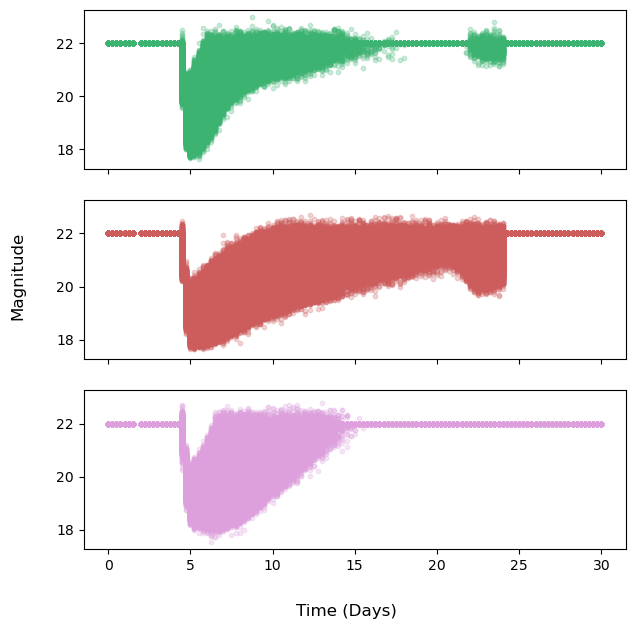

In [44]:
plot_param(xlan1_fixed, bands)

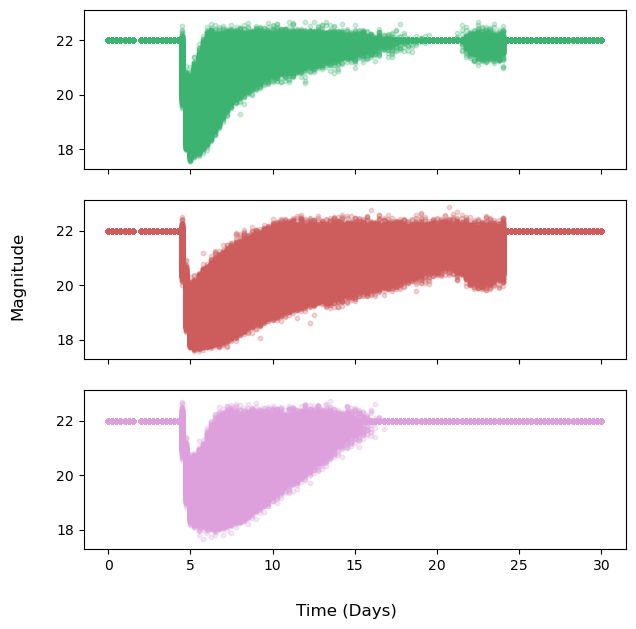

In [52]:
plot_param(xlan2_fixed, bands)

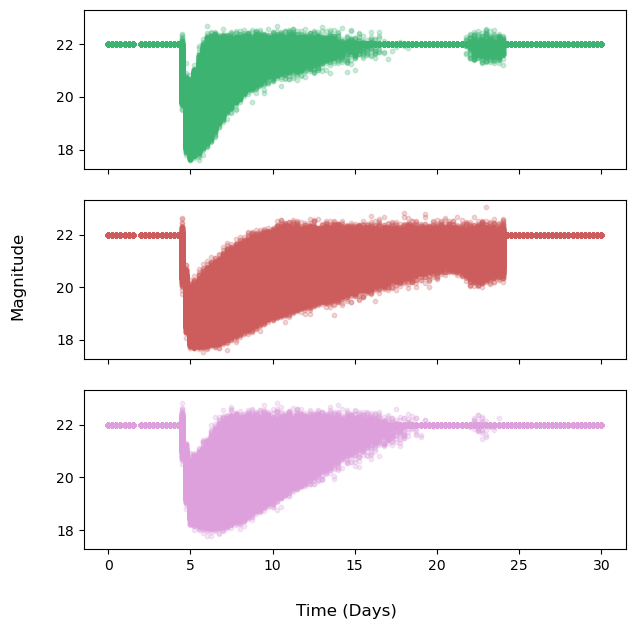

In [53]:
plot_param(xlan3_fixed, bands)

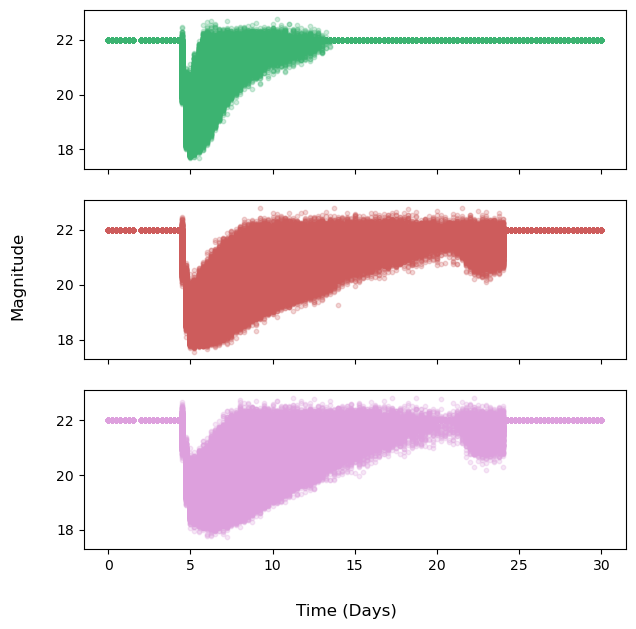

In [54]:
plot_param(xlan4_fixed, bands)

In [55]:
mej1_fixed = fixed_df.loc[(fixed_df['mej'] >= -2.5) & (fixed_df['mej'] < -2.25)]
mej2_fixed = fixed_df.loc[(fixed_df['mej'] >= -2.25) & (fixed_df['mej'] < -2.0)]
mej3_fixed = fixed_df.loc[(fixed_df['mej'] >= -2.0) & (fixed_df['mej'] < -1.75)]
mej4_fixed = fixed_df.loc[(fixed_df['mej'] >= -1.75) & (fixed_df['mej'] < -1.5)]

In [56]:
mej_list = [mej1_fixed, mej2_fixed, mej3_fixed, mej4_fixed]
for df in mej_list:
    add_batch_sim_nums(df)

/tmp/ipykernel_2475035/962217427.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['batch_id'] = batch_list_split
/tmp/ipykernel_2475035/962217427.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['sim_id'] = sim_list_split


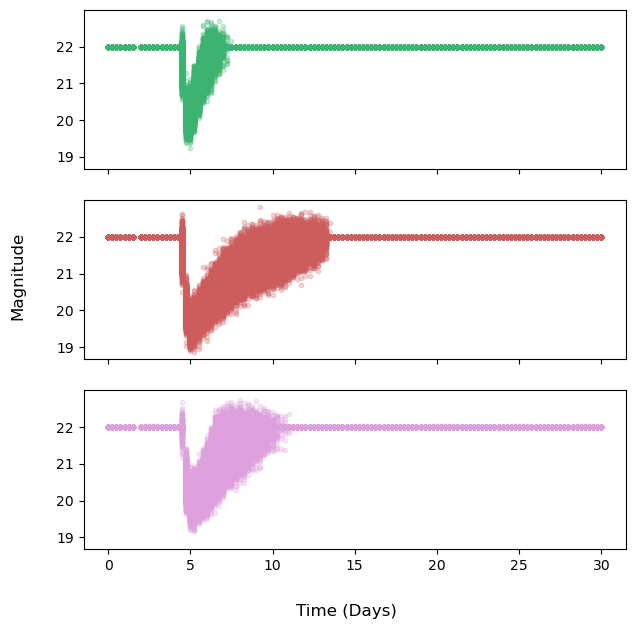

In [57]:
plot_param(mej1_fixed, bands)

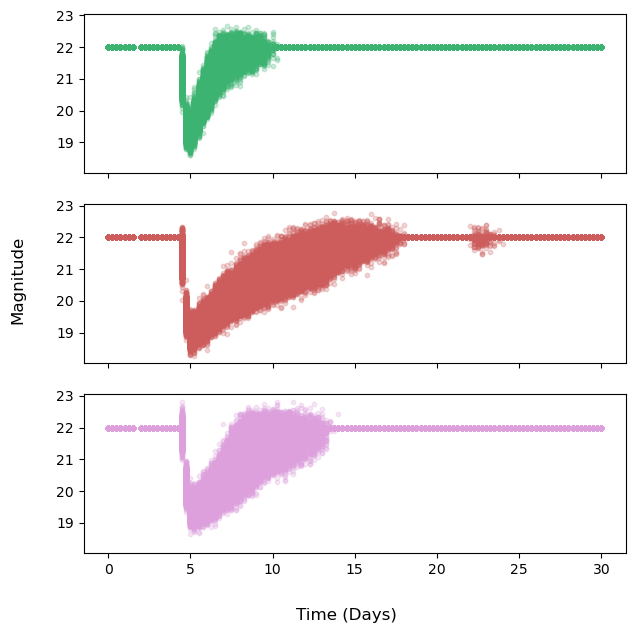

In [58]:
plot_param(mej2_fixed, bands)

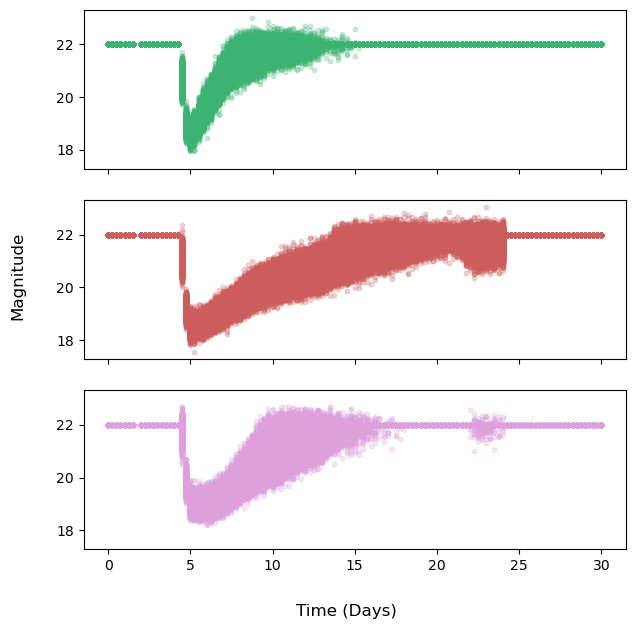

In [59]:
plot_param(mej3_fixed, bands)

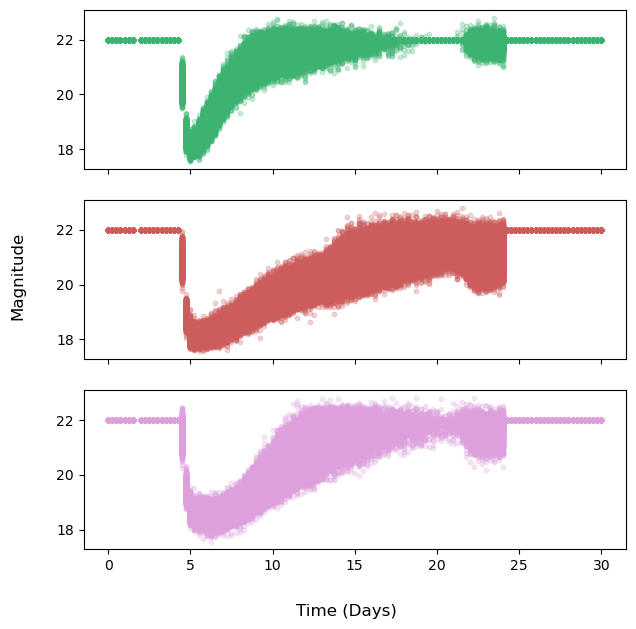

In [60]:
plot_param(mej4_fixed, bands)

In [61]:
vej1_fixed = fixed_df.loc[(fixed_df['vej'] >= -1.28) & (fixed_df['vej'] < -1.2175)]
vej2_fixed = fixed_df.loc[(fixed_df['vej'] >= -1.2175) & (fixed_df['vej'] < -1.1550)]
vej3_fixed = fixed_df.loc[(fixed_df['vej'] >= -1.1550) & (fixed_df['vej'] < -1.0925)]
vej4_fixed = fixed_df.loc[(fixed_df['vej'] >= -1.0925) & (fixed_df['vej'] < -1.03)]

In [62]:
vej_list = [vej1_fixed, vej2_fixed, vej3_fixed, vej4_fixed]
for df in vej_list:
    add_batch_sim_nums(df)

/tmp/ipykernel_2475035/962217427.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['batch_id'] = batch_list_split
/tmp/ipykernel_2475035/962217427.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['sim_id'] = sim_list_split


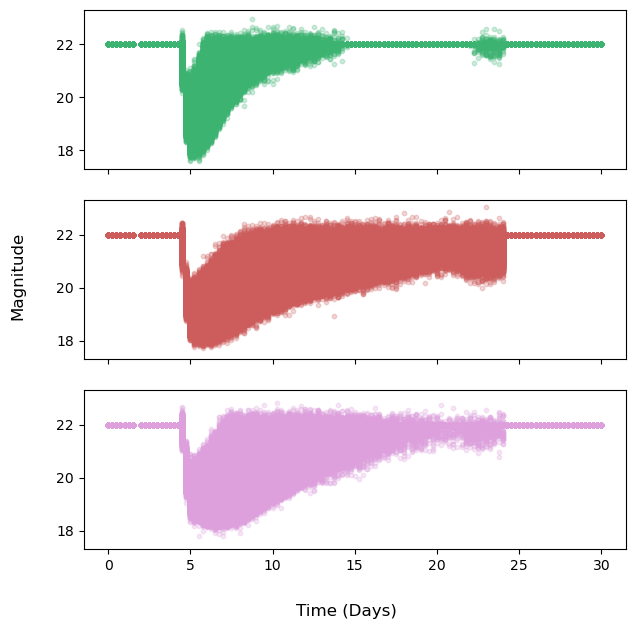

In [63]:
plot_param(vej1_fixed, bands)

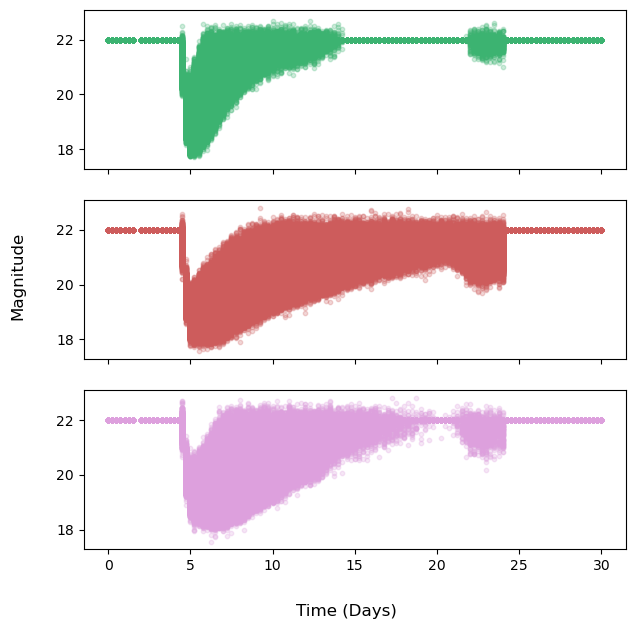

In [64]:
plot_param(vej2_fixed, bands)

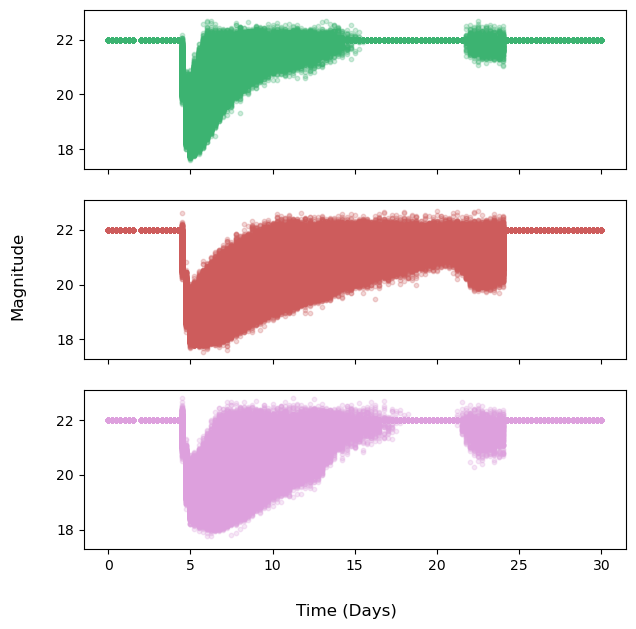

In [65]:
plot_param(vej3_fixed, bands)

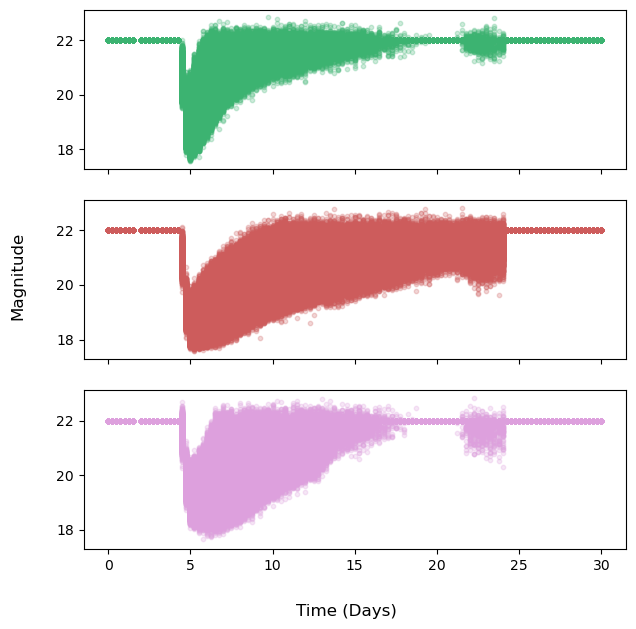

In [66]:
plot_param(vej4_fixed, bands)

# Similarity Embedding

In [43]:
# puts the neural network on the gpu
# Best trial config: {'num_dim': 5, 'num_hidden_layers_f': 2, 'num_hidden_layers_h': 2, 'num_blocks': 5, 'kernel_size': 13, 'num_dim_final': 10, 'lr': 0.0009927115803251528, 'batch_size': 200}
# num_dim': 3, 'num_hidden_layers_f': 2, 'num_hidden_layers_h': 2, 'num_blocks': 5, 'kernel_size': 13, 'num_dim_final': 10, 'lr': 3.1608167053973085e-05, 'batch_size': 200

# {'num_dim': 5, 'num_hidden_layers_f': 2, 'num_hidden_layers_h': 2, 'num_blocks': 6, 'kernel_size': 13, 'num_dim_final': 15, 'lr': 0.0004859266924872132, 'batch_size': 200}

# {'num_dim': 7, 'num_hidden_layers_f': 1, 'num_hidden_layers_h': 2, 'num_blocks': 4, 'kernel_size': 5, 'num_dim_final': 2, 'lr': 3.880899364568132e-06, 'batch_size': 25}

similarity_embedding = SimilarityEmbedding(num_dim=7, num_hidden_layers_f=1, num_hidden_layers_h=2, num_blocks=4, kernel_size=5, num_dim_final=2).to(device)
num_dim = 7

# optimizes
optimizer = optim.Adam(similarity_embedding.parameters(), lr=3.880899364568132e-06)

# sets learning rate steps
scheduler_1 = optim.lr_scheduler.ConstantLR(optimizer, total_iters=5) #constant lr
scheduler_2 = optim.lr_scheduler.OneCycleLR(optimizer, total_steps=20, max_lr=2e-3) #one cycle - increase and then decrease
scheduler_3 = optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)
scheduler = optim.lr_scheduler.SequentialLR(optimizer, schedulers=[scheduler_1, scheduler_2, scheduler_3], milestones=[5, 15])
#scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=2, factor=0.5, threshold=0.001)

In [44]:
# similarity_resnet = ResNet(num_ifos=[3,None], layers=[2,2], kernel_size=13, context_dim=100).to(device)

In [45]:
# set data for similarity embedding

for var_inj_se, fix_inj_se, var_data_se, fix_data_se in train_data_loader_paper:
    var_inj_se = var_inj_se.reshape((-1,)+var_inj_se.shape[2:])
    fix_inj_se = fix_inj_se.reshape((-1,)+fix_inj_se.shape[2:])
    var_data_se = var_data_se.reshape((-1,)+var_data_se.shape[2:])
    fix_data_se = fix_data_se.reshape((-1,)+fix_data_se.shape[2:])
    break
var_inj_se.shape, var_data_se.shape, fix_inj_se.shape, fix_data_se.shape

(torch.Size([1250, 1, 5]),
 torch.Size([1250, 3, 121]),
 torch.Size([1250, 1, 5]),
 torch.Size([1250, 3, 121]))

In [46]:
similarity_embedding(var_data_se)[0].shape

torch.Size([1250, 2])

In [47]:
# checking the shapes

embed, rep = similarity_embedding(var_data_se)
embed.shape, rep.shape

(torch.Size([1250, 2]), torch.Size([1250, 7]))

In [48]:
# embed the data and calculate the loss

emb_aug, rep_aug = similarity_embedding(var_data_se)
emb_orig, rep_orig = similarity_embedding(fix_data_se)
vicreg_loss(emb_aug, emb_orig)

(tensor(0.9899, device='cuda:0', grad_fn=<AddBackward0>),
 tensor(5.9106e-06, device='cuda:0', grad_fn=<MseLossBackward0>),
 tensor(6.3167e-07, device='cuda:0', grad_fn=<AddBackward0>),
 tensor(0.9899, device='cuda:0', grad_fn=<AddBackward0>))

In [49]:
# print neural network parameters that require gradients and sum parameters

sum_param=0
for name, param in similarity_embedding.named_parameters():
    if param.requires_grad:
        print(name)
        print(param.numel())
        sum_param+=param.numel()
print(sum_param)

layer_norm.weight
363
layer_norm.bias
363
layers_f.conv1.weight
1344
layers_f.bn1.weight
64
layers_f.bn1.bias
64
layers_f.residual_layers.0.0.conv1.weight
20480
layers_f.residual_layers.0.0.bn1.weight
64
layers_f.residual_layers.0.0.bn1.bias
64
layers_f.residual_layers.0.0.conv2.weight
20480
layers_f.residual_layers.0.0.bn2.weight
64
layers_f.residual_layers.0.0.bn2.bias
64
layers_f.residual_layers.0.1.conv1.weight
20480
layers_f.residual_layers.0.1.bn1.weight
64
layers_f.residual_layers.0.1.bn1.bias
64
layers_f.residual_layers.0.1.conv2.weight
20480
layers_f.residual_layers.0.1.bn2.weight
64
layers_f.residual_layers.0.1.bn2.bias
64
layers_f.residual_layers.1.0.conv1.weight
40960
layers_f.residual_layers.1.0.bn1.weight
128
layers_f.residual_layers.1.0.bn1.bias
128
layers_f.residual_layers.1.0.conv2.weight
81920
layers_f.residual_layers.1.0.bn2.weight
128
layers_f.residual_layers.1.0.bn2.bias
128
layers_f.residual_layers.1.0.downsample.0.weight
8192
layers_f.residual_layers.1.0.downsamp

In [50]:
# write to tensorboard

writer = SummaryWriter()
epoch_number = 0

In [51]:
%%time
# training the neural network for many epochs

epoch_number = 0
EPOCHS = 50

sim_val_loss = []
sim_train_loss = []

for epoch in range(EPOCHS):
    print('EPOCH {}:'.format(epoch_number + 1))
    if epoch < 10:
        wt_repr, wt_cov, wt_std = (1, 1, 1)
    # elif epoch < 20:
    #     wt_repr, wt_cov, wt_std = (25, 25, 1)
    else:
        wt_repr, wt_cov, wt_std = (1, 1, 1)

    print(f"VicReg wts: {wt_repr} {wt_cov} {wt_std}")
    # Gradient tracking
    similarity_embedding.train(True)
    avg_train_loss = train_one_epoch_se(epoch_number, writer, train_data_loader_paper,
                                        wt_repr=wt_repr, wt_cov=wt_cov, wt_std=wt_std)
    sim_train_loss.append(avg_train_loss)
    
    # no gradient tracking, for validation
    similarity_embedding.train(False)
    similarity_embedding.eval()
    avg_val_loss = val_one_epoch_se(epoch_number, writer, val_data_loader_paper,
                                    wt_repr=wt_repr, wt_cov=wt_cov, wt_std=wt_std)
    sim_val_loss.append(avg_val_loss)
    
    print(f"Train/Val Sim Loss after epoch: {avg_train_loss:.4f}/{avg_val_loss:.4f}")

    epoch_number += 1
    scheduler.step()


EPOCH 1:
VicReg wts: 1 1 1
 Avg. train loss/batch after 10 batches = 0.9895
Last 0.00; 0.00; 0.99
 Avg. train loss/batch after 20 batches = 0.9879
Last 0.00; 0.00; 0.99
 Avg. train loss/batch after 30 batches = 0.9854
Last 0.00; 0.00; 0.98
 Avg. train loss/batch after 40 batches = 0.9812
Last 0.00; 0.00; 0.97
 Avg. train loss/batch after 50 batches = 0.9768
Last 0.00; 0.00; 0.97
 Avg. train loss/batch after 60 batches = 0.9696
Last 0.00; 0.00; 0.96
 Avg. train loss/batch after 70 batches = 0.9611
Last 0.00; 0.00; 0.95
 Avg. train loss/batch after 80 batches = 0.9517
Last 0.01; 0.00; 0.94
 Avg. train loss/batch after 90 batches = 0.9398
Last 0.01; 0.00; 0.92
 Avg. train loss/batch after 100 batches = 0.9287
Last 0.01; 0.00; 0.91
 Avg. train loss/batch after 110 batches = 0.9157
Last 0.02; 0.00; 0.88
 Avg. train loss/batch after 120 batches = 0.9029
Last 0.02; 0.00; 0.87
 Avg. train loss/batch after 130 batches = 0.8917
Last 0.04; 0.00; 0.85
 Avg. train loss/batch after 140 batches = 0.8

/home/mmdesai/.conda/envs/my_torch/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:152: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


 Avg. train loss/batch after 10 batches = 0.3335
Last 0.24; 0.00; 0.09
 Avg. train loss/batch after 20 batches = 0.2819
Last 0.20; 0.00; 0.08
 Avg. train loss/batch after 30 batches = 0.2632
Last 0.24; 0.00; 0.02
 Avg. train loss/batch after 40 batches = 0.3462
Last 0.26; 0.01; 0.31
 Avg. train loss/batch after 50 batches = 0.3252
Last 0.30; 0.00; 0.00
 Avg. train loss/batch after 60 batches = 0.2816
Last 0.18; 0.00; 0.03
 Avg. train loss/batch after 70 batches = 0.3083
Last 0.18; 0.00; 0.12
 Avg. train loss/batch after 80 batches = 0.3083
Last 0.23; 0.00; 0.02
 Avg. train loss/batch after 90 batches = 0.2409
Last 0.22; 0.00; 0.00
 Avg. train loss/batch after 100 batches = 0.3274
Last 0.38; 0.00; 0.00
 Avg. train loss/batch after 110 batches = 0.3462
Last 0.24; 0.00; 0.12
 Avg. train loss/batch after 120 batches = 0.3502
Last 0.16; 0.00; 0.13
 Avg. train loss/batch after 130 batches = 0.2404
Last 0.30; 0.00; 0.00
 Avg. train loss/batch after 140 batches = 0.2946
Last 0.21; 0.00; 0.10
 

In [94]:
# torch.cuda.memory_summary(device=None, abbreviated=False)

In [95]:
# torch.cuda.empty_cache()

Text(0, 0.5, 'Loss')

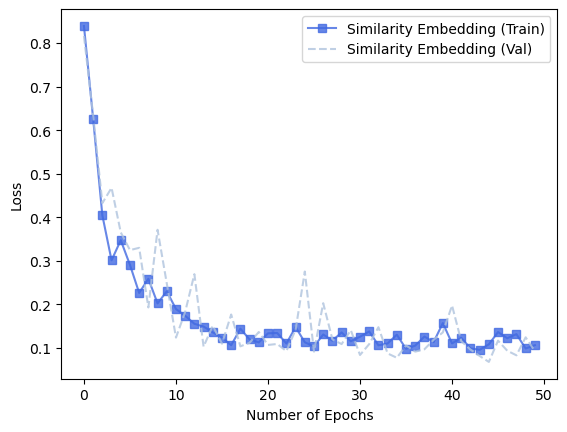

In [52]:
# plot the train/val loss 

epoch_list = range(0,len(sim_train_loss))
# plt.yscale('log')
plt.plot(epoch_list, sim_train_loss, label = 'Similarity Embedding (Train)', color = 'royalblue', alpha = 0.8, marker = 's')
plt.plot(epoch_list, sim_val_loss, label = 'Similarity Embedding (Val)', color = 'lightsteelblue', alpha=0.8, linestyle="dashed")
plt.legend()
plt.xlabel('Number of Epochs')
plt.ylabel('Loss')
#plt.ylim(0,1)

In [146]:
# # save the embedded weights

# SAVEPATH = '/nobackup/users/mmdesai/bestembeddingweights/similarity-embedding-weights.pth'
# torch.save(similarity_embedding.state_dict(), SAVEPATH)

In [52]:
# # load the embedded weights

# PATH = './Ka2017-light-curves-similarity-embedding-weights.pth'
# similarity_embedding.load_state_dict(torch.load(PATH, map_location=device))
# similarity_embedding.eval()

In [29]:
# 'num_dim': 7, 'num_hidden_layers_f': 1, 'num_hidden_layers_h': 1, 'num_blocks': 4, 'kernel_size': 11, 'num_dim_final': 2, 
# 'lr': 1.0470623545379458e-05, 'batch_size': 25, 'wt_repr': 1, 'wt_cov': 1, 'wt_std': 1}

similarity_embedding = SimilarityEmbedding(num_dim=7, num_hidden_layers_f=1, num_hidden_layers_h=2, num_blocks=4, kernel_size=5, num_dim_final=2).to(device)
num_dim = 7

In [30]:
# load the hyperparameter tuned model weights

SAVEPATH = '/nobackup/users/mmdesai/bestembeddingweights/similarity-embedding-weights.pth'
similarity_embedding.load_state_dict(torch.load(SAVEPATH, map_location=device))
similarity_embedding.eval()

SimilarityEmbedding(
  (layer_norm): LayerNorm((3, 121), eps=1e-05, elementwise_affine=True)
  (layers_f): ResNet(
    (conv1): Conv1d(3, 64, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (bn1): GroupNorm()
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (residual_layers): ModuleList(
      (0): Sequential(
        (0): BasicBlock(
          (conv1): Conv1d(64, 64, kernel_size=(11,), stride=(1,), padding=(5,), bias=False)
          (bn1): GroupNorm()
          (relu): ReLU(inplace=True)
          (conv2): Conv1d(64, 64, kernel_size=(11,), stride=(1,), padding=(5,), bias=False)
          (bn2): GroupNorm()
        )
        (1): BasicBlock(
          (conv1): Conv1d(64, 64, kernel_size=(11,), stride=(1,), padding=(5,), bias=False)
          (bn1): GroupNorm()
          (relu): ReLU(inplace=True)
          (conv2): Conv1d(64, 64, kernel_size=(11,), stride=(1,), padding=(5,), bias=False)
          

# Varying $M_{ej}$

In [53]:
similarity_embedding.train(False)
data_loader = test_data_loader_paper

similarity_outputs_1 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][0] < -1.5) and (shift_test[0][0][0] > -1.75)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_1.append(similarity_output)

In [54]:
similarity_outputs_2 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][0] < -1.75) and (shift_test[0][0][0] > -2)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_2.append(similarity_output)

In [55]:
similarity_outputs_3 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][0] < -2) and (shift_test[0][0][0] > -2.25)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_3.append(similarity_output)

In [56]:
similarity_outputs_4 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][0] < -2.25) and (shift_test[0][0][0] > -2.5)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_4.append(similarity_output)


In [57]:
similarity_outputs_1 = torch.stack(similarity_outputs_1)
similarity_outputs_2 = torch.stack(similarity_outputs_2)
similarity_outputs_3 = torch.stack(similarity_outputs_3)
similarity_outputs_4 = torch.stack(similarity_outputs_4)

RuntimeError: stack expects a non-empty TensorList

In [58]:
similarity_outputs_1.shape, similarity_outputs_2.shape, similarity_outputs_3.shape

(torch.Size([360, 50, 7]), torch.Size([288, 50, 7]), torch.Size([1, 50, 7]))

In [115]:
#similarity_outputs_3 = torch.stack(similarity_outputs_3)
#similarity_outputs_4 = torch.stack(similarity_outputs_4)

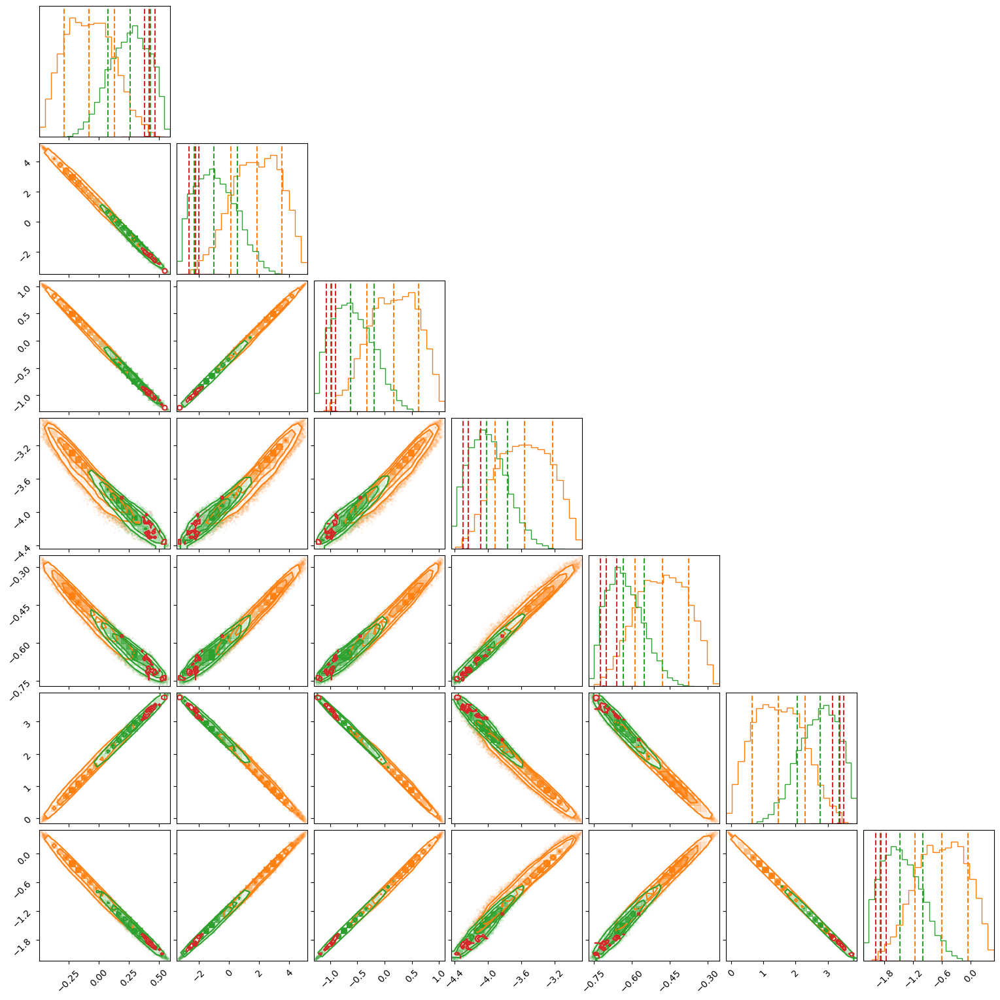

In [59]:
figure = corner.corner(
    similarity_outputs_1.cpu().numpy().reshape((similarity_outputs_1.shape[0]*similarity_outputs_1.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], color="C1"#, range = [[-1.2,-0.8], [-1.2,-0.8], [-1.2,-0.8]]
)

figure = corner.corner(
    similarity_outputs_2.cpu().numpy().reshape((similarity_outputs_2.shape[0]*similarity_outputs_2.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="C2"#, range = [[-1.2,-0.8], [-1.2,-0.8], [-1.2,-0.8]]
)

figure = corner.corner(
    similarity_outputs_3.cpu().numpy().reshape((similarity_outputs_3.shape[0]*similarity_outputs_3.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="C3"
)

# figure = corner.corner(
#     similarity_outputs_4.cpu().numpy().reshape((similarity_outputs_4.shape[0]*similarity_outputs_4.shape[1], num_dim)),
#     quantiles=[0.16, 0.5, 0.84], fig=figure, color="C4"
# )


# Varying $V_{ej}$

In [60]:
similarity_embedding.train(False)
data_loader = test_data_loader_paper

similarity_outputs_1 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][1] < -1.03) and (shift_test[0][0][1] > -1.0925)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_1.append(similarity_output)

similarity_outputs_2 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][1] < -1.0925) and (shift_test[0][0][1] > -1.1550)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_2.append(similarity_output)

similarity_outputs_3 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][1] < -1.1550) and (shift_test[0][0][1] > -1.2175)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_3.append(similarity_output)

similarity_outputs_4 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][1] < -1.2175) and (shift_test[0][0][1] > -1.28)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_4.append(similarity_output)


In [61]:
similarity_outputs_1 = torch.stack(similarity_outputs_1)
similarity_outputs_2 = torch.stack(similarity_outputs_2)
similarity_outputs_3 = torch.stack(similarity_outputs_3)
similarity_outputs_4 = torch.stack(similarity_outputs_4)

In [62]:
similarity_outputs_1.shape, similarity_outputs_2.shape, similarity_outputs_3.shape, similarity_outputs_4.shape

(torch.Size([166, 50, 7]),
 torch.Size([172, 50, 7]),
 torch.Size([165, 50, 7]),
 torch.Size([146, 50, 7]))

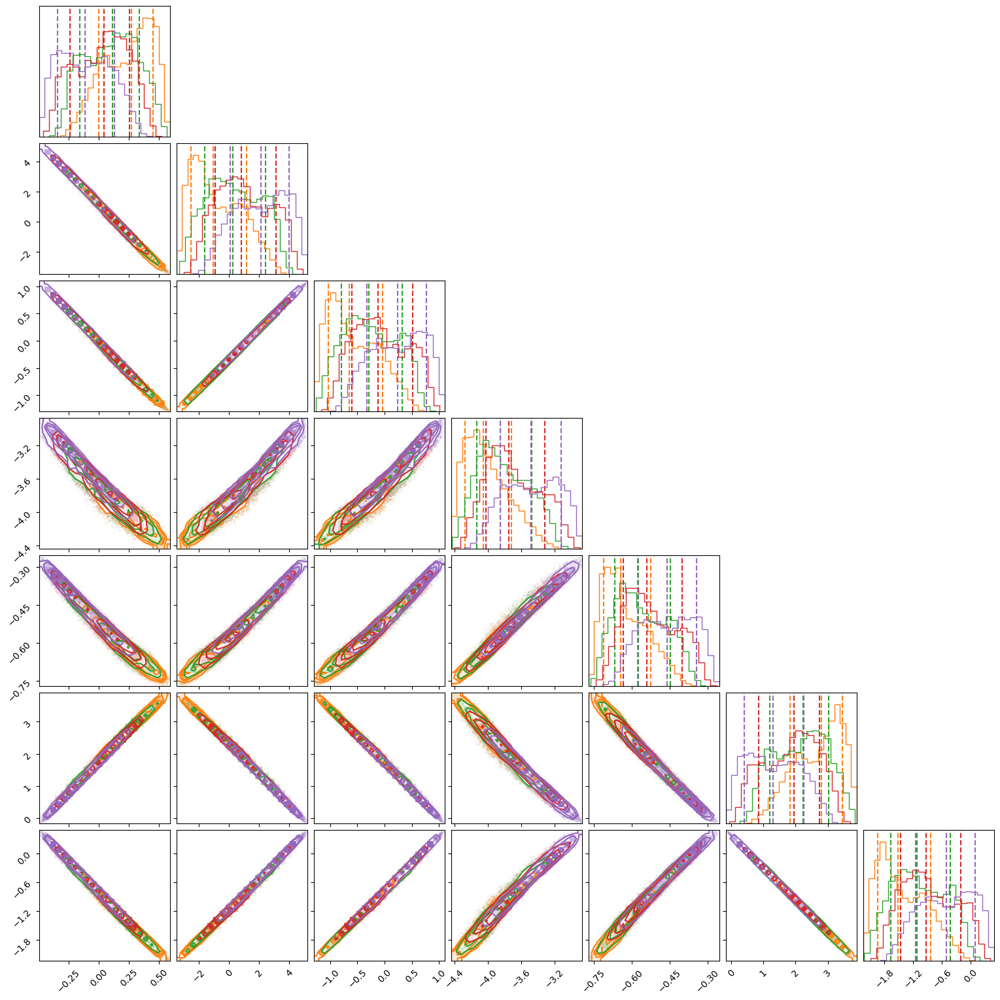

In [63]:
figure = corner.corner(
    similarity_outputs_1.cpu().numpy().reshape((similarity_outputs_1.shape[0]*similarity_outputs_1.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], color="C1"#, range = [[-1.2,-0.8], [-1.2,-0.8], [-1.2,-0.8]]
)

figure = corner.corner(
    similarity_outputs_2.cpu().numpy().reshape((similarity_outputs_2.shape[0]*similarity_outputs_2.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="C2"#, range = [[-1.2,-0.8], [-1.2,-0.8], [-1.2,-0.8]]
)

figure = corner.corner(
    similarity_outputs_3.cpu().numpy().reshape((similarity_outputs_3.shape[0]*similarity_outputs_3.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="C3"
)

figure = corner.corner(
    similarity_outputs_4.cpu().numpy().reshape((similarity_outputs_4.shape[0]*similarity_outputs_4.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="C4"
)


# Varying $X_{lan}$

In [64]:
similarity_embedding.train(False)
data_loader = test_data_loader_paper

similarity_outputs_1 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][2] < -5) and (shift_test[0][0][2] > -6)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_1.append(similarity_output)

similarity_outputs_2 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][2] < -6) and (shift_test[0][0][2] > -7)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_2.append(similarity_output)

similarity_outputs_3 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][2] < -7) and (shift_test[0][0][2] > -8)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_3.append(similarity_output)

similarity_outputs_4 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][2] < -8) and (shift_test[0][0][2] > -9)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_4.append(similarity_output)


In [65]:
similarity_outputs_1 = torch.stack(similarity_outputs_1)
similarity_outputs_2 = torch.stack(similarity_outputs_2)
similarity_outputs_3 = torch.stack(similarity_outputs_3)
similarity_outputs_4 = torch.stack(similarity_outputs_4)

In [66]:
similarity_outputs_1.shape, similarity_outputs_2.shape, similarity_outputs_3.shape, #similarity_outputs_4.shape

(torch.Size([154, 50, 7]), torch.Size([172, 50, 7]), torch.Size([149, 50, 7]))

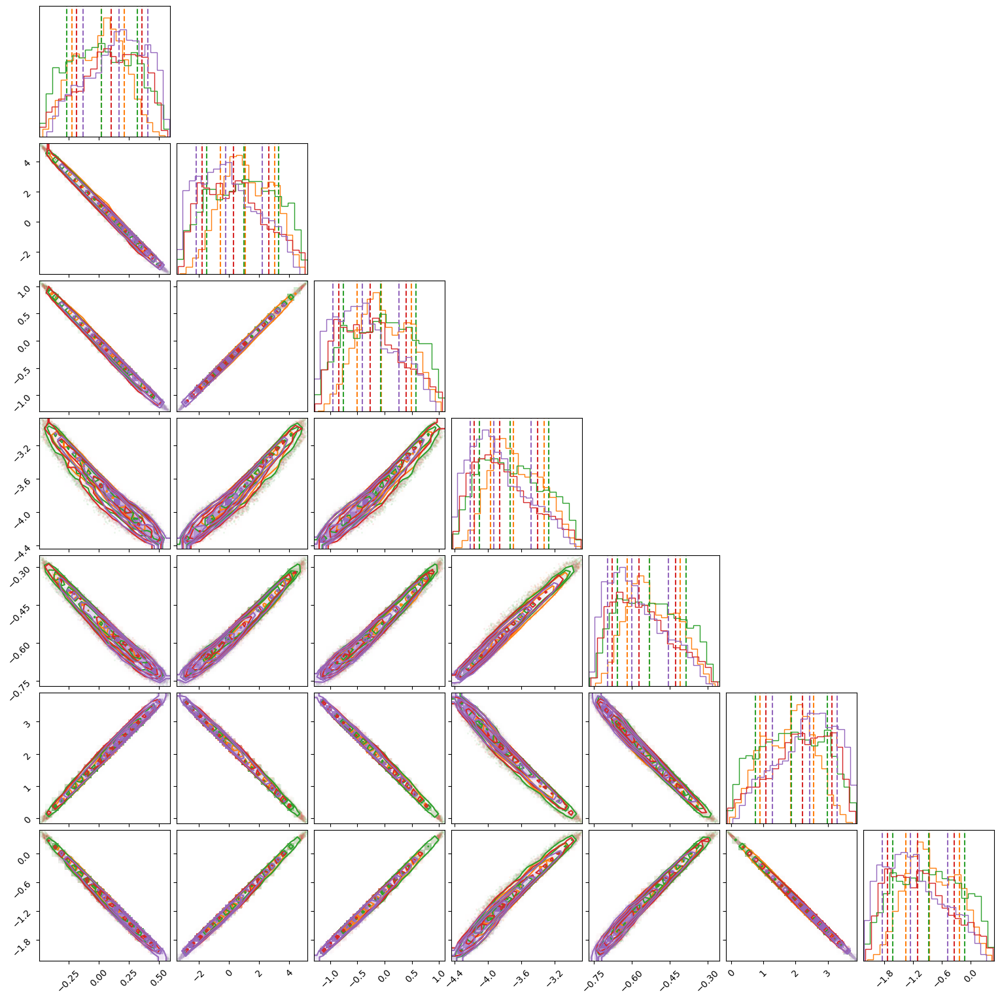

In [67]:
figure = corner.corner(
    similarity_outputs_1.cpu().numpy().reshape((similarity_outputs_1.shape[0]*similarity_outputs_1.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], color="C1"#, range = [[-1.2,-0.8], [-1.2,-0.8], [-1.2,-0.8]]
)

figure = corner.corner(
    similarity_outputs_2.cpu().numpy().reshape((similarity_outputs_2.shape[0]*similarity_outputs_2.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="C2", # range = [[-1.2,-0.8], [-1.2,-0.8], [-1.2,-0.8]]
)

figure = corner.corner(
    similarity_outputs_3.cpu().numpy().reshape((similarity_outputs_3.shape[0]*similarity_outputs_3.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="C3"
)

figure = corner.corner(
    similarity_outputs_4.cpu().numpy().reshape((similarity_outputs_4.shape[0]*similarity_outputs_4.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="C4"
)


# Varying All Parameters

In [68]:
similarity_embedding.train(False)
data_loader = test_data_loader_paper

similarity_outputs_1 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][0] < -1.5) and (shift_test[0][0][0] > -1.75)):
        continue
    if not ((shift_test[0][0][1] < -1.03) and (shift_test[0][0][1] > -1.0925)):
        continue
    if not ((shift_test[0][0][2] < -5) and (shift_test[0][0][2] > -6)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_1.append(similarity_output)

similarity_outputs_2 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][0] < -1.75) and (shift_test[0][0][0] > -2)):
        continue
    if not ((shift_test[0][0][1] < -1.0925) and (shift_test[0][0][1] > -1.1550)):
        continue
    if not ((shift_test[0][0][2] < -6) and (shift_test[0][0][2] > -7)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_2.append(similarity_output)

similarity_outputs_3 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][0] < -2) and (shift_test[0][0][0] > -2.25)):
        continue
    if not ((shift_test[0][0][1] < -1.1550) and (shift_test[0][0][1] > -1.2175)):
        continue
    if not ((shift_test[0][0][2] < -7) and (shift_test[0][0][2] > -8)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_3.append(similarity_output)

similarity_outputs_4 = []

for idx, (_, shift_test, data_test, data_test_orig) in enumerate(data_loader):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_test_orig = data_test_orig.reshape((-1,)+data_test_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    if not ((shift_test[0][0][0] < -2.25) and (shift_test[0][0][0] > -2.5)):
        continue
    if not ((shift_test[0][0][1] < -1.2175) and (shift_test[0][0][1] > -1.28)):
        continue
    if not ((shift_test[0][0][2] < -8) and (shift_test[0][0][2] > -9)):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_4.append(similarity_output)



In [69]:
similarity_outputs_1 = torch.stack(similarity_outputs_1)
similarity_outputs_2 = torch.stack(similarity_outputs_2)



In [71]:
similarity_outputs_3 = torch.stack(similarity_outputs_3)

RuntimeError: stack expects a non-empty TensorList

In [72]:
similarity_outputs_4 = torch.stack(similarity_outputs_4)

RuntimeError: stack expects a non-empty TensorList

In [73]:
similarity_outputs_1.shape, similarity_outputs_2.shape, #similarity_outputs_3.shape, similarity_outputs_4.shape

(torch.Size([27, 50, 7]), torch.Size([22, 50, 7]))

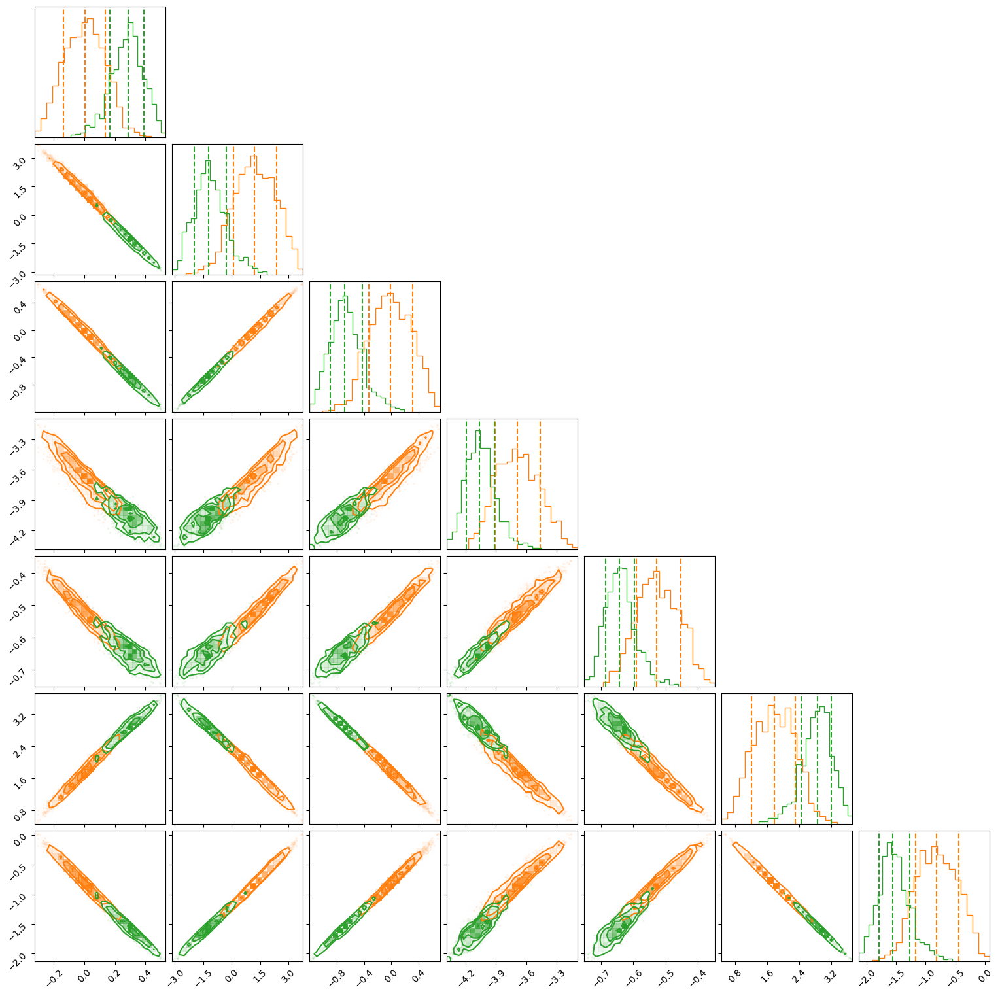

In [74]:
figure = corner.corner(
    similarity_outputs_1.cpu().numpy().reshape((similarity_outputs_1.shape[0]*similarity_outputs_1.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], color="C1"#, range = [[-1.2,-0.8], [-1.2,-0.8], [-1.2,-0.8]]
)

figure = corner.corner(
    similarity_outputs_2.cpu().numpy().reshape((similarity_outputs_2.shape[0]*similarity_outputs_2.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="C2", # range = [[-1.2,-0.8], [-1.2,-0.8], [-1.2,-0.8]]
)

# figure = corner.corner(
#     similarity_outputs_3.cpu().numpy().reshape((similarity_outputs_3.shape[0]*similarity_outputs_3.shape[1], num_dim)),
#     quantiles=[0.16, 0.5, 0.84], fig=figure, color="C3"
# )

# figure = corner.corner(
#     similarity_outputs_4.cpu().numpy().reshape((similarity_outputs_4.shape[0]*similarity_outputs_4.shape[1], num_dim)),
#     quantiles=[0.16, 0.5, 0.84], fig=figure, color="C4"
# )



# Testing Embedding

## Loading Test Data

In [132]:
alph_list = ['a', 'b', 'c', 'd']
test_sets = []

for i in range(1, 13):
    for j in range(0, 4):
        set_label = str(i) + alph_list[j]
        test_sets.append(set_label)

In [88]:
# get the test data

sim_path_test = '/nobackup/users/mmdesai/test_lc/test_lc/'
num_sims_test = 300

test_simembed_dict = {}
simembed_num_lc_list = [num_sims_test] * 48

for i in range (0, 48):
    file_names = get_test_names(sim_path_test, 'test', test_sets[i], simembed_num_lc_list[i])
    test_simembed_dict['test_simembed_data_{}'.format(i)] = json_to_df(file_names, simembed_num_lc_list[i])
    # identify which dataframes have a large number of detections
    # test_nonzero_list = []
    # for df in tqdm(range(len(test_simembed_dict['test_simembed_data_{}'.format(i)]))):    
    #     single_df = test_simembed_dict['test_simembed_data_{}'.format(i)][df]
    #     detections = single_df.iloc[0, 4]
    #     if detections > 15:
    #         single_df = single_df.drop(columns = {'num_detections'})
    #         test_nonzero_list.append(single_df)
    # test_simembed_dict['test_simembed_data_{}'.format(i)] = test_nonzero_list
    # pad the data
    test_simembed_dict['test_simembed_data_{}'.format(i)] = pad_all_dfs(test_simembed_dict['test_simembed_data_{}'.format(i)])


100%|██████████| 300/300 [00:01<00:00, 277.66it/s]


Text(0, 0.5, 'Magnitude')

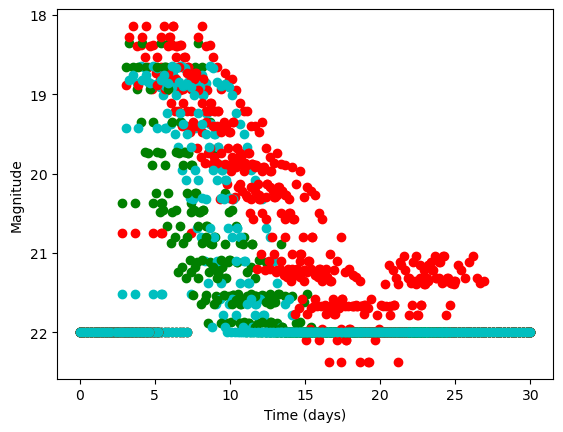

In [90]:
for i in range(0, 300, 50):
    plt.scatter(test_simembed_dict['test_simembed_data_0'][i]['t'], test_simembed_dict['test_simembed_data_0'][i]['ztfg'], color = 'g')
    plt.scatter(test_simembed_dict['test_simembed_data_0'][i]['t'], test_simembed_dict['test_simembed_data_0'][i]['ztfr'], color = 'r')
    plt.scatter(test_simembed_dict['test_simembed_data_0'][i]['t'], test_simembed_dict['test_simembed_data_0'][i]['ztfi'], color = 'c')
plt.gca().invert_yaxis()
plt.xlabel('Time (days)')
plt.ylabel('Magnitude')

In [96]:
# injection files

inj_path_simembed = '/nobackup/users/mmdesai/test_lc_injections'
test_injections = {}

for i in range(0, 48):
    test_inj_df = pd.DataFrame()
    test_params = open_json('/injection_{}.json'.format(test_sets[i]), inj_path_simembed)
    test_inj_df['mej'] = test_params['injections']['content']['log10_mej']
    test_inj_df['vej'] = test_params['injections']['content']['log10_vej']
    test_inj_df['xlan'] = test_params['injections']['content']['log10_Xlan']
    test_inj_df['shift'] = test_params['injections']['content']['timeshift']
    test_inj_df['distance'] = test_params['injections']['content']['luminosity_distance']
    test_inj_df['sim_id'] = test_params['injections']['content']['simulation_id']
    test_injections['test_inj_df{}'.format(i)] = test_inj_df


In [97]:
test_injections['test_inj_df3']

,mej,vej,xlan,shift,distance,sim_id
0,-1.75,-1.0925,-9.0,4.583313,200.0,0
1,-1.75,-1.0925,-9.0,4.195801,200.0,1
2,-1.75,-1.0925,-9.0,-0.299832,200.0,2
3,-1.75,-1.0925,-9.0,1.950621,200.0,3
4,-1.75,-1.0925,-9.0,3.798223,200.0,4
...,...,...,...,...,...,...
295,-1.75,-1.0925,-9.0,0.903018,200.0,295
296,-1.75,-1.0925,-9.0,2.553824,200.0,296
297,-1.75,-1.0925,-9.0,3.261609,200.0,297
298,-1.75,-1.0925,-9.0,5.840928,200.0,298


In [95]:
# concatenate dataframe lists

all_test_data_list = [0] * 48

for i in range(0, 48):
    all_test_data_list[i] = pd.concat(test_simembed_dict['test_simembed_data_{}'.format(i)])

In [99]:
# merge with injection parameters

all_test_datawparams_list = [0] * 48

for i in range(0, 48):
    all_test_datawparams_list[i] = all_test_data_list[i].merge(test_injections['test_inj_df{}'.format(i)], on = 'sim_id')
    all_test_datawparams_list[i].to_csv('test_{}.csv'.format(i), index = False)

## Load in Test Data

In [75]:
# load in the csv files
test_dir = '/home/mmdesai/'
test_df = load_in_data(test_dir, 'test', 48, num_repeats=300)
test_df

,t,ztfg,ztfr,ztfi,sim_id,num_detections,mej,vej,xlan,shift,distance,batch_id
0,0.00,22.0,22.0,22.0,0,128,-1.75,-1.0925,-9.0,2.908850,50.0,0
1,0.25,22.0,22.0,22.0,0,128,-1.75,-1.0925,-9.0,2.908850,50.0,0
2,0.50,22.0,22.0,22.0,0,128,-1.75,-1.0925,-9.0,2.908850,50.0,0
3,0.75,22.0,22.0,22.0,0,128,-1.75,-1.0925,-9.0,2.908850,50.0,0
4,1.00,22.0,22.0,22.0,0,128,-1.75,-1.0925,-9.0,2.908850,50.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
36295,29.00,22.0,22.0,22.0,14399,0,-2.25,-1.2175,-6.0,-0.168261,200.0,47
36296,29.25,22.0,22.0,22.0,14399,0,-2.25,-1.2175,-6.0,-0.168261,200.0,47
36297,29.50,22.0,22.0,22.0,14399,0,-2.25,-1.2175,-6.0,-0.168261,200.0,47
36298,29.75,22.0,22.0,22.0,14399,0,-2.25,-1.2175,-6.0,-0.168261,200.0,47


## Checking with the Embedding

In [76]:
# function for loading the data

def test_df_to_tensor(df_test, batches, num_repeats):
    data_shifted_list = []
    param_shifted_list = []

    for idx in tqdm(range(0, batches)):
        data_shifted = torch.tensor(df_test.loc[df_test['batch_id'] == idx].iloc[:, 1:4].values.reshape(num_repeats, num_points, num_channels), 
                                    dtype=torch.float32).transpose(1, 2)
        param_shifted = torch.tensor(df_test.loc[df_test['batch_id'] == idx].iloc[::num_points, 6:11].values, 
                                    dtype=torch.float32).unsqueeze(2).transpose(1,2)
        data_shifted_list.append(data_shifted)
        param_shifted_list.append(param_shifted)
        
    return data_shifted_list, param_shifted_list

In [77]:
# moving the data to tensors on gpu

num_batches_test = len(test_df['batch_id'].unique())
data_shifted_test, param_shifted_test = test_df_to_tensor(test_df, num_batches_test, 300)

100%|██████████| 48/48 [00:03<00:00, 14.31it/s]


In [78]:
data_shifted_test[0].shape

torch.Size([300, 3, 121])

In [79]:
param_shifted_test[0].shape

torch.Size([300, 1, 5])

In [80]:
class Test_data(Dataset):
    def __len__(self):
        return (num_batches_test)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        # gr_color = data_shifted_test[idx][:, 0, :] - data_shifted_test[idx][:, 1, :]
        # gi_color = data_shifted_test[idx][:, 0, :] - data_shifted_test[idx][:, 2, :]
        # ri_color = data_shifted_test[idx][:, 1, :] - data_shifted_test[idx][:, 2, :]

        # color_shifted_test = torch.stack((gr_color, gi_color, ri_color), dim = 1)
        
        return (
            param_shifted_test[idx].to(device),
            data_shifted_test[idx].to(device)
            # color_shifted_test.to(device)
        )

In [81]:
# define dataset

test_dataset = Test_data()

t, d = test_dataset[0]
print(t.shape, d.shape)

torch.Size([300, 1, 5]) torch.Size([300, 3, 121])


In [82]:
len(test_dataset)

48

In [83]:
similarity_outputs_1 = []

for idx, (shift_test, data_test) in enumerate(test_dataset):
    if (shift_test[0][0][2] != -9):
        continue
    if (shift_test[0][0][0] != -1.75):
        continue
    if (shift_test[0][0][1] != -1.0925):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_1.append(similarity_output)

similarity_outputs_2 = []

for idx, (shift_test, data_test) in enumerate(test_dataset):
    if (shift_test[0][0][2] != -8):
        continue
    if (shift_test[0][0][0] != -1.75):
        continue
    if (shift_test[0][0][1] != -1.0925):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_2.append(similarity_output)

similarity_outputs_3 = []

for idx, (shift_test, data_test) in enumerate(test_dataset):
    if (shift_test[0][0][2] != -7):
        continue
    if (shift_test[0][0][0] != -1.75):
        continue
    if (shift_test[0][0][1] != -1.0925):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_3.append(similarity_output)

similarity_outputs_4 = []

for idx, (shift_test, data_test) in enumerate(test_dataset):
    if (shift_test[0][0][2] != -6):
        continue
    if (shift_test[0][0][0] != -1.75):
        continue
    if (shift_test[0][0][1] != -1.0925):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_4.append(similarity_output)

similarity_outputs_5 = []

for idx, (shift_test, data_test) in enumerate(test_dataset):
    if (shift_test[0][0][2] != -9):
        continue
    if (shift_test[0][0][0] != -2):
        continue
    if (shift_test[0][0][1] != -1.155):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_5.append(similarity_output)

similarity_outputs_6 = []

for idx, (shift_test, data_test) in enumerate(test_dataset):
    if (shift_test[0][0][2] != -8):
        continue
    if (shift_test[0][0][0] != -2):
        continue
    if (shift_test[0][0][1] != -1.155):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_6.append(similarity_output)

similarity_outputs_7 = []

for idx, (shift_test, data_test) in enumerate(test_dataset):
    if (shift_test[0][0][2] != -7):
        continue
    if (shift_test[0][0][0] != -2):
        continue
    if (shift_test[0][0][1] != -1.155):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_7.append(similarity_output)

similarity_outputs_8 = []

for idx, (shift_test, data_test) in enumerate(test_dataset):
    if (shift_test[0][0][2] != -6):
        continue
    if (shift_test[0][0][0] != -2):
        continue
    if (shift_test[0][0][1] != -1.155):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_8.append(similarity_output)

similarity_outputs_9 = []

for idx, (shift_test, data_test) in enumerate(test_dataset):
    if (shift_test[0][0][2] != -9):
        continue
    if (shift_test[0][0][0] != -2.25):
        continue
    if (shift_test[0][0][1] != -1.2175):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_9.append(similarity_output)

similarity_outputs_10 = []

for idx, (shift_test, data_test) in enumerate(test_dataset):
    if (shift_test[0][0][2] != -8):
        continue
    if (shift_test[0][0][0] != -2.25):
        continue
    if (shift_test[0][0][1] != -1.2175):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_10.append(similarity_output)

similarity_outputs_11 = []

for idx, (shift_test, data_test) in enumerate(test_dataset):
    if (shift_test[0][0][2] != -7):
        continue
    if (shift_test[0][0][0] != -2.25):
        continue
    if (shift_test[0][0][1] != -1.2175):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_11.append(similarity_output)

similarity_outputs_12 = []

for idx, (shift_test, data_test) in enumerate(test_dataset):
    if (shift_test[0][0][2] != -6):
        continue
    if (shift_test[0][0][0] != -2.25):
        continue
    if (shift_test[0][0][1] != -1.2175):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_12.append(similarity_output)

In [84]:
similarity_outputs_1 = torch.stack(similarity_outputs_1)
similarity_outputs_2 = torch.stack(similarity_outputs_2)
similarity_outputs_3 = torch.stack(similarity_outputs_3)
similarity_outputs_4 = torch.stack(similarity_outputs_4)
similarity_outputs_5 = torch.stack(similarity_outputs_5)
similarity_outputs_6 = torch.stack(similarity_outputs_6)
similarity_outputs_7 = torch.stack(similarity_outputs_7)
similarity_outputs_8 = torch.stack(similarity_outputs_8)
similarity_outputs_9 = torch.stack(similarity_outputs_9)
similarity_outputs_10 = torch.stack(similarity_outputs_10)
similarity_outputs_11 = torch.stack(similarity_outputs_11)
similarity_outputs_12 = torch.stack(similarity_outputs_12)

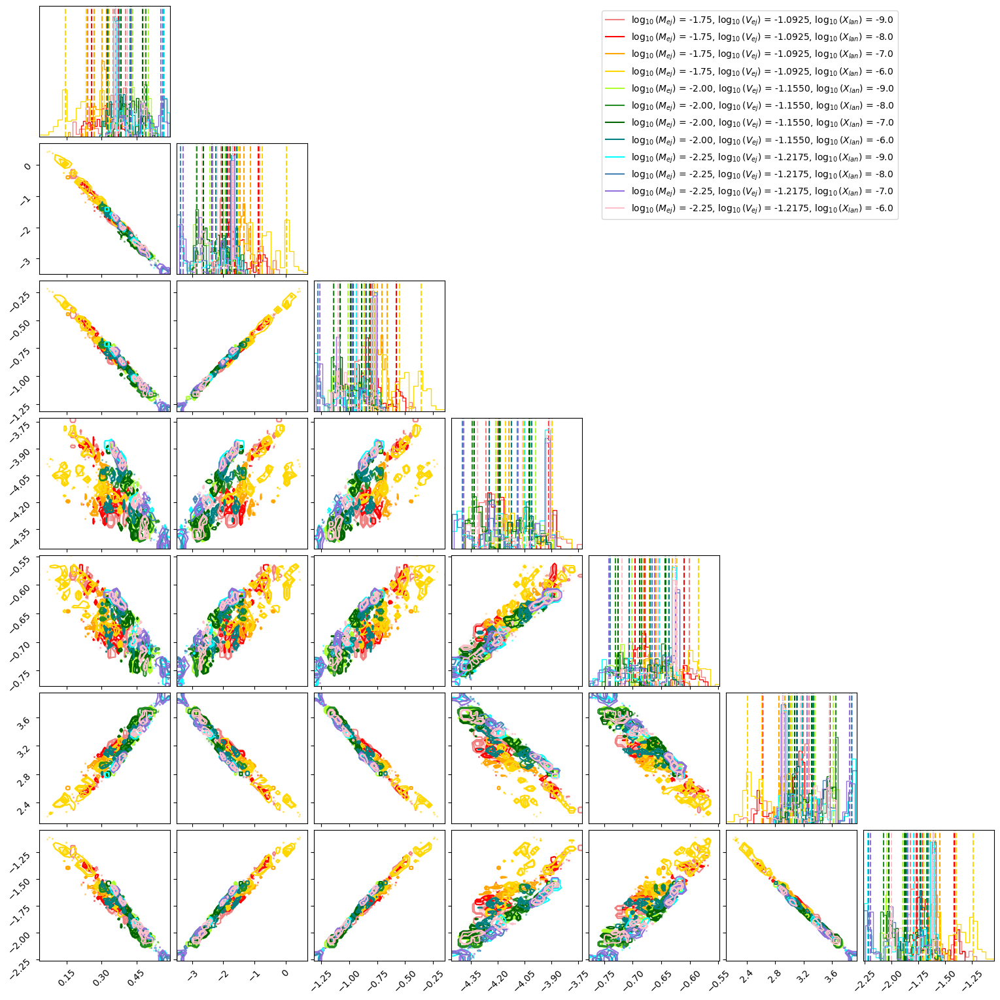

In [85]:
import matplotlib.lines as mlines

figure = corner.corner(
    similarity_outputs_1.cpu().numpy().reshape((similarity_outputs_1.shape[0]*similarity_outputs_1.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], color="lightcoral"
)
coral_line = mlines.Line2D([], [], color='lightcoral', 
                           label='$\log_{{10}}(M_{{ej}})$ = -1.75, $\log_{{10}}(V_{{ej}})$ = -1.0925, $\log_{{10}}(X_{{lan}})$ = -9.0')

figure = corner.corner(
    similarity_outputs_2.cpu().numpy().reshape((similarity_outputs_2.shape[0]*similarity_outputs_2.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="red",
)
red_line = mlines.Line2D([], [], color='red', 
                         label='$\log_{{10}}(M_{{ej}})$ = -1.75, $\log_{{10}}(V_{{ej}})$ = -1.0925, $\log_{{10}}(X_{{lan}})$ = -8.0')

figure = corner.corner(
    similarity_outputs_3.cpu().numpy().reshape((similarity_outputs_3.shape[0]*similarity_outputs_3.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="orange"
)
orange_line = mlines.Line2D([], [], color='orange', 
                            label='$\log_{{10}}(M_{{ej}})$ = -1.75, $\log_{{10}}(V_{{ej}})$ = -1.0925, $\log_{{10}}(X_{{lan}})$ = -7.0')

figure = corner.corner(
    similarity_outputs_4.cpu().numpy().reshape((similarity_outputs_4.shape[0]*similarity_outputs_4.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="gold",
)
gold_line = mlines.Line2D([], [], color='gold', 
                          label='$\log_{{10}}(M_{{ej}})$ = -1.75, $\log_{{10}}(V_{{ej}})$ = -1.0925, $\log_{{10}}(X_{{lan}})$ = -6.0')

figure = corner.corner(
    similarity_outputs_5.cpu().numpy().reshape((similarity_outputs_5.shape[0]*similarity_outputs_5.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="greenyellow"
)
yellow_line = mlines.Line2D([], [], color='greenyellow', 
                            label='$\log_{{10}}(M_{{ej}})$ = -2.00, $\log_{{10}}(V_{{ej}})$ = -1.1550, $\log_{{10}}(X_{{lan}})$ = -9.0')

figure = corner.corner(
    similarity_outputs_6.cpu().numpy().reshape((similarity_outputs_6.shape[0]*similarity_outputs_6.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="forestgreen"
)
forest_line = mlines.Line2D([], [], color='forestgreen', 
                            label='$\log_{{10}}(M_{{ej}})$ = -2.00, $\log_{{10}}(V_{{ej}})$ = -1.1550, $\log_{{10}}(X_{{lan}})$ = -8.0')

figure = corner.corner(
    similarity_outputs_7.cpu().numpy().reshape((similarity_outputs_7.shape[0]*similarity_outputs_7.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="darkgreen", 
)
darkgreen_line = mlines.Line2D([], [], color='darkgreen', 
                               label='$\log_{{10}}(M_{{ej}})$ = -2.00, $\log_{{10}}(V_{{ej}})$ = -1.1550, $\log_{{10}}(X_{{lan}})$ = -7.0')

figure = corner.corner(
    similarity_outputs_8.cpu().numpy().reshape((similarity_outputs_8.shape[0]*similarity_outputs_8.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color='teal', 
)
teal_line = mlines.Line2D([], [], color='teal', 
                          label='$\log_{{10}}(M_{{ej}})$ = -2.00, $\log_{{10}}(V_{{ej}})$ = -1.1550, $\log_{{10}}(X_{{lan}})$ = -6.0')

figure = corner.corner(
    similarity_outputs_9.cpu().numpy().reshape((similarity_outputs_9.shape[0]*similarity_outputs_9.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color = 'cyan'
)
cyan_line = mlines.Line2D([], [], color='cyan', 
                          label='$\log_{{10}}(M_{{ej}})$ = -2.25, $\log_{{10}}(V_{{ej}})$ = -1.2175, $\log_{{10}}(X_{{lan}})$ = -9.0')

figure = corner.corner(
    similarity_outputs_10.cpu().numpy().reshape((similarity_outputs_10.shape[0]*similarity_outputs_10.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color = 'steelblue'
)
blue_line = mlines.Line2D([], [], color='steelblue', 
                          label='$\log_{{10}}(M_{{ej}})$ = -2.25, $\log_{{10}}(V_{{ej}})$ = -1.2175, $\log_{{10}}(X_{{lan}})$ = -8.0')

figure = corner.corner(
    similarity_outputs_11.cpu().numpy().reshape((similarity_outputs_11.shape[0]*similarity_outputs_11.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color = 'mediumpurple', 
)
purple_line = mlines.Line2D([], [], color='mediumpurple', 
                            label='$\log_{{10}}(M_{{ej}})$ = -2.25, $\log_{{10}}(V_{{ej}})$ = -1.2175, $\log_{{10}}(X_{{lan}})$ = -7.0')

figure = corner.corner(
    similarity_outputs_12.cpu().numpy().reshape((similarity_outputs_12.shape[0]*similarity_outputs_12.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color = 'pink'
)
pink_line = mlines.Line2D([], [], color='pink', 
                          label='$\log_{{10}}(M_{{ej}})$ = -2.25, $\log_{{10}}(V_{{ej}})$ = -1.2175, $\log_{{10}}(X_{{lan}})$ = -6.0')

plt.legend(handles=
           [coral_line, red_line, orange_line, gold_line, yellow_line, forest_line, darkgreen_line, 
            teal_line, cyan_line, blue_line, purple_line, pink_line],
            bbox_to_anchor=(0.3, 7.3)
          )

In [86]:
similarity_outputs_1_fixed = []

for idx, (shift_test, data_test) in enumerate(test_fixed_dataset):
    if (shift_test[0][0][2] != -9):
        continue
    if (shift_test[0][0][0] != -1.75):
        continue
    if (shift_test[0][0][1] != -1.0925):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_1_fixed.append(similarity_output)

similarity_outputs_2_fixed  = []

for idx, (shift_test, data_test) in enumerate(test_fixed_dataset):
    if (shift_test[0][0][2] != -8):
        continue
    if (shift_test[0][0][0] != -1.75):
        continue
    if (shift_test[0][0][1] != -1.0925):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_2_fixed.append(similarity_output)

similarity_outputs_3_fixed = []

for idx, (shift_test, data_test) in enumerate(test_fixed_dataset):
    if (shift_test[0][0][2] != -7):
        continue
    if (shift_test[0][0][0] != -1.75):
        continue
    if (shift_test[0][0][1] != -1.0925):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_3_fixed.append(similarity_output)

similarity_outputs_4_fixed = []

for idx, (shift_test, data_test) in enumerate(test_fixed_dataset):
    if (shift_test[0][0][2] != -6):
        continue
    if (shift_test[0][0][0] != -1.75):
        continue
    if (shift_test[0][0][1] != -1.0925):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_4_fixed.append(similarity_output)

similarity_outputs_5_fixed = []

for idx, (shift_test, data_test) in enumerate(test_fixed_dataset):
    if (shift_test[0][0][2] != -9):
        continue
    if (shift_test[0][0][0] != -2):
        continue
    if (shift_test[0][0][1] != -1.155):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_5_fixed.append(similarity_output)

similarity_outputs_6_fixed = []

for idx, (shift_test, data_test) in enumerate(test_fixed_dataset):
    if (shift_test[0][0][2] != -8):
        continue
    if (shift_test[0][0][0] != -2):
        continue
    if (shift_test[0][0][1] != -1.155):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_6_fixed.append(similarity_output)

similarity_outputs_7_fixed = []

for idx, (shift_test, data_test) in enumerate(test_fixed_dataset):
    if (shift_test[0][0][2] != -7):
        continue
    if (shift_test[0][0][0] != -2):
        continue
    if (shift_test[0][0][1] != -1.155):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_7_fixed.append(similarity_output)

similarity_outputs_8_fixed = []

for idx, (shift_test, data_test) in enumerate(test_fixed_dataset):
    if (shift_test[0][0][2] != -6):
        continue
    if (shift_test[0][0][0] != -2):
        continue
    if (shift_test[0][0][1] != -1.155):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_8_fixed.append(similarity_output)

similarity_outputs_9_fixed = []

for idx, (shift_test, data_test) in enumerate(test_fixed_dataset):
    if (shift_test[0][0][2] != -9):
        continue
    if (shift_test[0][0][0] != -2.25):
        continue
    if (shift_test[0][0][1] != -1.2175):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_9_fixed.append(similarity_output)

similarity_outputs_10_fixed = []

for idx, (shift_test, data_test) in enumerate(test_fixed_dataset):
    if (shift_test[0][0][2] != -8):
        continue
    if (shift_test[0][0][0] != -2.25):
        continue
    if (shift_test[0][0][1] != -1.2175):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_10_fixed.append(similarity_output)

similarity_outputs_11_fixed = []

for idx, (shift_test, data_test) in enumerate(test_fixed_dataset):
    if (shift_test[0][0][2] != -7):
        continue
    if (shift_test[0][0][0] != -2.25):
        continue
    if (shift_test[0][0][1] != -1.2175):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_11_fixed.append(similarity_output)

similarity_outputs_12_fixed = []

for idx, (shift_test, data_test) in enumerate(test_fixed_dataset):
    if (shift_test[0][0][2] != -6):
        continue
    if (shift_test[0][0][0] != -2.25):
        continue
    if (shift_test[0][0][1] != -1.2175):
        continue
    with torch.no_grad():
        _, similarity_output = similarity_embedding(data_test)
    similarity_outputs_12_fixed.append(similarity_output)

NameError: name 'test_fixed_dataset' is not defined

In [ ]:
similarity_outputs_1_fixed = torch.stack(similarity_outputs_1_fixed)
similarity_outputs_2_fixed = torch.stack(similarity_outputs_2_fixed)
similarity_outputs_3_fixed = torch.stack(similarity_outputs_3_fixed)
similarity_outputs_4_fixed = torch.stack(similarity_outputs_4_fixed)
similarity_outputs_5_fixed = torch.stack(similarity_outputs_5_fixed)
similarity_outputs_6_fixed = torch.stack(similarity_outputs_6_fixed)
similarity_outputs_7_fixed = torch.stack(similarity_outputs_7_fixed)
similarity_outputs_8_fixed = torch.stack(similarity_outputs_8_fixed)
similarity_outputs_9_fixed = torch.stack(similarity_outputs_9_fixed)
similarity_outputs_10_fixed = torch.stack(similarity_outputs_10_fixed)
similarity_outputs_11_fixed = torch.stack(similarity_outputs_11_fixed)
similarity_outputs_12_fixed = torch.stack(similarity_outputs_12_fixed)

In [ ]:
figure = corner.corner(
    similarity_outputs_1.cpu().numpy().reshape((similarity_outputs_1.shape[0]*similarity_outputs_1.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], color="lightcoral"
)
coral_line = mlines.Line2D([], [], color='lightcoral', 
                           label='$\log_{{10}}(M_{{ej}})$ = -1.75, $\log_{{10}}(V_{{ej}})$ = -1.0925, $\log_{{10}}(X_{{lan}})$ = -9.0')

figure = corner.corner(
    similarity_outputs_2.cpu().numpy().reshape((similarity_outputs_2.shape[0]*similarity_outputs_2.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="red",
)
red_line = mlines.Line2D([], [], color='red', 
                         label='$\log_{{10}}(M_{{ej}})$ = -1.75, $\log_{{10}}(V_{{ej}})$ = -1.0925, $\log_{{10}}(X_{{lan}})$ = -8.0')

figure = corner.corner(
    similarity_outputs_3.cpu().numpy().reshape((similarity_outputs_3.shape[0]*similarity_outputs_3.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="orange"
)
orange_line = mlines.Line2D([], [], color='orange', 
                            label='$\log_{{10}}(M_{{ej}})$ = -1.75, $\log_{{10}}(V_{{ej}})$ = -1.0925, $\log_{{10}}(X_{{lan}})$ = -7.0')

figure = corner.corner(
    similarity_outputs_4.cpu().numpy().reshape((similarity_outputs_4.shape[0]*similarity_outputs_4.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="gold",
)
gold_line = mlines.Line2D([], [], color='gold', 
                          label='$\log_{{10}}(M_{{ej}})$ = -1.75, $\log_{{10}}(V_{{ej}})$ = -1.0925, $\log_{{10}}(X_{{lan}})$ = -6.0')

figure = corner.corner(
    similarity_outputs_1_fixed.cpu().numpy().reshape((similarity_outputs_1_fixed.shape[0]*similarity_outputs_1_fixed.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="lightcoral",
)
royal_line = mlines.Line2D([], [], color='royalblue', 
                           label='$\log_{{10}}(M_{{ej}})$ = -1.75, $\log_{{10}}(V_{{ej}})$ = -1.0925, $\log_{{10}}(X_{{lan}})$ = -9.0')

figure = corner.corner(
    similarity_outputs_2_fixed.cpu().numpy().reshape((similarity_outputs_2_fixed.shape[0]*similarity_outputs_2_fixed.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="red",
)
red_line = mlines.Line2D([], [], color='red', 
                         label='$\log_{{10}}(M_{{ej}})$ = -1.75, $\log_{{10}}(V_{{ej}})$ = -1.0925, $\log_{{10}}(X_{{lan}})$ = -8.0')

figure = corner.corner(
    similarity_outputs_3.cpu().numpy().reshape((similarity_outputs_3.shape[0]*similarity_outputs_3.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="orange"
)
orange_line = mlines.Line2D([], [], color='orange', 
                            label='$\log_{{10}}(M_{{ej}})$ = -1.75, $\log_{{10}}(V_{{ej}})$ = -1.0925, $\log_{{10}}(X_{{lan}})$ = -7.0')

figure = corner.corner(
    similarity_outputs_4.cpu().numpy().reshape((similarity_outputs_4.shape[0]*similarity_outputs_4.shape[1], num_dim)),
    quantiles=[0.16, 0.5, 0.84], fig=figure, color="gold",
)
gold_line = mlines.Line2D([], [], color='gold', 
                          label='$\log_{{10}}(M_{{ej}})$ = -1.75, $\log_{{10}}(V_{{ej}})$ = -1.0925, $\log_{{10}}(X_{{lan}})$ = -6.0')



# Normalizing Flow Training Data

### Fixed Data

In [24]:
# get the fixed data

norm_path = '/nobackup/users/mmdesai'
num_sims = 25000

fixed_normflow_dict = {}
normflow_num_lc_list = [25000, 25000, 25000, 25000, 25000, 24905, 25000, 25000, 25000, 25000,
                        25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000]
for i in range(0, 20):
    # get the names of each file
    file_names = get_names(norm_path, 'fixed', i, normflow_num_lc_list[i])
    # open the files as dataframes
    fixed_normflow_dict['fixed_normflow_data_{}'.format(i)] = json_to_df(file_names, normflow_num_lc_list[i])
    # # identify which dataframes have a large number of detections
    # fixed_nonzero_list = []
    # for df in tqdm(range(len(fixed_normflow_dict['fixed_normflow_data_{}'.format(i)]))):    
    #     single_df = fixed_normflow_dict['fixed_normflow_data_{}'.format(i)][df]
    #     detections = single_df.iloc[0, 4]
    #     if detections > 8:
    #         single_df = single_df.drop(columns = {'num_detections'})
    #         fixed_nonzero_list.append(single_df)
    # fixed_normflow_dict['fixed_normflow_data_{}'.format(i)] = fixed_nonzero_list
    # pad the data
    fixed_normflow_dict['fixed_normflow_data_{}'.format(i)] = pad_all_dfs(fixed_normflow_dict['fixed_normflow_data_{}'.format(i)])

100%|██████████| 25000/25000 [01:38<00:00, 254.07it/s]


In [25]:
fixed_normflow_dict['fixed_normflow_data_19'][0]

,t,ztfg,ztfr,ztfi,sim_id,num_detections
0,0.00,22.0,22.0,22.0,0,100
1,0.25,22.0,22.0,22.0,0,100
2,0.50,22.0,22.0,22.0,0,100
3,0.75,22.0,22.0,22.0,0,100
4,1.00,22.0,22.0,22.0,0,100
...,...,...,...,...,...,...
116,29.00,22.0,22.0,22.0,0,100
117,29.25,22.0,22.0,22.0,0,100
118,29.50,22.0,22.0,22.0,0,100
119,29.75,22.0,22.0,22.0,0,100


Text(0, 0.5, 'Magnitude')

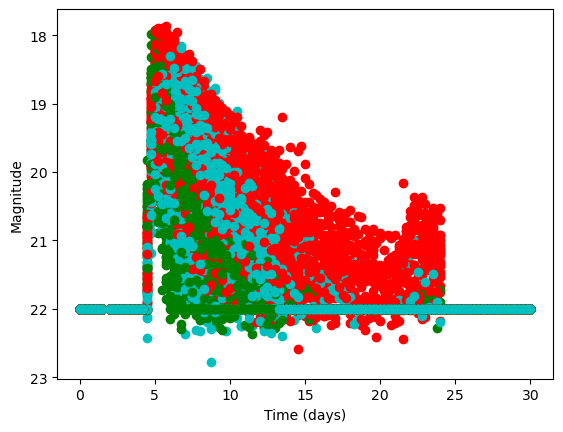

In [26]:
for i in range(0, 50):
    plt.scatter(fixed_normflow_dict['fixed_normflow_data_0'][i]['t'], fixed_normflow_dict['fixed_normflow_data_0'][i]['ztfg'], color = 'g')
    plt.scatter(fixed_normflow_dict['fixed_normflow_data_0'][i]['t'], fixed_normflow_dict['fixed_normflow_data_0'][i]['ztfr'], color = 'r')
    plt.scatter(fixed_normflow_dict['fixed_normflow_data_0'][i]['t'], fixed_normflow_dict['fixed_normflow_data_0'][i]['ztfi'], color = 'c')
plt.gca().invert_yaxis()
plt.xlabel('Time (days)')
plt.ylabel('Magnitude')

In [31]:
# injection files

fixed_normflow_inj_dict = {}
inj_path_normflow = '/nobackup/users/mmdesai/normflow_injections/'

for i in range(0, 20):
    fixed_inj_df = pd.DataFrame()
    fixed_params = open_json('/injection_normflow_fixed_{}.json'.format(i), inj_path_normflow)
    fixed_inj_df['mej'] = fixed_params['injections']['content']['log10_mej']
    fixed_inj_df['vej'] = fixed_params['injections']['content']['log10_vej']
    fixed_inj_df['xlan'] = fixed_params['injections']['content']['log10_Xlan']
    fixed_inj_df['shift'] = fixed_params['injections']['content']['timeshift']
    fixed_inj_df['distance'] = fixed_params['injections']['content']['luminosity_distance']
    fixed_inj_df['sim_id'] = fixed_params['injections']['content']['simulation_id']
    fixed_normflow_inj_dict['fixed_inj_df{}'.format(i)] = fixed_inj_df

In [32]:
fixed_normflow_inj_dict['fixed_inj_df0']

,mej,vej,xlan,shift,distance,sim_id
0,-2.058608,-1.229586,-6.555715,0.0,50.0,0
1,-1.820804,-1.134319,-8.248498,0.0,50.0,1
2,-1.887000,-1.141469,-5.826400,0.0,50.0,2
3,-1.772774,-1.122784,-8.204261,0.0,50.0,3
4,-1.620436,-1.144738,-5.879885,0.0,50.0,4
...,...,...,...,...,...,...
24995,-1.770839,-1.136438,-6.131920,0.0,50.0,24995
24996,-1.625056,-1.204240,-5.312524,0.0,50.0,24996
24997,-2.332450,-1.144833,-5.960271,0.0,50.0,24997
24998,-1.581504,-1.100713,-7.770452,0.0,50.0,24998


In [33]:
# concatenate dataframe lists

all_fixed_data_list_flow = [0] * 20

for i in range(0, 20):
    all_fixed_data_list_flow[i] = pd.concat(fixed_normflow_dict['fixed_normflow_data_{}'.format(i)])

In [34]:
all_fixed_data_list_flow[0]

,t,ztfg,ztfr,ztfi,sim_id,num_detections
0,0.00,22.0,22.0,22.0,0,82
1,0.25,22.0,22.0,22.0,0,82
2,0.50,22.0,22.0,22.0,0,82
3,0.75,22.0,22.0,22.0,0,82
4,1.00,22.0,22.0,22.0,0,82
...,...,...,...,...,...,...
116,29.00,22.0,22.0,22.0,24999,60
117,29.25,22.0,22.0,22.0,24999,60
118,29.50,22.0,22.0,22.0,24999,60
119,29.75,22.0,22.0,22.0,24999,60


In [35]:
# merge with injection parameters

all_fixed_datawparams_list_flow = [0] * 20

for i in range(0, 20):
    all_fixed_datawparams_list_flow[i] = all_fixed_data_list_flow[i].merge(fixed_normflow_inj_dict['fixed_inj_df{}'.format(i)], on = 'sim_id')
    # save as csv file
    all_fixed_datawparams_list_flow[i].to_csv('/nobackup/users/mmdesai/new_csv/flow_fixed_{}.csv'.format(i), index = False)

In [36]:
all_fixed_datawparams_list_flow[0]

,t,ztfg,ztfr,ztfi,sim_id,num_detections,mej,vej,xlan,shift,distance
0,0.00,22.0,22.0,22.0,0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
1,0.25,22.0,22.0,22.0,0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
2,0.50,22.0,22.0,22.0,0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
3,0.75,22.0,22.0,22.0,0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
4,1.00,22.0,22.0,22.0,0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
...,...,...,...,...,...,...,...,...,...,...,...
3024995,29.00,22.0,22.0,22.0,24999,60,-2.252567,-1.067458,-8.266220,0.0,50.0
3024996,29.25,22.0,22.0,22.0,24999,60,-2.252567,-1.067458,-8.266220,0.0,50.0
3024997,29.50,22.0,22.0,22.0,24999,60,-2.252567,-1.067458,-8.266220,0.0,50.0
3024998,29.75,22.0,22.0,22.0,24999,60,-2.252567,-1.067458,-8.266220,0.0,50.0


### Varied Data

In [26]:
varied_normflow_dict = {}

In [27]:
# get the fixed data

norm_path = '/nobackup/users/mmdesai'
num_sims = 25000


# normflow_num_lc_list = [num_sims, 9801, num_sims, num_sims, num_sims, num_sims, num_sims, num_sims, num_sims, num_sims,
#                         9810, 9803, 9738, 9798, num_sims, 9759, 9763, 9677, 9851, num_sims]

normflow_num_lc_list = [24559, 24834, 24822, 24724, 25000, 25000, 24801, 25000, 25000, 25000,
                        25000, 24967, 25000, 25000, 25000, 24821, 24865, 24763, 24981, 25000]


for i in range(0, 20):
    # get the names of each file
    file_names = get_names(norm_path, 'varied', i, normflow_num_lc_list[i])
    # open the files as dataframes
    varied_normflow_dict['varied_normflow_data_{}'.format(i)] = json_to_df(file_names, normflow_num_lc_list[i])
    # # identify which dataframes have a large number of detections
    # varied_nonzero_list = []
    # for df in tqdm(range(len(varied_normflow_dict['varied_normflow_data_{}'.format(i)]))):    
    #     single_df = varied_normflow_dict['varied_normflow_data_{}'.format(i)][df]
    #     detections = single_df.iloc[0, 4]
    #     if detections > 15:
    #         single_df = single_df.drop(columns = {'num_detections'})
    #         varied_nonzero_list.append(single_df)
    # varied_normflow_dict['varied_normflow_data_{}'.format(i)] = varied_nonzero_list
    # pad the data
    varied_normflow_dict['varied_normflow_data_{}'.format(i)] = pad_all_dfs(varied_normflow_dict['varied_normflow_data_{}'.format(i)])

 99%|█████████▉| 24680/24865 [03:48<00:01, 123.60it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

100%|██████████| 25000/25000 [01:38<00:00, 254.40it/s]


In [28]:
len(varied_normflow_dict)

20

In [30]:
varied_normflow_dict['varied_normflow_data_19'][0]

,t,ztfg,ztfr,ztfi,sim_id,num_detections
0,0.00,22.0,22.0,22.0,0,16
1,0.25,22.0,22.0,22.0,0,16
2,0.50,22.0,22.0,22.0,0,16
3,0.75,22.0,22.0,22.0,0,16
4,1.00,22.0,22.0,22.0,0,16
...,...,...,...,...,...,...
116,29.00,22.0,22.0,22.0,0,16
117,29.25,22.0,22.0,22.0,0,16
118,29.50,22.0,22.0,22.0,0,16
119,29.75,22.0,22.0,22.0,0,16


Text(0, 0.5, 'Magnitude')

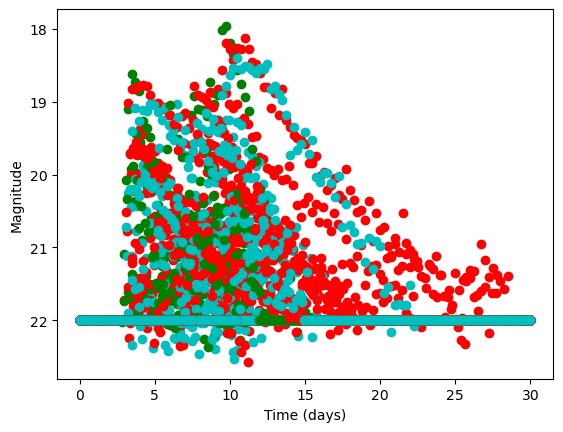

In [31]:
for i in range(0, 50):
    plt.scatter(varied_normflow_dict['varied_normflow_data_0'][i]['t'], varied_normflow_dict['varied_normflow_data_0'][i]['ztfg'], color = 'g')
    plt.scatter(varied_normflow_dict['varied_normflow_data_0'][i]['t'], varied_normflow_dict['varied_normflow_data_0'][i]['ztfr'], color = 'r')
    plt.scatter(varied_normflow_dict['varied_normflow_data_0'][i]['t'], varied_normflow_dict['varied_normflow_data_0'][i]['ztfi'], color = 'c')
plt.gca().invert_yaxis()
plt.xlabel('Time (days)')
plt.ylabel('Magnitude')

In [33]:
# injection files

varied_normflow_inj_dict = {}
inj_path_normflow = '/nobackup/users/mmdesai/normflow_injections/'

for i in range(0, 20):
    varied_normflow_inj_dict['varied_inj_df{}'.format(i)] = pd.DataFrame()
    varied_params = open_json('injection_normflow_varied_{}.json'.format(i), inj_path_normflow)
    varied_normflow_inj_dict['varied_inj_df{}'.format(i)]['mej'] = varied_params['injections']['content']['log10_mej']
    varied_normflow_inj_dict['varied_inj_df{}'.format(i)]['vej'] = varied_params['injections']['content']['log10_vej']
    varied_normflow_inj_dict['varied_inj_df{}'.format(i)]['xlan'] = varied_params['injections']['content']['log10_Xlan']
    varied_normflow_inj_dict['varied_inj_df{}'.format(i)]['shift'] = varied_params['injections']['content']['timeshift']
    varied_normflow_inj_dict['varied_inj_df{}'.format(i)]['distance'] = varied_params['injections']['content']['luminosity_distance']
    varied_normflow_inj_dict['varied_inj_df{}'.format(i)]['sim_id'] = varied_params['injections']['content']['simulation_id']

In [34]:
varied_normflow_inj_dict['varied_inj_df0']

,mej,vej,xlan,shift,distance,sim_id
0,-2.058608,-1.229586,-6.555715,-0.998862,60.205768,0
1,-1.820804,-1.134319,-8.248498,0.461477,174.959713,1
2,-1.887000,-1.141469,-5.826400,1.153208,194.688662,2
3,-1.772774,-1.122784,-8.204261,2.303948,161.583951,3
4,-1.620436,-1.144738,-5.879885,1.745246,172.103259,4
...,...,...,...,...,...,...
24995,-1.770839,-1.136438,-6.131920,3.769265,135.603503,24995
24996,-1.625056,-1.204240,-5.312524,1.551985,99.535654,24996
24997,-2.332450,-1.144833,-5.960271,2.921980,162.975581,24997
24998,-1.581504,-1.100713,-7.770452,1.859998,102.053249,24998


In [35]:
# concatenate dataframe lists

all_varied_data_list_flow = [0] * 20

for i in range(0, 20):
    all_varied_data_list_flow[i] = pd.concat(varied_normflow_dict['varied_normflow_data_{}'.format(i)])

In [39]:
# merge with injection parameters

all_varied_datawparams_list_flow = [0] * 20

for i in range(0, 20):
    all_varied_datawparams_list_flow[i] = all_varied_data_list_flow[i].merge(varied_normflow_inj_dict['varied_inj_df{}'.format(i)], on = 'sim_id')
    # save as csv file
    all_varied_datawparams_list_flow[i].to_csv('/nobackup/users/mmdesai/new_csv/flow_varied_{}.csv'.format(i), index = False)

In [40]:
all_varied_datawparams_list_flow[0]

,t,ztfg,ztfr,ztfi,sim_id,num_detections,mej,vej,xlan,shift,distance
0,0.000000,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,-0.998862,60.205768
1,0.250000,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,-0.998862,60.205768
2,0.500000,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,-0.998862,60.205768
3,0.750000,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,-0.998862,60.205768
4,1.000853,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,-0.998862,60.205768
...,...,...,...,...,...,...,...,...,...,...,...
2971634,29.000000,22.0,22.0,22.0,24558,68,-1.943385,-1.167420,-5.110251,2.741551,75.241478
2971635,29.250000,22.0,22.0,22.0,24558,68,-1.943385,-1.167420,-5.110251,2.741551,75.241478
2971636,29.500000,22.0,22.0,22.0,24558,68,-1.943385,-1.167420,-5.110251,2.741551,75.241478
2971637,29.750000,22.0,22.0,22.0,24558,68,-1.943385,-1.167420,-5.110251,2.741551,75.241478


# Load in the Data

### Fixed

In [30]:
data_dir_flow = '/nobackup/users/mmdesai/new_csv/'

In [27]:
def load_in_normflow_data(data_dir, name, csv_no, num_points=num_points):
    data_list = []
    for i in range (0, csv_no):
        data_list.append(pd.read_csv(data_dir + '{}_{}.csv'.format(name, i)))
    data_df = pd.concat(data_list)
    num_sims = int(len(data_df)/num_points)
    sim_list = []
    sim_no = 0
    for i in range(0, num_sims):
        for j in range(0, num_points):
            sim_list.append(sim_no)
        sim_no += 1
    data_df['sim_id'] = sim_list
    # num_batches = int((len(data_df)/num_points)/num_repeats)
    # data_df = data_df.iloc[0:(num_batches*num_points*num_repeats), :].copy()
    return data_df

In [28]:
matched_df_flow = matched(data_dir_flow, 'flow_varied', 'flow_fixed', 0, 20) 

In [29]:
matched_df_flow

,t_x,key_1,ztfg_x,ztfr_x,ztfi_x,sim_id,num_detections_x,mej_x,vej_x,xlan_x,...,t_y,ztfg_y,ztfr_y,ztfi_y,num_detections_y,mej_y,vej_y,xlan_y,shift_y,distance_y
0,0.000000,0,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,...,0.00,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
1,0.250000,1,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,...,0.25,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
2,0.500000,2,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,...,0.50,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
3,0.750000,3,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,...,0.75,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
4,1.000853,4,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,...,1.00,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3024995,29.000000,116,22.0,22.0,22.0,24999,19,-2.288394,-1.273320,-5.488872,...,29.00,22.0,22.0,22.0,59,-2.288394,-1.273320,-5.488872,0.0,50.0
3024996,29.250000,117,22.0,22.0,22.0,24999,19,-2.288394,-1.273320,-5.488872,...,29.25,22.0,22.0,22.0,59,-2.288394,-1.273320,-5.488872,0.0,50.0
3024997,29.500000,118,22.0,22.0,22.0,24999,19,-2.288394,-1.273320,-5.488872,...,29.50,22.0,22.0,22.0,59,-2.288394,-1.273320,-5.488872,0.0,50.0
3024998,29.750000,119,22.0,22.0,22.0,24999,19,-2.288394,-1.273320,-5.488872,...,29.75,22.0,22.0,22.0,59,-2.288394,-1.273320,-5.488872,0.0,50.0


In [31]:
detected_df = matched_df_flow.loc[matched_df_flow['num_detections_x'] >= 8]
detected_df

,t_x,key_1,ztfg_x,ztfr_x,ztfi_x,sim_id,num_detections_x,mej_x,vej_x,xlan_x,...,t_y,ztfg_y,ztfr_y,ztfi_y,num_detections_y,mej_y,vej_y,xlan_y,shift_y,distance_y
0,0.000000,0,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,...,0.00,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
1,0.250000,1,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,...,0.25,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
2,0.500000,2,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,...,0.50,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
3,0.750000,3,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,...,0.75,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
4,1.000853,4,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,...,1.00,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3024995,29.000000,116,22.0,22.0,22.0,24999,19,-2.288394,-1.273320,-5.488872,...,29.00,22.0,22.0,22.0,59,-2.288394,-1.273320,-5.488872,0.0,50.0
3024996,29.250000,117,22.0,22.0,22.0,24999,19,-2.288394,-1.273320,-5.488872,...,29.25,22.0,22.0,22.0,59,-2.288394,-1.273320,-5.488872,0.0,50.0
3024997,29.500000,118,22.0,22.0,22.0,24999,19,-2.288394,-1.273320,-5.488872,...,29.50,22.0,22.0,22.0,59,-2.288394,-1.273320,-5.488872,0.0,50.0
3024998,29.750000,119,22.0,22.0,22.0,24999,19,-2.288394,-1.273320,-5.488872,...,29.75,22.0,22.0,22.0,59,-2.288394,-1.273320,-5.488872,0.0,50.0


In [33]:
# varied

var_df = detected_df.iloc[:48224550, :12]
var_df.columns = var_df.columns.str.rstrip('_x')
var_df = var_df.drop(columns=['key_1'])
add_batch_sim_nums_all(var_df)
var_df

,t,ztfg,ztfr,ztfi,sim_id,num_detections,mej,vej,xlan,shift,distance,batch_id
0,0.000000,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,-0.998862,60.205768,0
1,0.250000,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,-0.998862,60.205768,0
2,0.500000,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,-0.998862,60.205768,0
3,0.750000,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,-0.998862,60.205768,0
4,1.000853,22.0,22.0,22.0,0,71,-2.058608,-1.229586,-6.555715,-0.998862,60.205768,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3023906,29.064266,22.0,22.0,22.0,398549,44,-1.585280,-1.226475,-7.334536,5.314549,185.753413,7970
3023907,29.314266,22.0,22.0,22.0,398549,44,-1.585280,-1.226475,-7.334536,5.314549,185.753413,7970
3023908,29.500000,22.0,22.0,22.0,398549,44,-1.585280,-1.226475,-7.334536,5.314549,185.753413,7970
3023909,29.750000,22.0,22.0,22.0,398549,44,-1.585280,-1.226475,-7.334536,5.314549,185.753413,7970


In [34]:
# fixed
fix_df = detected_df.iloc[:48224550, 12:]
fix_df.columns = fix_df.columns.str.rstrip('_y')
add_batch_sim_nums_all(fix_df)
fix_df

,t,ztfg,ztfr,ztfi,num_detections,mej,vej,xlan,shift,distance,batch_id,sim_id
0,0.00,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0,0,0
1,0.25,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0,0,0
2,0.50,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0,0,0
3,0.75,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0,0,0
4,1.00,22.0,22.0,22.0,82,-2.058608,-1.229586,-6.555715,0.0,50.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3023906,29.00,22.0,22.0,22.0,159,-1.585280,-1.226475,-7.334536,0.0,50.0,7970,398549
3023907,29.25,22.0,22.0,22.0,159,-1.585280,-1.226475,-7.334536,0.0,50.0,7970,398549
3023908,29.50,22.0,22.0,22.0,159,-1.585280,-1.226475,-7.334536,0.0,50.0,7970,398549
3023909,29.75,22.0,22.0,22.0,159,-1.585280,-1.226475,-7.334536,0.0,50.0,7970,398549


In [17]:
# load in the csv files

fixed_df = load_in_normflow_data(data_dir_flow, 'flow_fixed', 20)
fixed_df

,t,ztfg,ztfr,ztfi,sim_id,mej,vej,xlan,shift,distance
0,0.00,22.0,22.0,22.0,0,-2.169360,-1.278727,-8.051531,0.0,50.0
1,0.25,22.0,22.0,22.0,0,-2.169360,-1.278727,-8.051531,0.0,50.0
2,0.50,22.0,22.0,22.0,0,-2.169360,-1.278727,-8.051531,0.0,50.0
3,0.75,22.0,22.0,22.0,0,-2.169360,-1.278727,-8.051531,0.0,50.0
4,1.00,22.0,22.0,22.0,0,-2.169360,-1.278727,-8.051531,0.0,50.0
...,...,...,...,...,...,...,...,...,...,...
1209995,29.00,22.0,22.0,22.0,195328,-1.526746,-1.173164,-5.622445,0.0,50.0
1209996,29.25,22.0,22.0,22.0,195328,-1.526746,-1.173164,-5.622445,0.0,50.0
1209997,29.50,22.0,22.0,22.0,195328,-1.526746,-1.173164,-5.622445,0.0,50.0
1209998,29.75,22.0,22.0,22.0,195328,-1.526746,-1.173164,-5.622445,0.0,50.0


### Varied

In [18]:
# load in the csv files

varied_df = load_in_normflow_data(data_dir_flow, 'flow_varied', 20)
varied_df

,t,ztfg,ztfr,ztfi,sim_id,mej,vej,xlan,shift,distance
0,0.00,22.0,22.0,22.0,0,-2.169360,-1.278727,-8.051531,2.781503,51.124244
1,0.25,22.0,22.0,22.0,0,-2.169360,-1.278727,-8.051531,2.781503,51.124244
2,0.50,22.0,22.0,22.0,0,-2.169360,-1.278727,-8.051531,2.781503,51.124244
3,0.75,22.0,22.0,22.0,0,-2.169360,-1.278727,-8.051531,2.781503,51.124244
4,1.00,22.0,22.0,22.0,0,-2.169360,-1.278727,-8.051531,2.781503,51.124244
...,...,...,...,...,...,...,...,...,...,...
1209995,29.00,22.0,22.0,22.0,195328,-1.526746,-1.173164,-5.622445,0.669079,41.808412
1209996,29.25,22.0,22.0,22.0,195328,-1.526746,-1.173164,-5.622445,0.669079,41.808412
1209997,29.50,22.0,22.0,22.0,195328,-1.526746,-1.173164,-5.622445,0.669079,41.808412
1209998,29.75,22.0,22.0,22.0,195328,-1.526746,-1.173164,-5.622445,0.669079,41.808412


# Prep for Flow

In [ ]:
def flow_df_to_tensor(df_varied, df_fixed, num_lc):
    data_shifted_list = []
    data_unshifted_list = []
    param_shifted_list = []
    param_unshifted_list = []
    for idx in tqdm(range(0, num_lc)):

        data_shifted = torch.tensor(df_varied.loc[df_varied['sim_id'] == idx].iloc[:, 1:4].values.reshape(num_points, num_channels), 
                                    dtype=torch.float32).transpose(0, 1)
        data_unshifted = torch.tensor(df_fixed.loc[df_fixed['sim_id'] == idx].iloc[:, 1:4].values.reshape(num_points, num_channels), 
                                      dtype=torch.float32).transpose(0, 1)
        param_shifted = torch.tensor(df_varied.loc[df_varied['sim_id'] == idx].iloc[::num_points, 5:10].values, 
                                     dtype=torch.float32)
        param_unshifted = torch.tensor(df_fixed.loc[df_fixed['sim_id'] == idx].iloc[::num_points, 5:10].values, 
                                       dtype=torch.float32)
        data_shifted_list.append(data_shifted)
        data_unshifted_list.append(data_unshifted)
        param_shifted_list.append(param_shifted)
        param_unshifted_list.append(param_unshifted)

    return data_shifted_list, data_unshifted_list, param_shifted_list, param_unshifted_list

In [43]:
# # moving the data to tensors on gpu

# num_lc_flow = len(var_df['batch_id'].unique())
# data_shifted_flow, data_unshifted_flow, param_shifted_flow, param_unshifted_flow = repeated_df_to_tensor(
#     var_df, fix_df, num_lc_flow)

100%|██████████| 7971/7971 [41:37<00:00,  3.19it/s] 


In [ ]:
# # moving the data to tensors on gpu

# num_lc_flow = len(varied_df['sim_id'].unique())
# data_shifted_flow, data_unshifted_flow, param_shifted_flow, param_unshifted_flow = flow_df_to_tensor(
#     varied_df, fixed_df, num_lc_flow)

 17%|█▋        | 33793/195329 [59:54<4:46:39,  9.39it/s]

In [44]:
# torch.save(data_shifted_flow, '/nobackup/users/mmdesai/flow_tensors/data_shifted_flow.pt')
# torch.save(data_unshifted_flow, '/nobackup/users/mmdesai/flow_tensors/data_unshifted_flow.pt')
# torch.save(param_shifted_flow, '/nobackup/users/mmdesai/flow_tensors/param_shifted_flow.pt')
# torch.save(param_unshifted_flow, '/nobackup/users/mmdesai/flow_tensors/param_unshifted_flow.pt')

In [87]:
data_shifted_flow = torch.load('/nobackup/users/mmdesai/flow_tensors/data_shifted_flow.pt')
data_unshifted_flow = torch.load('/nobackup/users/mmdesai/flow_tensors/data_unshifted_flow.pt')
param_shifted_flow = torch.load('/nobackup/users/mmdesai/flow_tensors/param_shifted_flow.pt')
param_unshifted_flow = torch.load('/nobackup/users/mmdesai/flow_tensors/param_unshifted_flow.pt')

In [88]:
num_lc_flow = len(data_shifted_flow)
print(num_lc_flow)

7971


In [89]:
data_shifted_flow[0].shape, data_unshifted_flow[0].shape, param_shifted_flow[0].shape, param_unshifted_flow[0].shape

(torch.Size([50, 3, 121]),
 torch.Size([50, 3, 121]),
 torch.Size([50, 1, 5]),
 torch.Size([50, 1, 5]))

In [90]:
dataset_normflow = Paper_data(data_shifted_flow, data_unshifted_flow, param_shifted_flow, param_unshifted_flow, num_lc_flow)

# check the dataset shape
blank, t, d, _ = dataset_normflow[4]
blank.shape, t.shape, d.shape, _.shape

(torch.Size([50, 1, 5]),
 torch.Size([50, 1, 5]),
 torch.Size([50, 3, 121]),
 torch.Size([50, 3, 121]))

In [91]:
# split dataset into training, testing, and validation

train_set_size_flow = int(0.8 * num_lc_flow)    
val_set_size_flow = int(0.1 * num_lc_flow)     
test_set_size_flow = num_lc_flow - train_set_size_flow - val_set_size_flow

train_data_flow, val_data_flow, test_data_flow = torch.utils.data.random_split(
    dataset_normflow, [train_set_size_flow, val_set_size_flow, test_set_size_flow])

In [92]:
# load and shuffle the data

train_data_loader_flow = DataLoader(train_data_flow, batch_size=25, shuffle=True)
val_data_loader_flow = DataLoader(val_data_flow, batch_size=25, shuffle=True)
test_data_loader_flow = DataLoader(test_data_flow, batch_size=1, shuffle=False)

# check lengths
len(train_data_loader_flow), len(test_data_loader_flow), len(val_data_loader_flow)

(256, 798, 32)

In [93]:
# check first instance of data

for var_inj, fix_inj, var_data, fix_data in train_data_loader_flow:
    var_inj = var_inj.reshape((-1,)+var_inj.shape[2:])
    fix_inj = fix_inj.reshape((-1,)+fix_inj.shape[2:])
    var_data = var_data.reshape((-1,)+var_data.shape[2:])
    fix_data = fix_data.reshape((-1,)+fix_data.shape[2:])

    break
var_inj.shape, var_data.shape, fix_inj.shape, fix_data.shape

(torch.Size([1250, 1, 5]),
 torch.Size([1250, 3, 121]),
 torch.Size([1250, 1, 5]),
 torch.Size([1250, 3, 121]))

# Partially Freeze the Similarity Embedding

In [94]:
# # make embeddeding net trainable
# for name, param in similarity_embedding.named_parameters():
#     param.requires_grad = True

In [95]:
# make embeddeding net untrainable
for name, param in similarity_embedding.named_parameters():
    param.requires_grad = False

In [96]:
class EmbeddingNet(nn.Module):
    """Wrapper around the similarity embedding defined above"""
    #def __init__(self, *args, **kwargs):
    def __init__(self, similarity_embedding, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.representation_net = similarity_embedding
        self.representation_net.load_state_dict(similarity_embedding.state_dict())
        # self.num_dim = num_dim
        # the expander network is unused and hence don't track gradients
        for name, param in self.representation_net.named_parameters():
            if 'expander_layer' in name or 'layers_h' in name or 'final_layer' in name:
                param.requires_grad = False
        # set freeze status of part of the conv layer of embedding_net
            elif 'layers_f' in name:
                param.requires_grad = True
            else: 
                param.requires_grad = True
        self.context_layer = nn.Sequential(
            nn.Linear(num_dim, 1000),
            nn.ReLU(),
            nn.Linear(1000, num_dim)
            )
    def forward(self, x):
        batch_size, channels, dims = x.shape
        _, rep = self.representation_net(x) # 500, 3, 191 -> 500, 1, 2
        rep = rep.reshape(batch_size, num_dim)

        return self.context_layer(rep)


In [97]:
# class EmbeddingNet(nn.Module):
#     """Wrapper around the similarity embedding defined above"""
#     def __init__(self, *args, **kwargs):
    #     super().__init__(*args, **kwargs)
    #     self.representation_net = similarity_embedding
    #     self.representation_net.load_state_dict(similarity_embedding.state_dict())

    #     # the expander network is unused and hence don't track gradients
    #     for name, param in self.representation_net.named_parameters():
    #         if 'expander_layer' in name or 'layers_h' in name or 'final_layer' in name:
    #             param.requires_grad = False
    #     # set freeze status of part of the conv layer of embedding_net
    #         elif 'layers_f' in name:
    #             param.requires_grad = False
    #         else: 
    #             param.requires_grad = False
                
    #     self.context_layer = nn.Sequential(
    #         nn.Linear(num_dim, 1000),
    #         nn.ReLU(),
    #         nn.Linear(1000, num_dim)
    #     )
    # def forward(self, x):
    #     batch_size, channels, dims = x.shape
    #     _, rep = self.representation_net(x) # 500, 3, 191 -> 500, 1, 2
    #     rep = rep.reshape(batch_size, num_dim)

    #     return self.context_layer(rep)

In [98]:
for var_inj_se, fix_inj_se, var_data_se, fix_data_se in train_data_loader_flow:
    var_inj_se = var_inj_se.reshape((-1,)+var_inj_se.shape[2:]).to(device)
    fix_inj_se = fix_inj_se.reshape((-1,)+fix_inj_se.shape[2:]).to(device)
    var_data_se = var_data_se.reshape((-1,)+var_data_se.shape[2:]).to(device)
    fix_data_se = fix_data_se.reshape((-1,)+fix_data_se.shape[2:]).to(device)
    break

# check shapes
print(var_data_se.shape)
_, rep = similarity_embedding(var_data_se)  # _.shape = batch_size x 1 x 10, # rep.shape = batch_size x 1 x 2
print(_.shape, rep.shape)
context_features = rep.shape[-1]
print('number of context_features: ', context_features)
print('number of dimensions: ', num_dim)

torch.Size([1250, 3, 121])
torch.Size([1250, 2]) torch.Size([1250, 7])
number of context_features:  7
number of dimensions:  7


In [99]:
# for var_inj_se, fix_inj_se, var_data_se, fix_data_se in train_data_loader_flow:
#     # var_inj_se = var_inj_se.reshape((-1,)+var_inj_se.shape[2:]).to(device)
#     # fix_inj_se = fix_inj_se.reshape((-1,)+fix_inj_se.shape[2:]).to(device)
#     # var_data_se = var_data_se.reshape((-1,)+var_data_se.shape[2:]).to(device)
#     # fix_data_se = fix_data_se.reshape((-1,)+fix_data_se.shape[2:]).to(device)
#     break

# # check shapes
# print(var_data_se.shape)
# _, rep = similarity_embedding(var_data_se)  # _.shape = batch_size x 1 x 10, # rep.shape = batch_size x 1 x 2
# print(_.shape, rep.shape)
# context_features = rep.shape[-1]
# print('number of context_features: ', context_features)
# print('number of dimensions: ', num_dim)

In [100]:
# num_transforms = 8
# num_blocks = 4
# hidden_features = 50

# base_dist = StandardNormal([3])

# transforms = []
# for _ in range(num_transforms):
#     block = [
#         MaskedAffineAutoregressiveTransform(
#             features=3,  # 3-dim posterior
#             hidden_features=hidden_features,
#             context_features=context_features,  # 2
#             num_blocks=num_blocks,
#             activation=torch.tanh,
#             use_batch_norm=False,
#             use_residual_blocks=True,
#             dropout_probability=0.01,
# #             integrand_net_layers=[20, 20]
#         ),
#         RandomPermutation(features=2)
#     ]
#     transforms += block

# transform = CompositeTransform(transforms)

# embedding_net = EmbeddingNet(num_dim, similarity_embedding)

# flow = Flow(transform, base_dist, embedding_net).to(device=device)

In [101]:
def normflow_params(similarity_embedding, num_transforms, num_blocks, hidden_features, context_features, num_dim):
    base_dist = StandardNormal([3])
    transforms = []
    features = 3
    for _ in range(num_transforms):
        block = [MaskedAffineAutoregressiveTransform(
                features=3,  
                hidden_features=hidden_features,  # 80
                context_features=context_features,  # 5
                num_blocks=num_blocks,   # 5
                activation=torch.tanh,
                use_batch_norm=False,
                use_residual_blocks=True,
                dropout_probability=0.01,
    #             integrand_net_layers=[20, 20]
            ),
            RandomPermutation(features=features)
        ]
        transforms += block
    transform = CompositeTransform(transforms)
    embedding_net = EmbeddingNet(similarity_embedding)
    return transform, base_dist, embedding_net

In [102]:
# define parameters
# 8, 'num_blocks': 5, 'hidden_features': 80, 'lr': 0.0004401575254187637, 'batch_size': 100

transform, base_dist, embedding_net = normflow_params(similarity_embedding, 7, 4, 70, context_features=context_features, num_dim=num_dim) 

In [103]:
flow = Flow(transform, base_dist, embedding_net).to(device=device)

In [104]:
# num_transforms = 4
# num_blocks = 4
# hidden_features = 70

# base_dist = StandardNormal([3])

# transforms = []
# for _ in range(num_transforms):
#     block = [
#         MaskedAffineAutoregressiveTransform(
#             features=3,  # 2-dim posterior
#             hidden_features=hidden_features,
#             context_features=context_features,  # 2
#             num_blocks=num_blocks,
#             activation=torch.tanh,
#             use_batch_norm=False,
#             use_residual_blocks=True,
#             dropout_probability=0.01,
# #             integrand_net_layers=[20, 20]
#         ),
#         RandomPermutation(features=3)
#     ]
#     transforms += block

# transform = CompositeTransform(transforms)

# embedding_net = EmbeddingNet(num_dim, similarity_embedding)

# flow = Flow(transform, base_dist, embedding_net).to(device=device)

In [105]:
print('Total number of trainable parameters: ', sum(p.numel() for p in flow.parameters() if p.requires_grad))

Total number of trainable parameters:  712298


In [106]:
# for name, param in flow._embedding_net.named_parameters():
#     print(name, param.requires_grad)

In [107]:
# # baseline
# num_channels = 3
# nnum_transforms = 3
# num_blocks = 3
# hidden_features = 50

# context_features = num_points

# base_dist = StandardNormal([2])

# transforms = []
# for _ in range(num_transforms):
#     block = [
#         MaskedAffineAutoregressiveTransform(
#             features=2,  # 2-dim posterior
#             hidden_features=hidden_features,
#             context_features=context_features,
#             num_blocks=num_blocks,
#             activation=torch.tanh,
#             use_batch_norm=False,
#             use_residual_blocks=True,
#             dropout_probability=0.01,
#         ),
#         RandomPermutation(features=2)
#     ]
#     transforms += block

# transform = CompositeTransform(transforms)

# flow = Flow(transform, base_dist).to(device)

In [108]:
for idx, val in enumerate(train_data_loader_flow, 1):
    augmented_shift, unshifted_shift, augmented_data, unshifted_data = val
    augmented_shift = augmented_shift[...,0:3].to(device)
    augmented_shift = augmented_shift.flatten(0, 2).to(device)
    augmented_data = augmented_data.reshape(-1, 3, num_points).to(device)
    print(augmented_shift.shape, augmented_data.shape)
    break

torch.Size([1250, 3]) torch.Size([1250, 3, 121])


In [109]:
# for idx, val in enumerate(train_data_loader_flow, 1):
#     augmented_shift, unshifted_shift, augmented_data, unshifted_data = val
#     augmented_shift = augmented_shift[...,0:3].to(device)
#     augmented_shift = augmented_shift.flatten(0, 1).to(device)
#     augmented_data = augmented_data.reshape(-1, 3, num_points).to(device)
#     print(augmented_shift.shape, augmented_data.shape)
#     break

In [110]:
similarity_embedding(augmented_data)[0].shape, similarity_embedding(augmented_data)[1].shape

(torch.Size([1250, 2]), torch.Size([1250, 7]))

In [111]:
flow_loss = -flow.log_prob(augmented_shift, context=augmented_data).mean()
flow_loss

tensor(10.5522, device='cuda:0', grad_fn=<NegBackward0>)

# Train and Validate

In [112]:
def train_one_epoch(epoch_index, tb_writer, data_loader, flow, optimizer, flatten_dim):
    running_loss = 0.
    last_loss = 0.
    for idx, val in enumerate(data_loader, 1):
        augmented_shift, unshifted_shift, augmented_data, unshifted_data = val
        augmented_shift = augmented_shift[...,0:3].to(device)
        augmented_shift = augmented_shift.flatten(0, flatten_dim).to(device)
        augmented_data = augmented_data.reshape(-1, 3, num_points).to(device)
        loss = 0
        flow_loss = -flow.log_prob(augmented_shift, context=augmented_data).mean()
        optimizer.zero_grad()
        flow_loss.backward()
        optimizer.step()
        loss += flow_loss.item()
        running_loss += loss
        n = 10
        if idx % n == 0:
            last_loss = running_loss / n
            print(' Avg. train loss/batch after {} batches = {:.4f}'.format(idx, last_loss))
            tb_x = epoch_index * len(data_loader) + idx
            tb_writer.add_scalar('Flow Loss/train', last_loss, tb_x)
            tb_writer.flush()
            running_loss = 0.
    return last_loss

In [113]:
def val_one_epoch(epoch_index, tb_writer, data_loader, flow, flatten_dim):
    running_loss = 0.
    last_loss = 0.
    for idx, val in enumerate(data_loader, 1):
        augmented_shift, unshifted_shift, augmented_data, unshifted_data = val
        augmented_shift = augmented_shift[...,0:3].to(device)
        augmented_shift = augmented_shift.flatten(0, flatten_dim).to(device)
        augmented_data = augmented_data.reshape(-1, 3, num_points).to(device)
        loss = 0
        flow_loss = -flow.log_prob(augmented_shift, context=augmented_data).mean()
        loss += flow_loss.item()
        running_loss += loss
        n = 1
        if idx % n == 0:
            last_loss = running_loss / n
            print(' Avg. train loss/batch after {} batches = {:.4f}'.format(idx, last_loss))
            tb_x = epoch_index * len(data_loader) + idx + 1
            tb_writer.add_scalar('Flow Loss/val', last_loss, tb_x)
            tb_writer.flush()
            running_loss = 0.
    tb_writer.flush()
    return last_loss

In [114]:
# optimizer
optimizer = optim.SGD(flow.parameters(), lr=0.0001, momentum=0.5)
# scheduler
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=2, factor=0.5, threshold=0.001)

In [115]:
writer = SummaryWriter()

In [116]:
%%time
# UNCOMMENT AND RUN TO TRAIN FROM SCRATCH

train_loss_list = []
val_loss_list = []

EPOCHS = 100
epoch_number = 0
for epoch in range(EPOCHS):
    print('EPOCH {}:'.format(epoch_number + 1))
    flow.train(True)
    for name, param in flow._embedding_net.named_parameters():
        param.requires_grad = True
    avg_train_loss = train_one_epoch(epoch_number, writer, train_data_loader_flow, flow, optimizer, 2)
    train_loss_list.append(avg_train_loss)
    flow.train(False)
    avg_val_loss = val_one_epoch(epoch_number, writer, val_data_loader_flow, flow, 2)
    val_loss_list.append(avg_val_loss)
    print(f"Train/Val flow Loss after epoch: {avg_train_loss:.4f}/{avg_val_loss:.4f}")
    epoch_number += 1
    scheduler.step(avg_val_loss)
    for param_group in optimizer.param_groups:
        print("Current LR = {:.3e}".format(param_group['lr']))

EPOCH 1:
 Avg. train loss/batch after 10 batches = 9.9415
 Avg. train loss/batch after 20 batches = 8.4368
 Avg. train loss/batch after 30 batches = 7.1534
 Avg. train loss/batch after 40 batches = 5.9625
 Avg. train loss/batch after 50 batches = 4.8391
 Avg. train loss/batch after 60 batches = 3.9078
 Avg. train loss/batch after 70 batches = 6.0089
 Avg. train loss/batch after 80 batches = 4.4588
 Avg. train loss/batch after 90 batches = 3.3021
 Avg. train loss/batch after 100 batches = 2.8376
 Avg. train loss/batch after 110 batches = 6.7999
 Avg. train loss/batch after 120 batches = 4.5154
 Avg. train loss/batch after 130 batches = 3.4393
 Avg. train loss/batch after 140 batches = 2.4400
 Avg. train loss/batch after 150 batches = 2.1965
 Avg. train loss/batch after 160 batches = 2.0002
 Avg. train loss/batch after 170 batches = 2.3154
 Avg. train loss/batch after 180 batches = 1.5616
 Avg. train loss/batch after 190 batches = 2.0693
 Avg. train loss/batch after 200 batches = 1.2311


In [61]:
# # save normalizing flow weights

# PATH_nflow = './partially-frozen-similarity-embedding-flow-weights.pth'
# torch.save(flow.state_dict(), PATH_nflow)

In [84]:
# PATH_nflow = './Ka2017-light-curves-with-frozen-similarity-embedding-flow-weights.pth'
# flow.load_state_dict(torch.load(PATH_nflow, map_location=device))
# flow.eval()

In [53]:
# PATH_nflow2 = './unfrozen-similarity-embedding-flow-weights.pth'
# torch.save(flow.state_dict(), PATH_nflow2)

In [67]:
# PATH_nflow2 = './unfrozen-similarity-embedding-flow-weights.pth'
# flow.load_state_dict(torch.load(PATH_nflow2, map_location=device))
# flow.eval()

Flow(
  (_transform): CompositeTransform(
    (_transforms): ModuleList(
      (0): MaskedAffineAutoregressiveTransform(
        (autoregressive_net): MADE(
          (initial_layer): MaskedLinear(in_features=3, out_features=70, bias=True)
          (context_layer): Linear(in_features=7, out_features=70, bias=True)
          (blocks): ModuleList(
            (0-3): 4 x MaskedResidualBlock(
              (context_layer): Linear(in_features=7, out_features=70, bias=True)
              (linear_layers): ModuleList(
                (0-1): 2 x MaskedLinear(in_features=70, out_features=70, bias=True)
              )
              (dropout): Dropout(p=0.01, inplace=False)
            )
          )
          (final_layer): MaskedLinear(in_features=70, out_features=6, bias=True)
        )
      )
      (1): RandomPermutation()
      (2): MaskedAffineAutoregressiveTransform(
        (autoregressive_net): MADE(
          (initial_layer): MaskedLinear(in_features=3, out_features=70, bias=True)
    

In [52]:
# # save normalizing flow weights

# PATH2 = './Ka2017-light-curves-diffsimilarity-embedding-flow-weights.pth'
# torch.save(flow.state_dict(), PATH2)

In [203]:
# PATH2 = './Ka2017-light-curves-diffsimilarity-embedding-flow-weights.pth'
# flow.load_state_dict(torch.load(PATH2, map_location=device))
# flow.eval()

Flow(
  (_transform): CompositeTransform(
    (_transforms): ModuleList(
      (0): MaskedAffineAutoregressiveTransform(
        (autoregressive_net): MADE(
          (initial_layer): MaskedLinear(in_features=3, out_features=80, bias=True)
          (context_layer): Linear(in_features=3, out_features=80, bias=True)
          (blocks): ModuleList(
            (0-4): 5 x MaskedResidualBlock(
              (context_layer): Linear(in_features=3, out_features=80, bias=True)
              (linear_layers): ModuleList(
                (0-1): 2 x MaskedLinear(in_features=80, out_features=80, bias=True)
              )
              (dropout): Dropout(p=0.01, inplace=False)
            )
          )
          (final_layer): MaskedLinear(in_features=80, out_features=6, bias=True)
        )
      )
      (1): RandomPermutation()
      (2): MaskedAffineAutoregressiveTransform(
        (autoregressive_net): MADE(
          (initial_layer): MaskedLinear(in_features=3, out_features=80, bias=True)
    

In [45]:
# # save normalizing flow weights

# PATH3 = './Ka2017-light-curves-with-partially-frozen-similarity-embedding-flow-weights.pth'
# torch.save(flow.state_dict(), PATH3)

In [46]:
# # save normalizing flow weights

# PATH4 = './Ka2017-light-curves-with-no-similarity-embedding-flow-weights.pth'
# torch.save(flow.state_dict(), PATH4)

In [117]:
# save the experimental train/val loss for untrained network 

# untrainedtrainloss_file = open("untrained_train_loss.txt", "w")
# untrainedtrainloss_file.writelines(str(train_loss_list))
# print("user data successfully saved to file")
# untrainedtrainloss_file.close()

# untrainedvalloss_file = open("untrained_val_loss.txt", "w")
# untrainedvalloss_file.writelines(str(val_loss_list))
# print("user data successfully saved to file")
# untrainedvalloss_file.close()

with open("untrained_train_loss.txt") as f:
    untrained_train_loss_list = eval(f.read())

with open("untrained_val_loss.txt") as f:
    untrained_val_loss_list = eval(f.read())

In [118]:
# save the experimental train/val loss for frozen network 

# frozentrainloss_file = open("frozen_train_loss.txt", "w")
# frozentrainloss_file.writelines(str(train_loss_list))
# print("user data successfully saved to file")
# frozentrainloss_file.close()

# frozenvalloss_file = open("frozen_val_loss.txt", "w")
# frozenvalloss_file.writelines(str(val_loss_list))
# print("user data successfully saved to file")
# frozenvalloss_file.close()

with open("frozen_train_loss.txt") as f:
    frozen_train_loss_list = eval(f.read())

with open("frozen_val_loss.txt") as f:
    frozen_val_loss_list = eval(f.read())


In [119]:
# save the train/val loss for similarity embedding (completely unfrozen)

# unfrozentrainloss_file = open("unfrozen_train_loss.txt", "w")
# unfrozentrainloss_file.writelines(str(train_loss_list))
# print("user data successfully saved to file")
# unfrozentrainloss_file.close()

# unfrozenvalloss_file = open("unfrozen_val_loss.txt", "w")
# unfrozenvalloss_file.writelines(str(val_loss_list))
# print("user data successfully saved to file")
# unfrozenvalloss_file.close()

with open("unfrozen_train_loss.txt") as f:
    unfrozen_train_loss_list = eval(f.read())

with open("unfrozen_val_loss.txt") as f:
    unfrozen_val_loss_list = eval(f.read())


In [120]:
# save the train/val loss for partial similarity embedding -- CORRECT, KEEP AS PARTIALLY FROZEN

# partiallyfrozentrainloss_file = open("partially_frozen_train_loss.txt", "w")
# partiallyfrozentrainloss_file.writelines(str(train_loss_list))
# print("user data successfully saved to file")
# partiallyfrozentrainloss_file.close()

# partiallyfrozenvalloss_file = open("partially_frozen_val_loss.txt", "w")
# partiallyfrozenvalloss_file.writelines(str(val_loss_list))
# print("user data successfully saved to file")
# partiallyfrozenvalloss_file.close()

with open("partially_frozen_train_loss.txt") as f:
    partially_frozen_train_loss_list = eval(f.read())

with open("partially_frozen_val_loss.txt") as f:
    partially_frozen_val_loss_list = eval(f.read())


In [121]:
# save the train/val loss for retraining similarity embedding -- OUTDATED, NEED NEW

# basetrainloss_file = open("base_vej3_train.txt", "w")
# basetrainloss_file.writelines(str(train_loss_list))
# print("user data successfully saved to file")
# basetrainloss_file.close()

# basevalloss_file = open("base_vej3_val.txt", "w")
# basevalloss_file.writelines(str(val_loss_list))
# print("user data successfully saved to file")
# basevalloss_file.close()

# with open("base_vej3_train.txt") as f:
#     base_train_loss_list = eval(f.read())

# with open("base_vej3_val.txt") as f:
#     base_val_loss_list = eval(f.read())

In [122]:
# save the train/val loss for the frozen similarity embedding -- CORRECT, PRESERVE AS FROZEN

# currenttrainloss_file = open("current_train_loss.txt", "w")
# currenttrainloss_file.writelines(str(train_loss_list))
# print("user data successfully saved to file")
# currenttrainloss_file.close()

# currentvalloss_file = open("current_val_loss.txt", "w")
# currentvalloss_file.writelines(str(val_loss_list))
# print("user data successfully saved to file")
# currentvalloss_file.close()

# with open("current_train_loss.txt") as f:
#     frozen_train_loss_list = eval(f.read())

# with open("current_val_loss.txt") as f:
#     frozen_val_loss_list = eval(f.read())

(-2.0, 2.0)

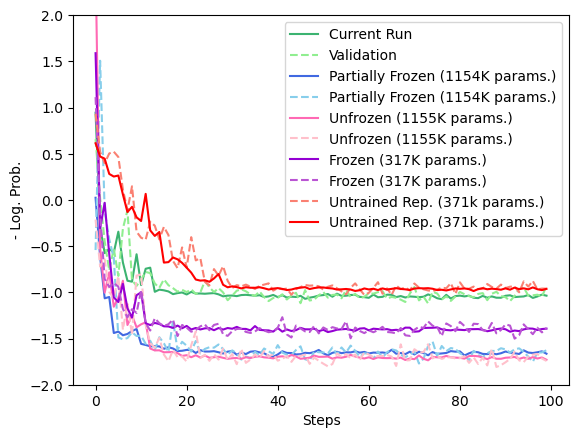

In [123]:
# plot the comparision of the train/val loss for the three scenarios

epoch_list = range(0,100)


plt.plot(epoch_list[:len(train_loss_list)], train_loss_list[:len(train_loss_list)], label = 'Current Run', color = 'mediumseagreen')
plt.plot(epoch_list[:len(val_loss_list)], val_loss_list[:len(val_loss_list)], label = 'Validation', color = 'lightgreen', linestyle = 'dashed')
plt.plot(epoch_list, partially_frozen_train_loss_list[:100], label = 'Partially Frozen (1154K params.)', color = 'royalblue', alpha=1)
plt.plot(epoch_list, partially_frozen_val_loss_list[:100], label = 'Partially Frozen (1154K params.)', color = 'skyblue', alpha=1, linestyle='dashed')
plt.plot(epoch_list, unfrozen_train_loss_list[:100], label = 'Unfrozen (1155K params.)', color = 'hotpink', alpha=1)
plt.plot(epoch_list, unfrozen_val_loss_list[:100], label = 'Unfrozen (1155K params.)', color = 'pink', alpha=1, linestyle='dashed')
plt.plot(epoch_list, frozen_train_loss_list[:100], label = 'Frozen (317K params.)', color = 'darkviolet', alpha=1)
plt.plot(epoch_list, frozen_val_loss_list[:100], label = 'Frozen (317K params.)', color = 'mediumorchid', alpha=1, linestyle='dashed')
plt.plot(epoch_list, untrained_val_loss_list[:100], label='Untrained Rep. (371k params.)', color='salmon', alpha=1, linestyle="dashed")
plt.plot(epoch_list, untrained_train_loss_list[:100], label = 'Untrained Rep. (371k params.)', color = 'r', alpha=1)
plt.ylabel('- Log. Prob.')
plt.xlabel('Steps')
plt.legend()
plt.ylim(-2, 2)

## Fixed Test Light Curves

In [196]:
# get the test data

sim_path_test_fix = '/nobackup/users/mmdesai/test_lc_fixed'
num_sims_test = 300

test_simembed_dict_fix = {}
simembed_num_lc_list_fix = [num_sims_test] * 12

for i in range (0, 12):
    file_names_fix = get_test_names(sim_path_test_fix, 'test', str(i+1) + '_fixed', simembed_num_lc_list_fix[i])
    test_simembed_dict_fix['test_simembed_data_{}'.format(i)] = json_to_df(file_names_fix, simembed_num_lc_list_fix[i])
    # identify which dataframes have a large number of detections
    # test_nonzero_list_fix = []
    # for df in tqdm(range(len(test_simembed_dict_fix['test_simembed_data_{}'.format(i)]))):    
    #     single_df = test_simembed_dict_fix['test_simembed_data_{}'.format(i)][df]
    #     detections = single_df.iloc[0, 4]
    #     if detections > 15:
    #         single_df = single_df.drop(columns = {'num_detections'})
    #         test_nonzero_list_fix.append(single_df)
    # test_simembed_dict_fix['test_simembed_data_{}'.format(i)] = test_nonzero_list_fix
    # pad the data
    test_simembed_dict_fix['test_simembed_data_{}'.format(i)] = pad_all_dfs(test_simembed_dict_fix['test_simembed_data_{}'.format(i)])


 37%|███▋      | 110/300 [00:00<00:00, 224.43it/s]


KeyboardInterrupt: 

In [81]:
# injection files

inj_path_simembed = '/nobackup/users/mmdesai/test_lc_injections'
test_injections_fix = {}

for i in range(0, 12):
    test_inj_df = pd.DataFrame()
    test_params = open_json('/injection_{}.json'.format(str(i+1) + 'fixed'), inj_path_simembed)
    test_inj_df['mej'] = test_params['injections']['content']['log10_mej']
    test_inj_df['vej'] = test_params['injections']['content']['log10_vej']
    test_inj_df['xlan'] = test_params['injections']['content']['log10_Xlan']
    test_inj_df['shift'] = test_params['injections']['content']['timeshift']
    test_inj_df['distance'] = test_params['injections']['content']['luminosity_distance']
    test_inj_df['sim_id'] = test_params['injections']['content']['simulation_id']
    test_injections_fix['test_inj_df{}'.format(i)] = test_inj_df


In [82]:
test_injections_fix['test_inj_df0']

,mej,vej,xlan,shift,distance,sim_id
0,-1.75,-1.0925,-9.0,0.0,50.0,0
1,-1.75,-1.0925,-9.0,0.0,50.0,1
2,-1.75,-1.0925,-9.0,0.0,50.0,2
3,-1.75,-1.0925,-9.0,0.0,50.0,3
4,-1.75,-1.0925,-9.0,0.0,50.0,4
...,...,...,...,...,...,...
295,-1.75,-1.0925,-9.0,0.0,50.0,295
296,-1.75,-1.0925,-9.0,0.0,50.0,296
297,-1.75,-1.0925,-9.0,0.0,50.0,297
298,-1.75,-1.0925,-9.0,0.0,50.0,298


In [83]:
# concatenate dataframe lists

all_test_data_list_fixed = [0] * 12

for i in range(0, 12):
    all_test_data_list_fixed[i] = pd.concat(test_simembed_dict_fix['test_simembed_data_{}'.format(i)])

In [85]:
# merge with injection parameters

all_test_datawparams_list_fixed = [0] * 12

for i in range(0, 12):
    all_test_datawparams_list_fixed[i] = all_test_data_list_fixed[i].merge(test_injections_fix['test_inj_df{}'.format(i)], on = 'sim_id')
    all_test_datawparams_list_fixed[i].to_csv('test_fixed_{}.csv'.format(i), index = False)

# Load in Fixed LC

In [124]:
# load in the csv files
test_dir = '/home/mmdesai/'
test_df_fixed = load_in_data(test_dir, 'test_fixed', 12, num_repeats=300)
test_df_fixed

,t,ztfg,ztfr,ztfi,sim_id,num_detections,mej,vej,xlan,shift,distance,batch_id
0,0.00,22.0,22.0,22.0,0,128,-1.75,-1.0925,-9.0,0.0,50.0,0
1,0.25,22.0,22.0,22.0,0,128,-1.75,-1.0925,-9.0,0.0,50.0,0
2,0.50,22.0,22.0,22.0,0,128,-1.75,-1.0925,-9.0,0.0,50.0,0
3,0.75,22.0,22.0,22.0,0,128,-1.75,-1.0925,-9.0,0.0,50.0,0
4,1.00,22.0,22.0,22.0,0,128,-1.75,-1.0925,-9.0,0.0,50.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
36295,29.00,22.0,22.0,22.0,3599,64,-2.25,-1.2175,-6.0,0.0,50.0,11
36296,29.25,22.0,22.0,22.0,3599,64,-2.25,-1.2175,-6.0,0.0,50.0,11
36297,29.50,22.0,22.0,22.0,3599,64,-2.25,-1.2175,-6.0,0.0,50.0,11
36298,29.75,22.0,22.0,22.0,3599,64,-2.25,-1.2175,-6.0,0.0,50.0,11


In [125]:
# moving the data to tensors on gpu

num_batches_test_fixed = len(test_df_fixed['batch_id'].unique())
data_unshifted_test, param_unshifted_test = test_df_to_tensor(test_df_fixed, num_batches_test_fixed, 300)

100%|██████████| 12/12 [00:00<00:00, 14.78it/s]


In [126]:
class Test_Fixed_data(Dataset):
    def __len__(self):
        return (num_batches_test_fixed)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        # gr_color = data_shifted_test[idx][:, 0, :] - data_shifted_test[idx][:, 1, :]
        # gi_color = data_shifted_test[idx][:, 0, :] - data_shifted_test[idx][:, 2, :]
        # ri_color = data_shifted_test[idx][:, 1, :] - data_shifted_test[idx][:, 2, :]

        # color_shifted_test = torch.stack((gr_color, gi_color, ri_color), dim = 1)
        
        return (
            param_unshifted_test[idx].to(device),
            data_unshifted_test[idx].to(device)
            # color_shifted_test.to(device)
        )

In [127]:
# define dataset

test_fixed_dataset = Test_Fixed_data()

t, d = test_fixed_dataset[0]
print(t.shape, d.shape)

torch.Size([300, 1, 5]) torch.Size([300, 3, 121])


In [128]:
len(test_fixed_dataset)

12

# Posteriors

In [129]:
def cast_as_bilby_result(samples, truth):
    injections = dict.fromkeys({'log10_mej', 'log10_vej', 'log10_Xlan'})
    injections['log10_mej'] = float(truth.numpy()[0])
    injections['log10_vej'] = float(truth.numpy()[1])
    injections['log10_Xlan'] = float(truth.numpy()[2])

    posterior = dict.fromkeys({'mej', 'vej'})
    samples_numpy = samples.numpy()
    posterior['log10_mej'] = samples_numpy.T[0].flatten()
    posterior['log10_vej'] = samples_numpy.T[1].flatten()
    posterior['log10_Xlan'] = samples_numpy.T[2].flatten()
    posterior = pd.DataFrame(posterior)
    
    return bilby.result.Result(
        label="test_data",
        injection_parameters=injections,
        posterior=posterior,
        search_parameter_keys=list(injections.keys()),
        priors=priors
    )

In [130]:
def live_plot_samples(samples, truth):
    print(truth)
    clear_output(wait=True)
    sleep(0.5)
    figure = corner.corner(
        samples.numpy(), quantiles=[0.16, 0.5, 0.84],
        show_titles=True,
        labels=["Mass of Ejecta", "Vel. of Ejecta", "Lan. Fraction"],
        truth=truth,
    )
    corner.overplot_lines(figure, truth, color="C1")
    corner.overplot_points(figure, truth[None], marker="s", color="C1")

In [131]:
for idx, (_, shift_test, data_test, data_orig) in enumerate(test_data_loader_flow):
    _ = _.reshape((-1,)+_.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_orig = data_orig.reshape((-1,)+data_orig.shape[2:])
    print(_.shape, shift_test.shape, data_test.shape, data_orig.shape)
    break

torch.Size([50, 1, 5]) torch.Size([50, 1, 5]) torch.Size([50, 3, 121]) torch.Size([50, 3, 121])


In [132]:
print(shift_test[5])

tensor([[-1.7399, -1.0954, -7.3094,  0.0000, 50.0000]], device='cuda:0')


In [133]:
for idx, (_, shift_test, data_test, data_orig) in enumerate(test_data_loader_flow):
    print(_.shape, shift_test.shape, data_test.shape, data_orig.shape)
    break

torch.Size([1, 50, 1, 5]) torch.Size([1, 50, 1, 5]) torch.Size([1, 50, 3, 121]) torch.Size([1, 50, 3, 121])


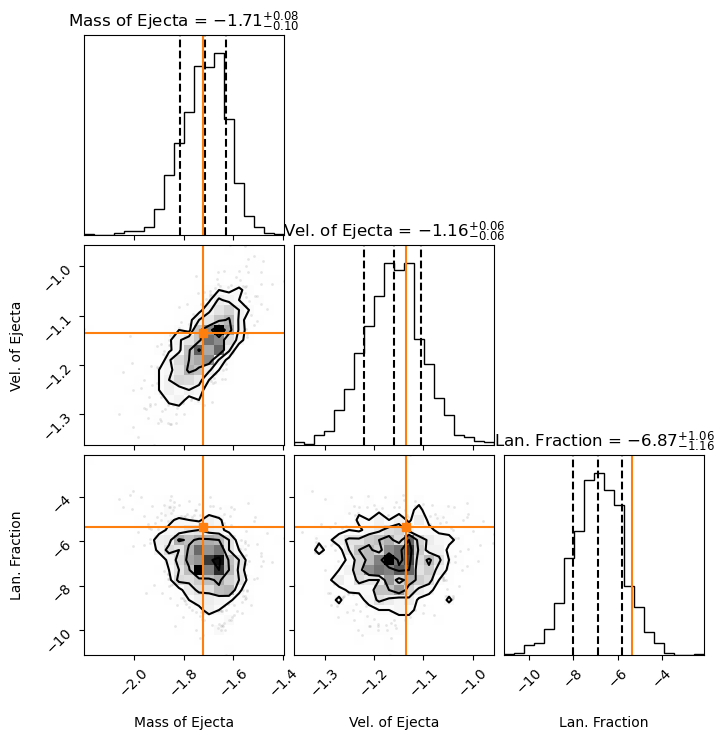

In [134]:
for idx, (_, shift_test, data_test, data_orig) in enumerate(test_data_loader_flow):
    _ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_orig = data_orig.reshape((-1,)+data_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    # if idx % 100 !=0: continue 
    if idx != 500: continue
    with torch.no_grad():
        samples = flow.sample(1000, context=data_test[0].reshape((1, 3, num_points)))
    live_plot_samples(samples.cpu().reshape(1000,3), shift_test[0][0].cpu()[...,0:3])
    plt.show()

### Bilby Likelihood

In [135]:
# # check a dynesty inference

# dynesty_dir = '/nobackup/users/mmdesai/widerprior_dynesty'

# bilby_result0 = bilby.result.read_in_result(filename= dynesty_dir + '/test6_0_result.json')
# bilby_result0.injection_parameters =  dict(log10_mej=-1.75, log10_vej=-1.0925, log10_Xlan=-9)
# injection_parameters0 = bilby_result0.injection_parameters.copy()
# bilby_result0.plot_corner(parameters = ['log10_mej', 'log10_vej', 'log10_Xlan'], outdir = dynesty_dir,
#                           range = [(-2.5, -1.5), (-1.3, -0.99), (-11, -5)])

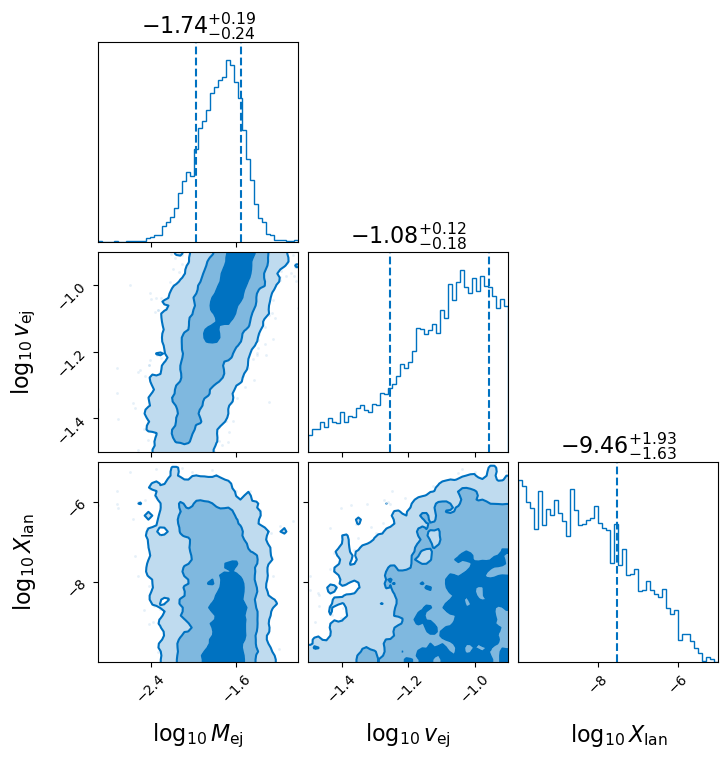

In [136]:
# check a bilby inference

multinest_dir = '/nobackup/users/mmdesai/test_lc_multinest'
bilby_result0 = bilby.result.read_in_result(filename= multinest_dir + '/test1a_result.json')
bilby_result0.injection_parameters =  dict(log10_mej=-1.75, log10_vej=-1.0925, log10_Xlan=-9)
injection_parameters0 = bilby_result0.injection_parameters.copy()
bilby_result0.plot_corner(parameters = ['log10_mej', 'log10_vej', 'log10_Xlan'], outdir = multinest_dir,
                          range = [1, 1, (-10, -5)])

## Get Test Data

In [137]:
# get the varied test light curves

var_test_dict = {}
for i in range (0, len(test_dataset)):
    var_test_dict['var_param{}'.format(i)], var_test_dict['var_data{}'.format(i)] = test_dataset[i]

In [138]:
# get the fixed test light curves

fix_test_dict = {}
for i in range (0, 12):
    fix_test_dict['fix_param{}'.format(i)], fix_test_dict['fix_data{}'.format(i)] = test_fixed_dataset[i]

In [139]:
alph_list = ['a', 'b', 'c', 'd']
test_sets = []

for i in range(1, 13):
    for j in range(0, 4):
        set_label = str(i) + alph_list[j]
        test_sets.append(set_label)

In [140]:
# get the bilby results for the test light curves

multinest_dir = '/nobackup/users/mmdesai/test_lc_multinest'
multinest_dict = {}
injparam_dict = {}
alph_list = ['a', 'b', 'c', 'd']
for i in range(len(test_sets)):
    if test_sets[i] == '9d' or test_sets[i] == '10d' or test_sets[i] == '11d' or test_sets[i] == '12d':
        pass
    else:
        multinest_dict['multinest_result{}'.format(i)] = bilby.result.read_in_result(filename=multinest_dir + '/test{}_result.json'.format(test_sets[i]))
        multinest_dict['multinest_result{}'.format(i)].injection_parameters =  dict(log10_mej=var_test_dict['var_param{}'.format(i)].cpu()[0][0][0], 
                                                                            log10_vej=var_test_dict['var_param{}'.format(i)].cpu()[0][0][1], 
                                                                            log10_Xlan=var_test_dict['var_param{}'.format(i)].cpu()[0][0][2])
        injparam_dict['injection_parameters{}'.format(i)] = multinest_dict['multinest_result{}'.format(i)].injection_parameters.copy()


In [141]:
len(multinest_dict)

44

In [142]:
len(injparam_dict)

44

In [143]:

# dynesty_dir = '/nobackup/users/mmdesai/widerprior_dynesty'
# dynesty_dict = {}
# injparam_dict_dynesty = {}
# for i in range(0, 12):
#     dynesty_dict['dynesty_result{}'.format(i)] = bilby.result.read_in_result(filename=dynesty_dir + '/test{}_0_result.json'.format(i))
#     dynesty_dict['dynesty_result{}'.format(i)].injection_parameters =  dict(log10_mej=var_test_dict['var_param{}'.format(i)].cpu()[0][0][0], 
#                                                                         log10_vej=var_test_dict['var_param{}'.format(i)].cpu()[0][0][1], 
#                                                                         log10_Xlan=var_test_dict['var_param{}'.format(i)].cpu()[0][0][2])
#     injparam_dict_dynesty['injection_parameters{}'.format(i)] = dynesty_dict['dynesty_result{}'.format(i)].injection_parameters.copy()


In [144]:
def comparison_plot(num, num_params, fixed_num=0, fixed_available=False, plot_range=None):
    nsamples = len(multinest_dict['multinest_result{}'.format(num)].samples)

    # get the varied result
    with torch.no_grad():
        samples = flow.sample(nsamples, context=var_test_dict['var_data{}'.format(num)][0].reshape((1, 3, num_points)))
    samples = samples.cpu().reshape(nsamples,3)
    truth = var_test_dict['var_param{}'.format(num)].cpu()[...,0:3]
    injections = dict.fromkeys({'log10_mej', 'log10_vej', 'log10_xlan'})
    injections['log10_mej'] = truth.numpy()[0][0][0]
    injections['log10_vej'] = truth.numpy()[0][0][1]
    injections['log10_Xlan'] = truth.numpy()[0][0][2]
    posterior = dict.fromkeys({'mej', 'vej'})
    samples_numpy = samples.numpy()
    posterior['log10_mej'] = samples_numpy.T[0].flatten()
    posterior['log10_vej'] = samples_numpy.T[1].flatten()
    posterior['log10_Xlan'] = samples_numpy.T[2].flatten()
    posterior = pd.DataFrame(posterior)
    flow_result = bilby.result.Result(
            label="test_data",
            injection_parameters=injections,
            posterior=posterior,
            search_parameter_keys=['log10_vej', 'log10_mej', 'log10_Xlan'],
            priors=priors
        )

    # get the fixed result

    if fixed_available == True:
        with torch.no_grad():
            fixed_samples = flow.sample(nsamples, context=fix_test_dict['fix_data{}'.format(fixed_num)][0].reshape((1, 3, num_points)))
        fixed_samples = fixed_samples.cpu().reshape(nsamples,3)
        fixed_truth = fix_test_dict['fix_param{}'.format(fixed_num)].cpu()[...,0:3]
        fixed_injections = dict.fromkeys({'log10_mej', 'log10_vej', 'log10_xlan'})
        fixed_injections['log10_mej'] = fixed_truth.numpy()[0][0][0]
        fixed_injections['log10_vej'] = fixed_truth.numpy()[0][0][1]
        fixed_injections['log10_Xlan'] = fixed_truth.numpy()[0][0][2]
        fixed_posterior = dict.fromkeys({'log10_mej', 'log10_vej', 'log10_xlan'})
        fixed_samples_numpy = fixed_samples.numpy()
        fixed_posterior['log10_mej'] = fixed_samples_numpy.T[0].flatten()
        fixed_posterior['log10_vej'] = fixed_samples_numpy.T[1].flatten()
        fixed_posterior['log10_Xlan'] = fixed_samples_numpy.T[2].flatten()
        fixed_posterior = pd.DataFrame(fixed_posterior)
        fixed_flow_result = bilby.result.Result(
                label="test_data_fixed",
                injection_parameters=fixed_injections,
                posterior=fixed_posterior,
                search_parameter_keys=['log10_vej', 'log10_mej', 'log10_Xlan'],
                priors=priors
            )
        # plot the figure
        fig = bilby.result.plot_multiple(
        [flow_result, 
         fixed_flow_result, 
         multinest_dict['multinest_result{}'.format(num)], 
        ],
        labels=['Shifted Data, \nFlow with Similarity \nRep. ({} params)'.format(num_params), 
                'Fixed Data, \nFlow with Similarity \nRep. ({} params)'.format(num_params), 
                'PyMultiNest Sampling', 
               ],
        truth=injparam_dict['injection_parameters{}'.format(num)],
        corner_labels = ['$\log_{{10}}(M_{{ej}})$', '$\log_{{10}}(V_{{ej}})$', '$\log_{{10}}(X_{{lan}})$'],
        colours = ['royalblue', 'r', 'mediumseagreen'],
        quantiles=(0.16, 0.84),
        titles=True,
        save=False, 
        range=plot_range
        )
        plt.show()

    else: 
        # plot the figure
        fig = bilby.result.plot_multiple(
        [flow_result, 
         #fixed_flow_result, 
         multinest_dict['multinest_result{}'.format(num)], 
         #dynesty_dict['dynesty_result{}'.format(num)]
        ],
        labels=['Shifted Data, \nFlow with Similarity \nRep. ({} params)'.format(num_params), 
                #'Fixed Data, \nFlow with Similarity \nRep. ({} params)'.format(num_params), 
                'PyMultiNest Sampling', 
                #'Dynesty Sampling'
               ],
        truth=injparam_dict['injection_parameters{}'.format(num)],
        corner_labels = ['$\log_{{10}}(M_{{ej}})$', '$\log_{{10}}(V_{{ej}})$', '$\log_{{10}}(X_{{lan}})$'],
        colours = ['royalblue','mediumseagreen'],
        quantiles=(0.16, 0.84),
        titles=True,
        save=False, 
        range=plot_range
        )
        plt.show()

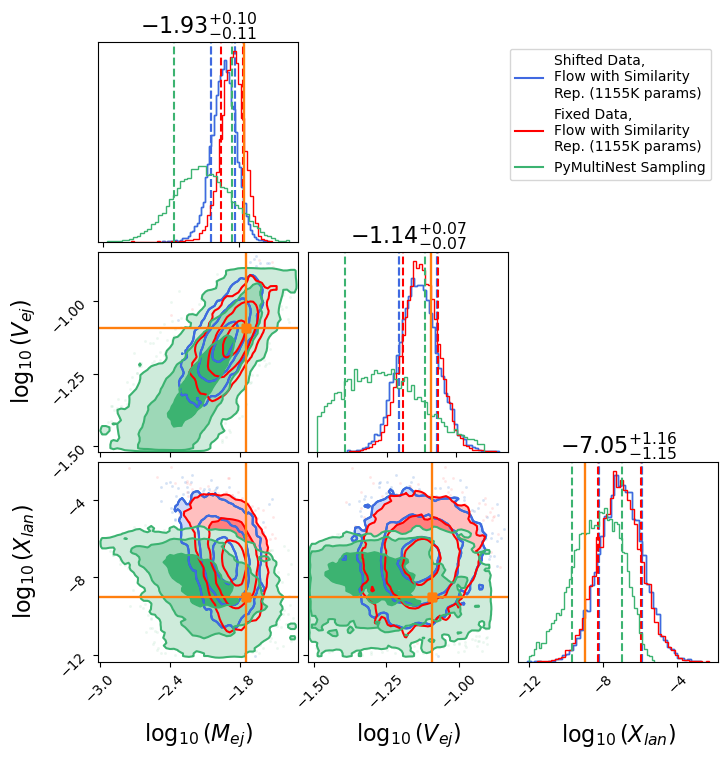

In [145]:
comparison_plot(1, '1155K', 1, fixed_available=True)

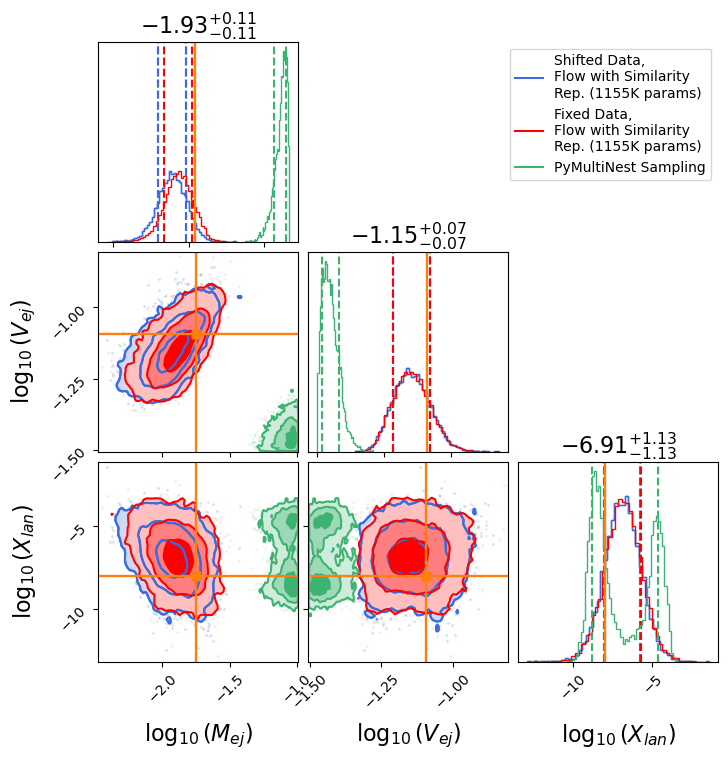

In [224]:
comparison_plot(4, '1155K', 1, fixed_available=True)

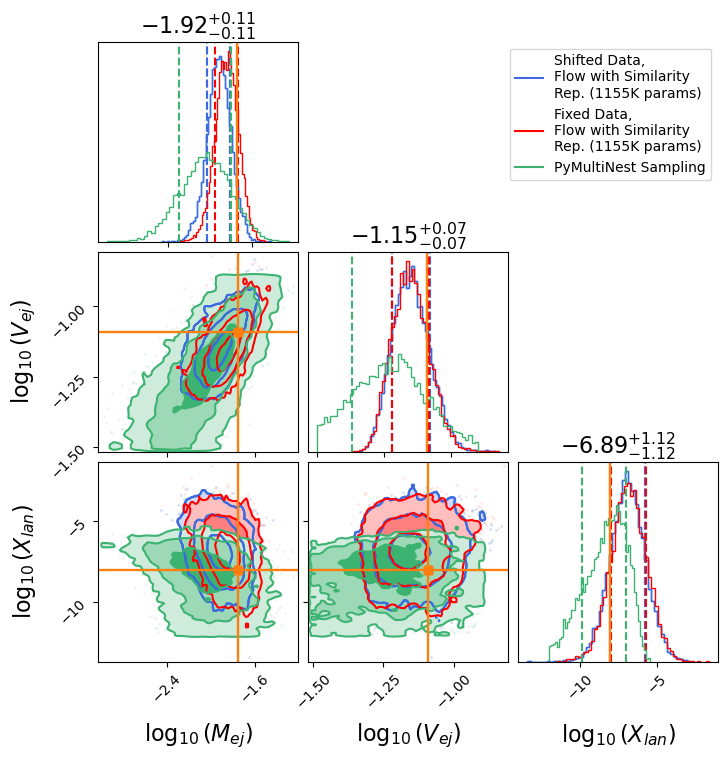

In [221]:
comparison_plot(5, '1155K', 2, fixed_available=True)

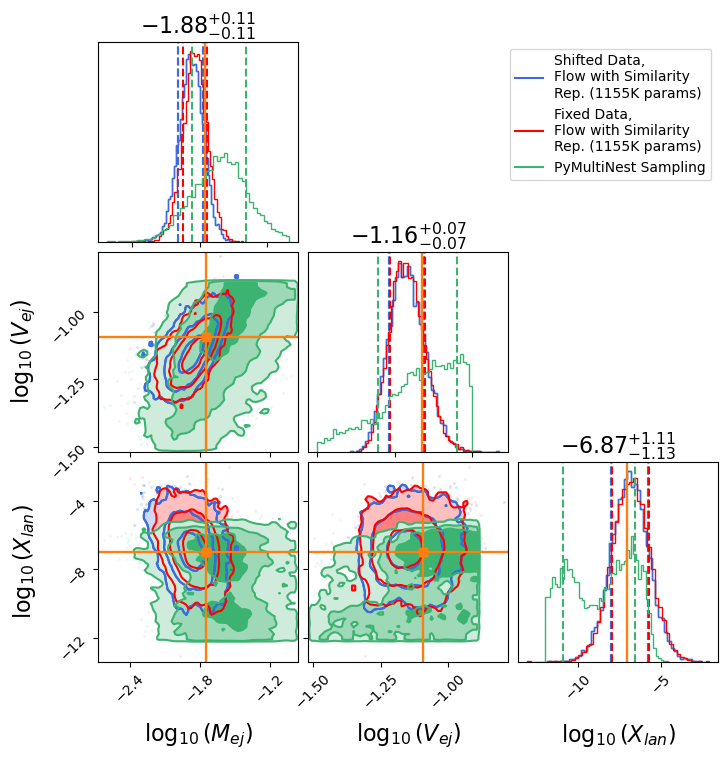

In [225]:
comparison_plot(8, '1155K', 2, fixed_available=True)

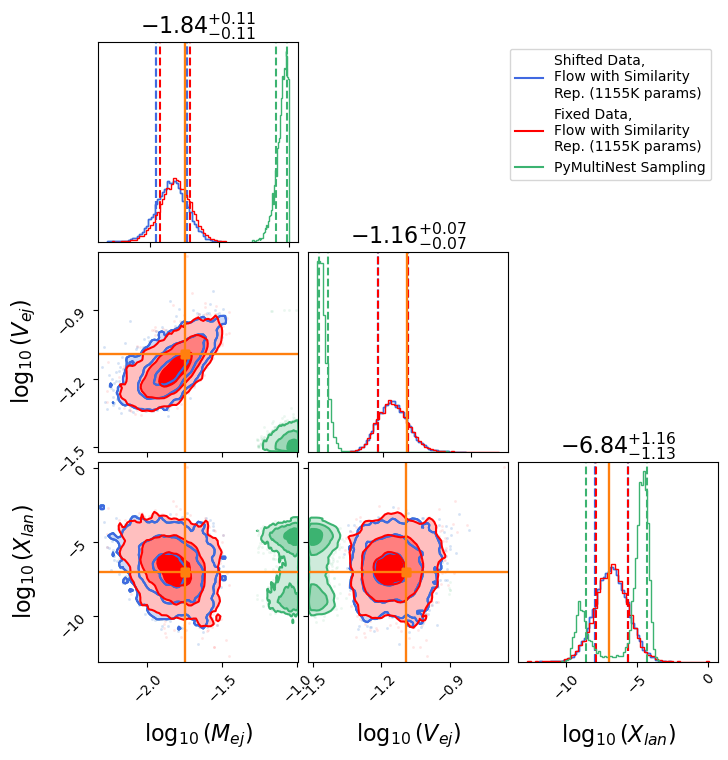

In [222]:
comparison_plot(9, '1155K', 3, fixed_available=True)

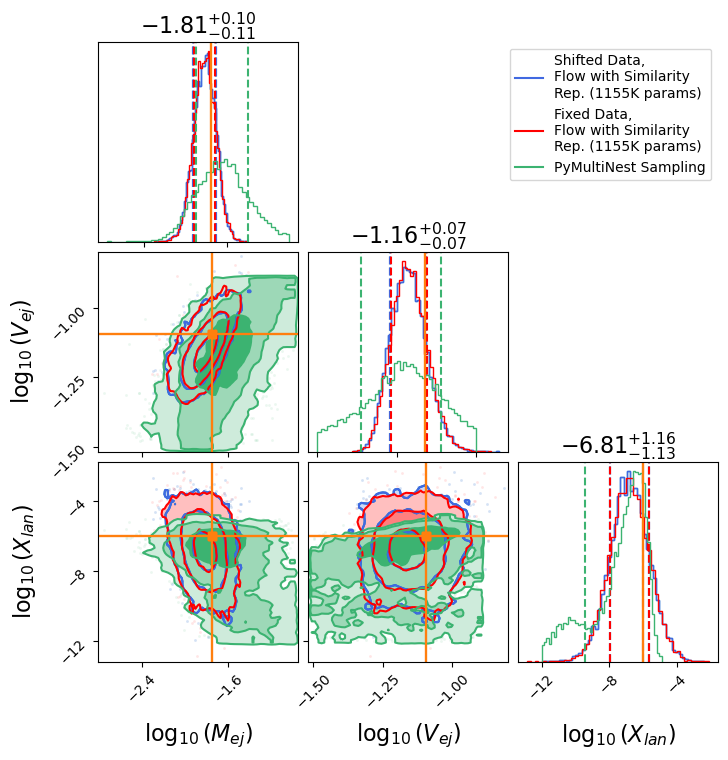

In [226]:
comparison_plot(12, '1155K', 3, fixed_available=True)

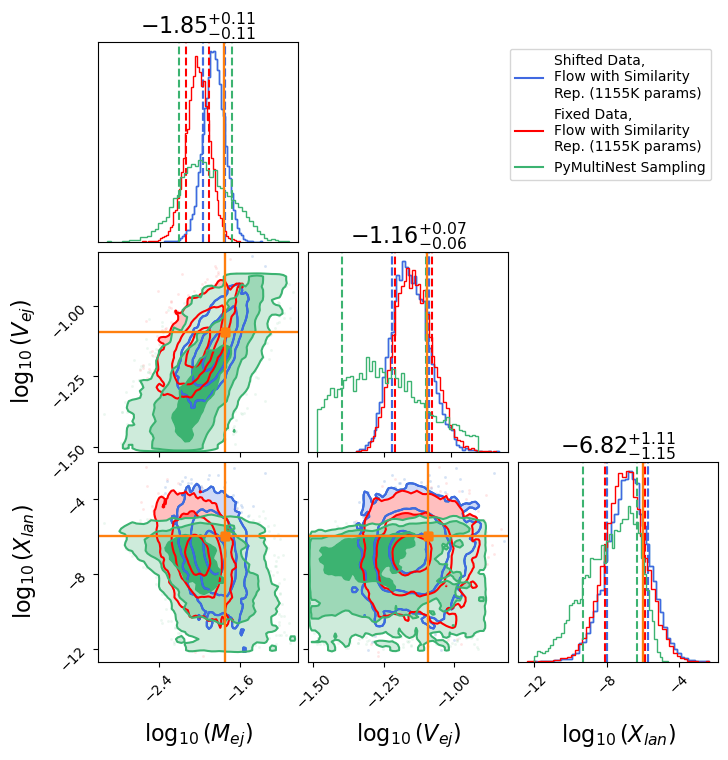

In [227]:
comparison_plot(13, '1155K', 4, fixed_available=True)

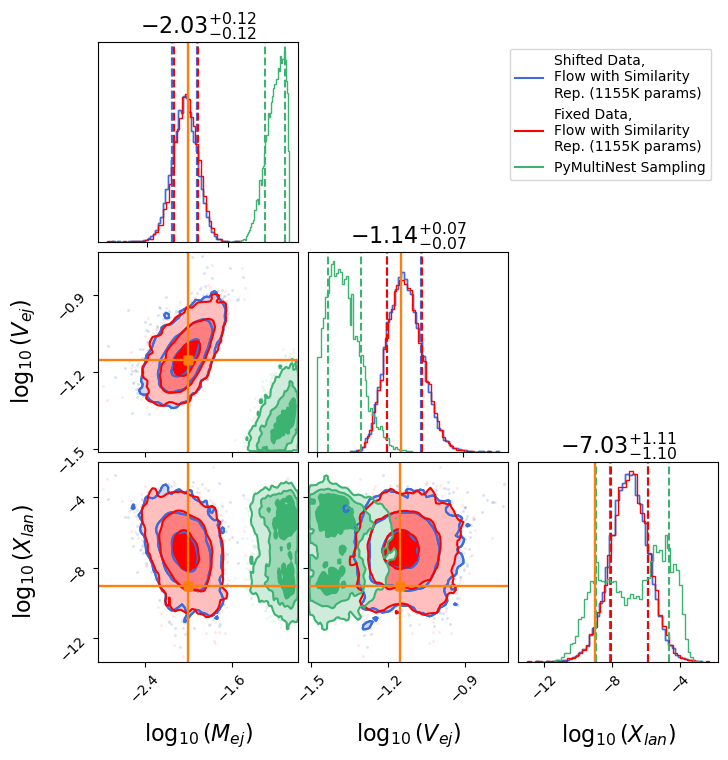

In [228]:
comparison_plot(16, '1155K', 4, fixed_available=True)

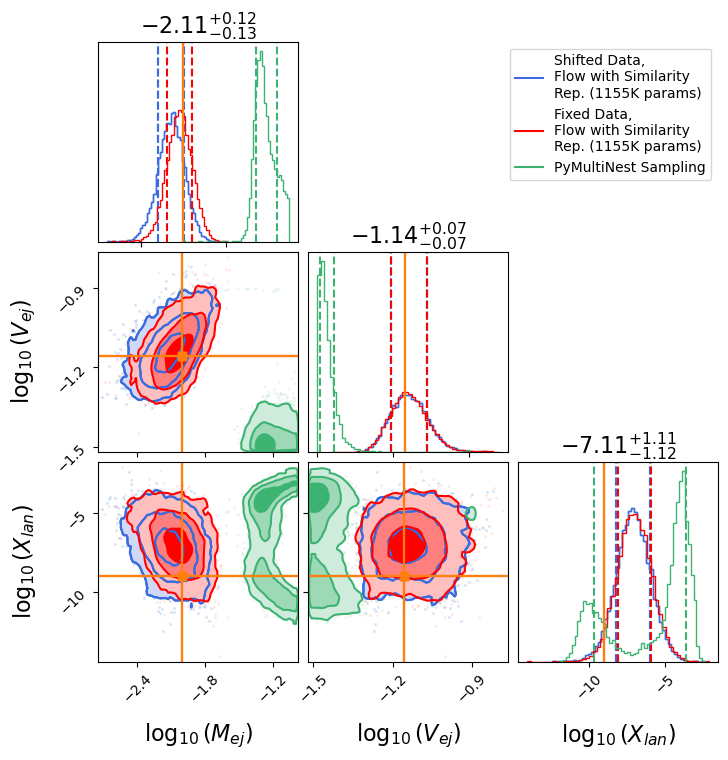

In [230]:
comparison_plot(17, '1155K', 5, fixed_available=True)

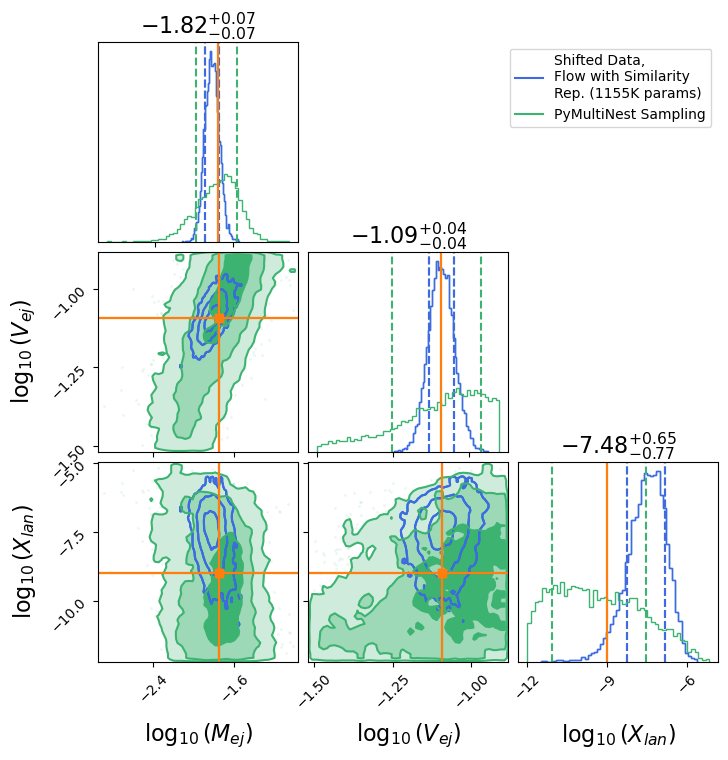

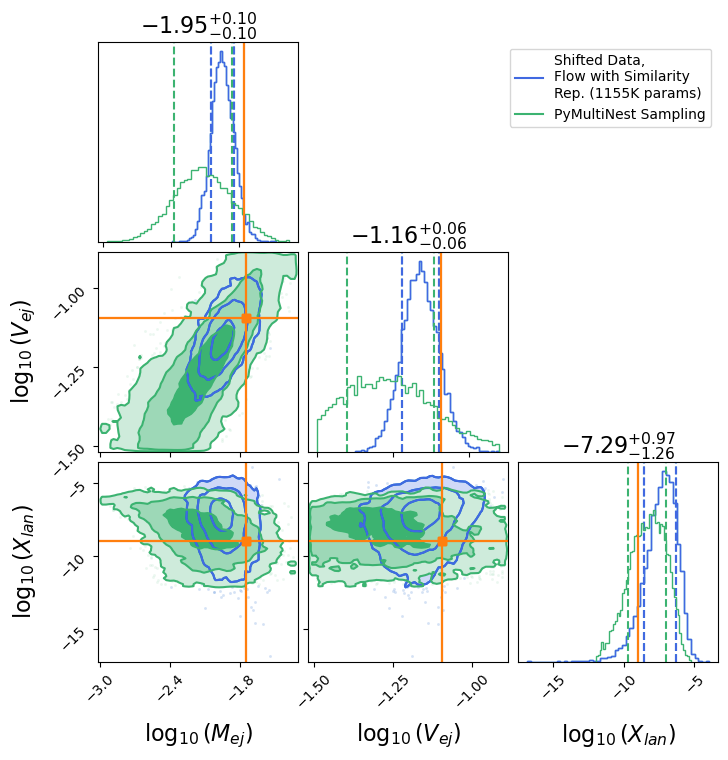

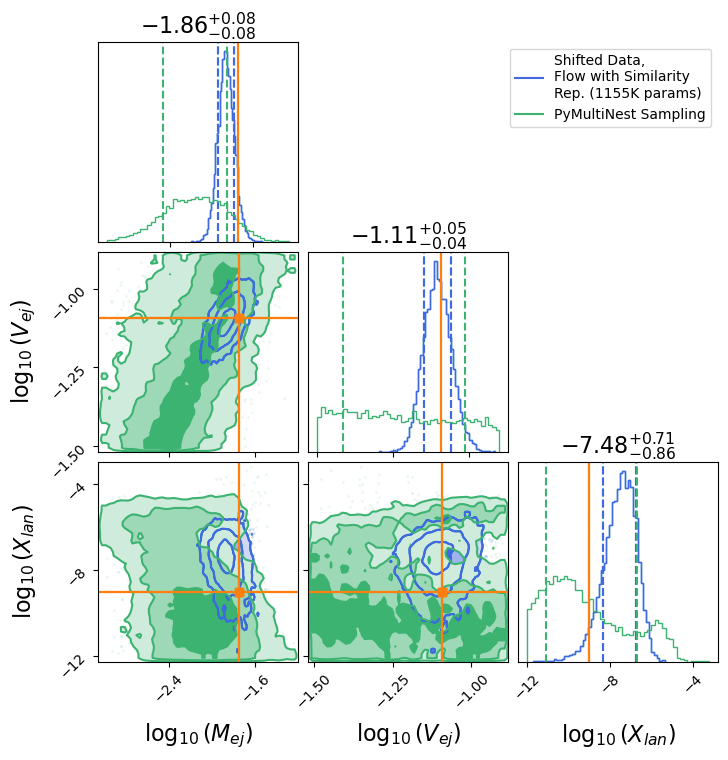

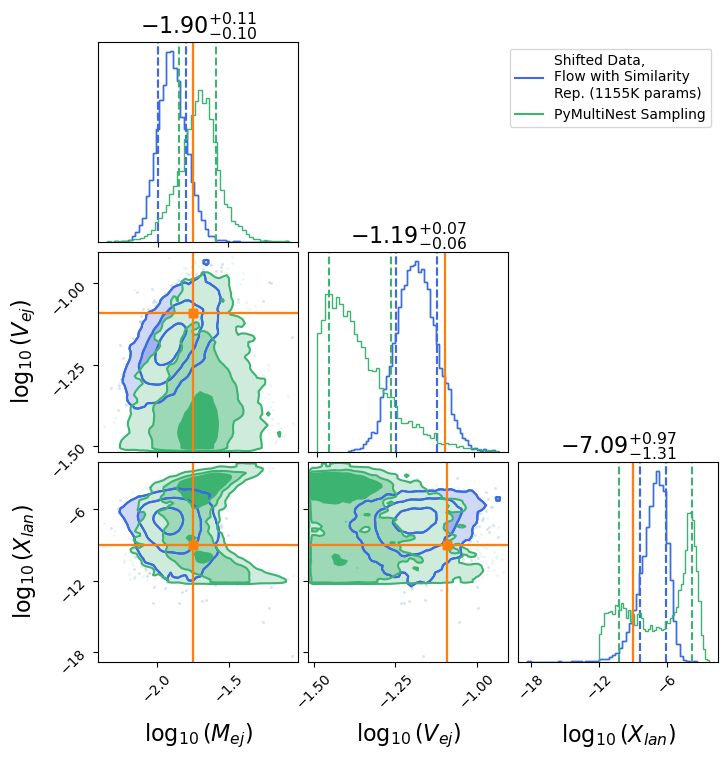

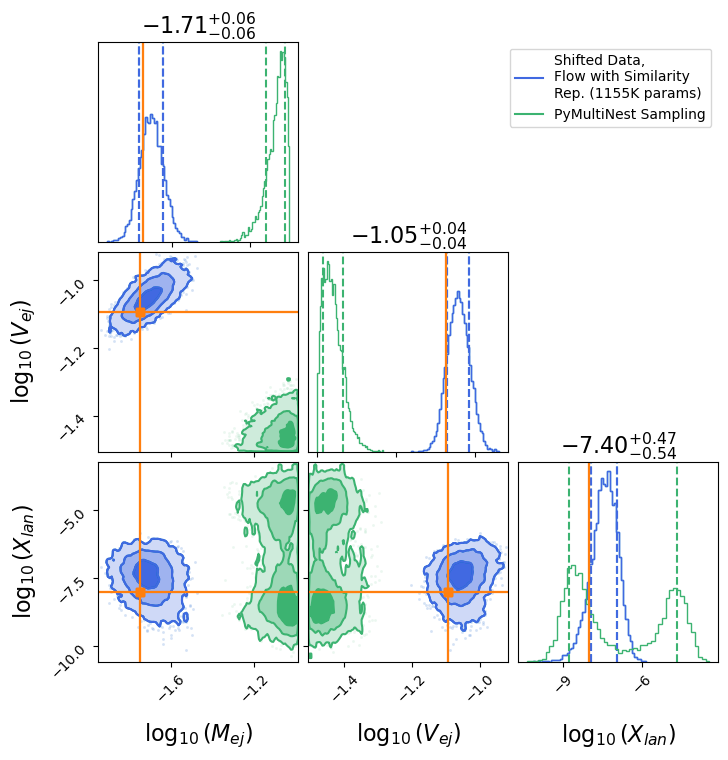

...

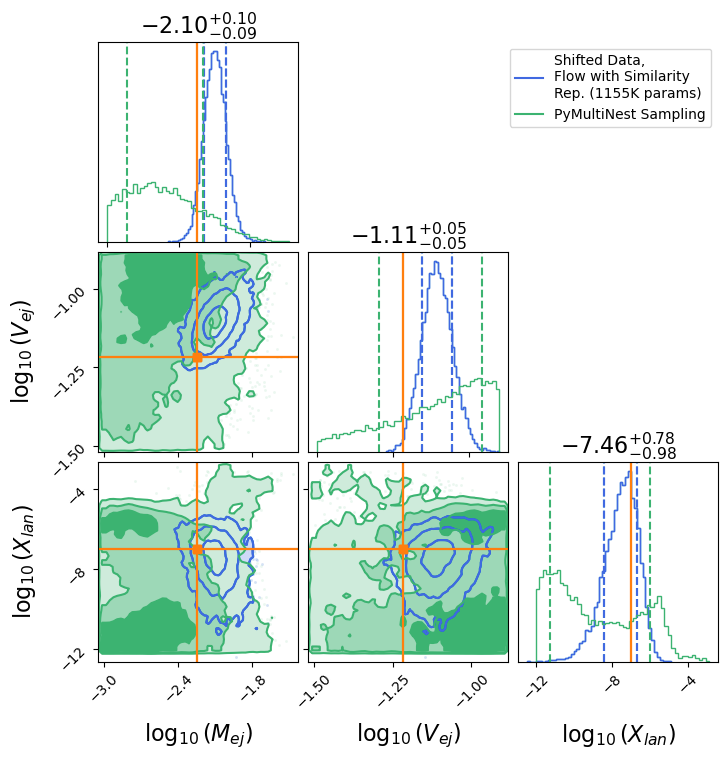

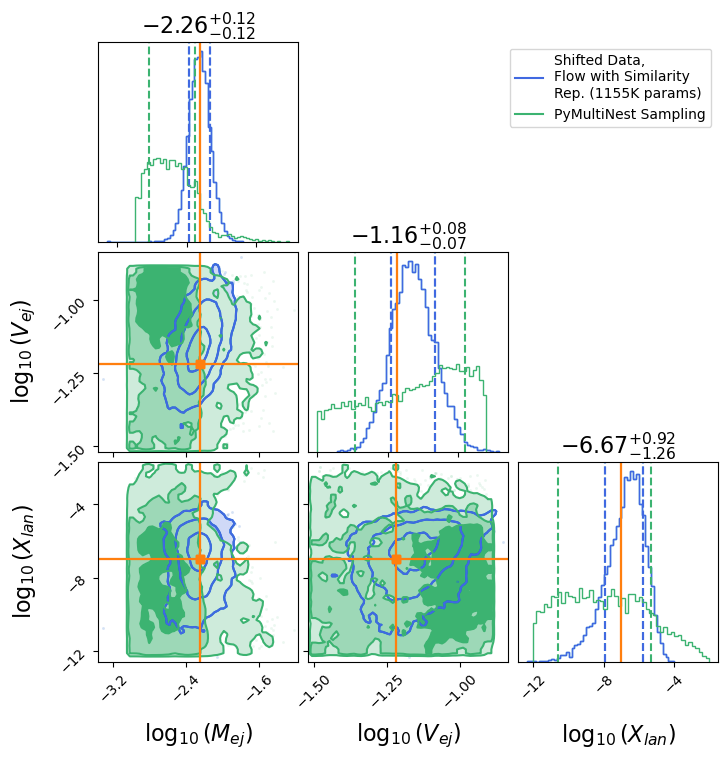

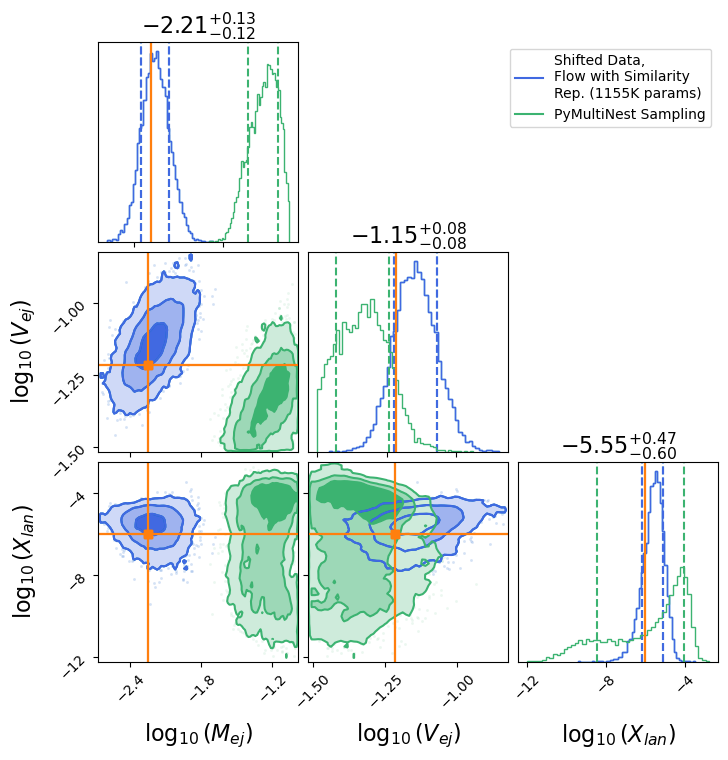

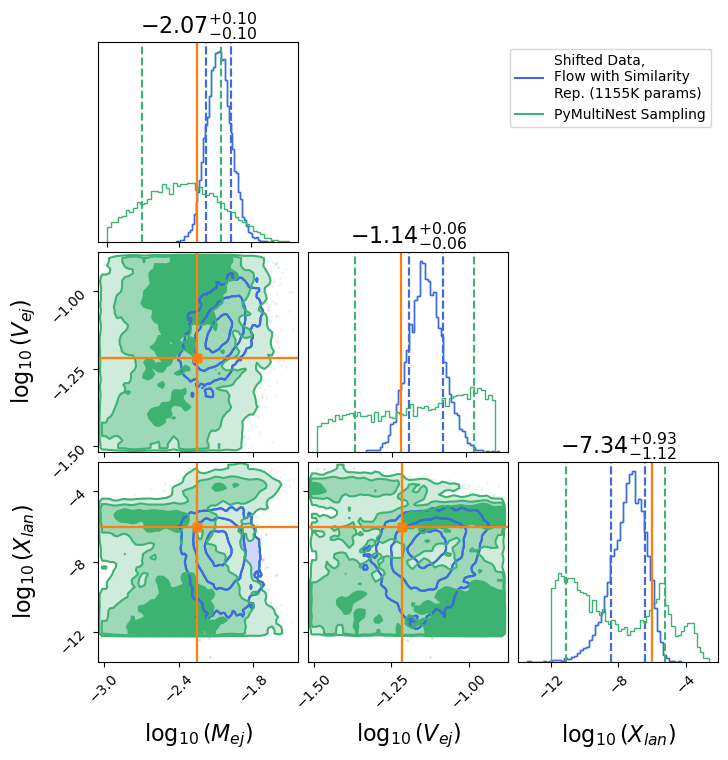

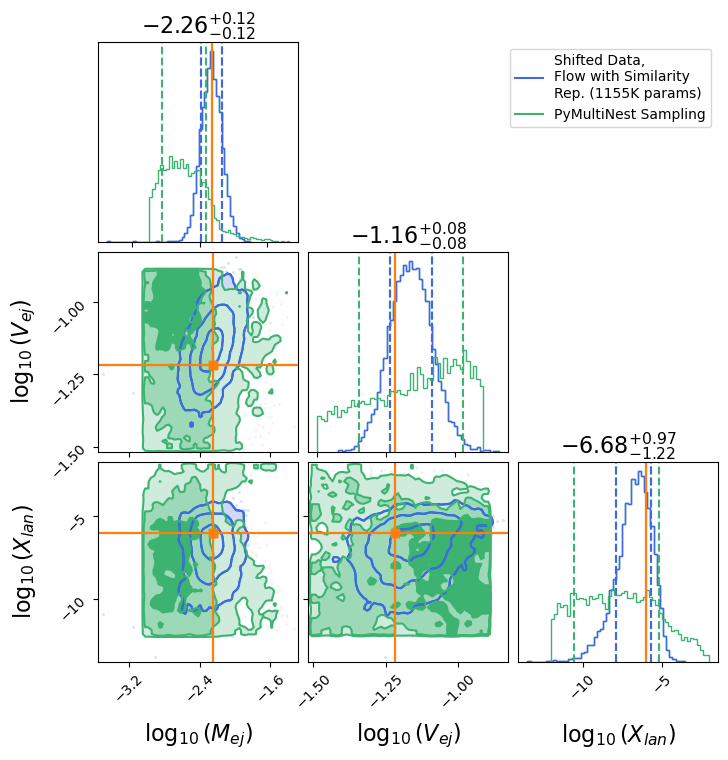

In [202]:
for i in range(len(test_sets)):
    if test_sets[i] == '9d' or test_sets[i] == '10d' or test_sets[i] == '11d' or test_sets[i] == '12d':
        pass
    else:
        comparison_plot(i, '1155K')
    

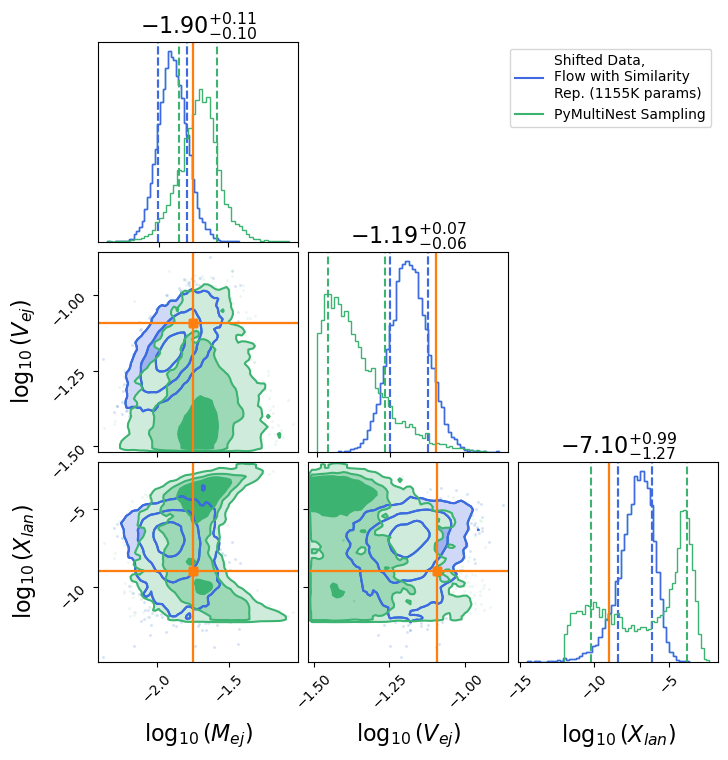

In [179]:
comparison_plot(3, '1155K')

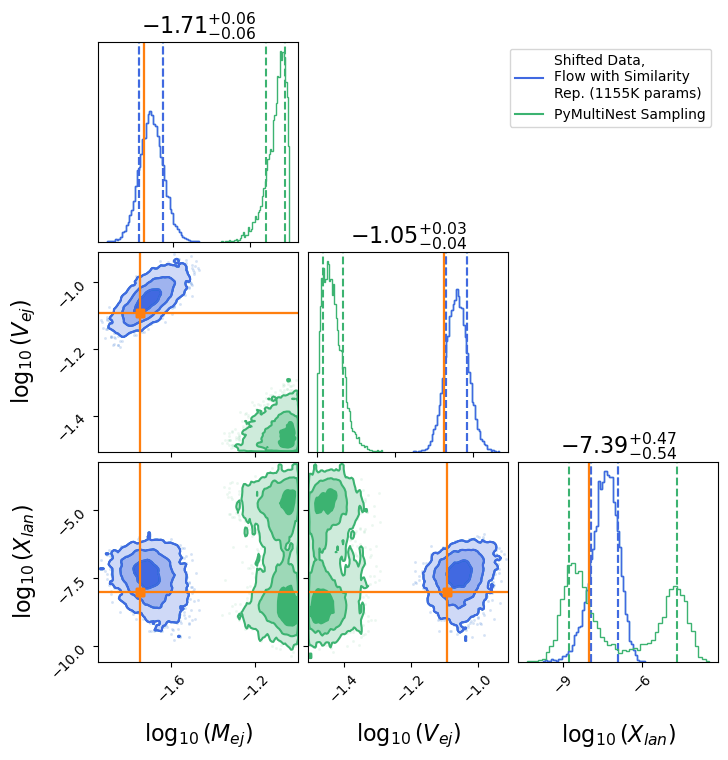

In [180]:
comparison_plot(4, '1155K')

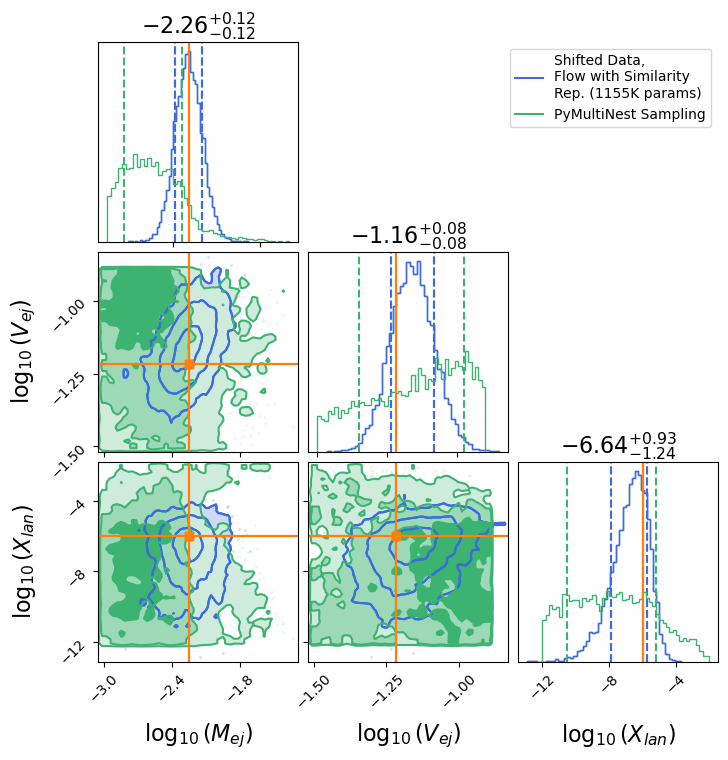

In [216]:
comparison_plot(46, '1155K')

# PP Plots

14:29 bilby INFO    : Key: KS-test p-value
14:29 bilby INFO    : log10_mej: 0.398170090034243
14:29 bilby INFO    : log10_vej: 0.015772194750154376
14:29 bilby INFO    : log10_Xlan: 0.012762039775144096
14:29 bilby INFO    : Combined p-value: 0.004400790372187406


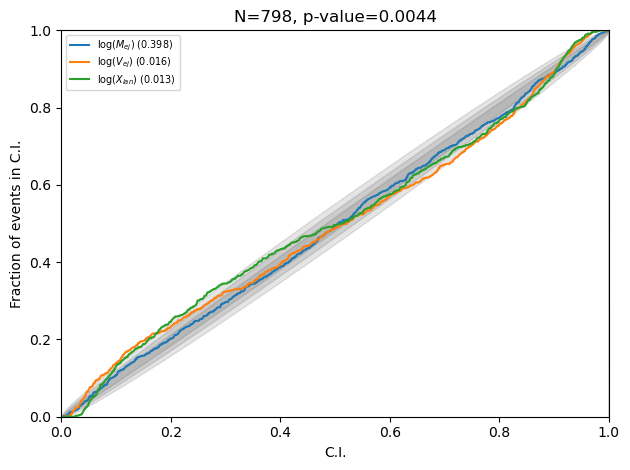

In [219]:

results = []
for idx, (shift_test, shift_orig, data_test, data_orig) in enumerate(test_data_loader_flow):
    #_ = _.reshape((-1,)+_.shape[2:])
    data_test = data_test.reshape((-1,)+data_test.shape[2:])
    # data_orig = data_orig.reshape((-1,)+data_orig.shape[2:])
    shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    with torch.no_grad():
        samples = flow.sample(1000, context=data_test[0].reshape((1, 3, num_points)))
    results.append(
        cast_as_bilby_result(samples.cpu().reshape(1000,3), shift_test[0][0].cpu()[...,0:3]))

import warnings
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    bilby.result.make_pp_plot(results, save=False, keys=['log10_mej', 'log10_vej', 'log10_Xlan'])

14:30 bilby INFO    : Key: KS-test p-value
14:30 bilby INFO    : log10_mej: 1.9727889809249058e-11
14:30 bilby INFO    : log10_vej: 0.0010169050753123876
14:30 bilby INFO    : log10_Xlan: 0.010693768289582661
14:30 bilby INFO    : Combined p-value: 1.475747060270362e-13


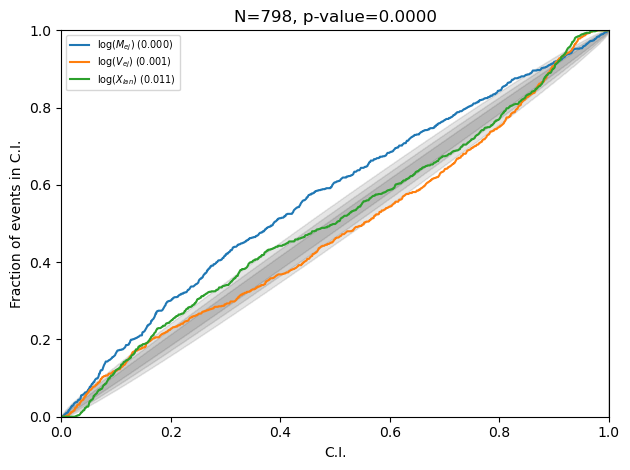

In [220]:
results = []
for idx, (shift_test, shift_orig, data_test, data_orig) in enumerate(test_data_loader_flow):
    shift_orig = shift_orig.reshape((-1,)+shift_orig.shape[2:])
    # data_test = data_test.reshape((-1,)+data_test.shape[2:])
    data_orig = data_orig.reshape((-1,)+data_orig.shape[2:])
    # shift_test = shift_test.reshape((-1,)+shift_test.shape[2:])
    with torch.no_grad():
        samples = flow.sample(1000, context=data_orig[0].reshape((1, 3, num_points)))
    results.append(
        cast_as_bilby_result(samples.cpu().reshape(1000,3), shift_orig[0][0].cpu()[...,0:3]))

import warnings
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    bilby.result.make_pp_plot(results, save=False, keys=['log10_mej', 'log10_vej', 'log10_Xlan'])